# DRD2 junctions

DRD2S is ENST00000346454.7

DRD2L is ENST00000362072.7

Here, we look at DRD2 junction expression in case/control and in control/schizoNoAP/schizoAP. 

We look at eQTL and directionality.

# Finding DRD2 junctions

In [1]:
import re
import os, errno
import functools
import subprocess
import numpy as np
import pandas as pd
from plotnine import *
from gtfparse import read_gtf
from pandas_plink import read_plink
from warnings import filterwarnings
from matplotlib.cbook import mplDeprecation

In [2]:
filterwarnings("ignore",category=mplDeprecation)
filterwarnings('ignore', category=UserWarning, module='plotnine.*')
filterwarnings('ignore', category=DeprecationWarning, module='plotnine.*')

In [3]:
gtf = read_gtf("/ceph/genome/human/gencode26/gtf.ALL/_m/gencode.v26.chr_patch_hapl_scaff.annotation.gtf")

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'havana_gene', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'tag', 'havana_transcript', 'exon_number', 'exon_id', 'ont', 'protein_id', 'ccdsid']


In [4]:
drd2le = gtf[(gtf['transcript_id']=='ENST00000362072.7') & (gtf['feature']=='exon')]
drd2le

,seqname,source,feature,start,end,score,strand,frame,gene_id,gene_type,...,transcript_type,transcript_name,transcript_support_level,tag,havana_transcript,exon_number,exon_id,ont,protein_id,ccdsid
1461211,chr11,HAVANA,exon,113475076,113475389,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,1,ENSE00002282098.1,,ENSP00000354859.3,CCDS8361.1
1461212,chr11,HAVANA,exon,113424367,113424682,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,2,ENSE00003665261.1,,ENSP00000354859.3,CCDS8361.1
1461215,chr11,HAVANA,exon,113418027,113418136,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,3,ENSE00003641994.1,,ENSP00000354859.3,CCDS8361.1
1461217,chr11,HAVANA,exon,113416863,113416999,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,4,ENSE00003790357.1,,ENSP00000354859.3,CCDS8361.1
1461219,chr11,HAVANA,exon,113415421,113415611,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,5,ENSE00003518665.1,,ENSP00000354859.3,CCDS8361.1
1461221,chr11,HAVANA,exon,113414375,113414461,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,6,ENSE00003475700.1,,ENSP00000354859.3,CCDS8361.1
1461223,chr11,HAVANA,exon,113412556,113412883,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,7,ENSE00001247012.2,,ENSP00000354859.3,CCDS8361.1
1461225,chr11,HAVANA,exon,113409615,113410920,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-001,1,"basic,appris_principal_2,CCDS",OTTHUMT00000395834.1,8,ENSE00002210277.1,,ENSP00000354859.3,CCDS8361.1


In [5]:
gtf[(gtf['transcript_id']=='ENST00000346454.7') & (gtf['feature']=='exon')]

,seqname,source,feature,start,end,score,strand,frame,gene_id,gene_type,...,transcript_type,transcript_name,transcript_support_level,tag,havana_transcript,exon_number,exon_id,ont,protein_id,ccdsid
1461192,chr11,HAVANA,exon,113475076,113475120,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,1,ENSE00002281939.1,,ENSP00000278597.5,CCDS8362.1
1461193,chr11,HAVANA,exon,113424367,113424682,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,2,ENSE00003665261.1,,ENSP00000278597.5,CCDS8362.1
1461196,chr11,HAVANA,exon,113418027,113418136,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,3,ENSE00003641994.1,,ENSP00000278597.5,CCDS8362.1
1461198,chr11,HAVANA,exon,113416863,113416999,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,4,ENSE00003790357.1,,ENSP00000278597.5,CCDS8362.1
1461200,chr11,HAVANA,exon,113415421,113415611,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,5,ENSE00003518665.1,,ENSP00000278597.5,CCDS8362.1
1461202,chr11,HAVANA,exon,113412556,113412883,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,6,ENSE00001247012.2,,ENSP00000278597.5,CCDS8362.1
1461204,chr11,HAVANA,exon,113409615,113410920,NaN,-,0,ENSG00000149295.13,protein_coding,...,protein_coding,DRD2-003,1,"basic,CCDS",OTTHUMT00000395833.1,7,ENSE00002210277.1,,ENSP00000278597.5,CCDS8362.1


In [6]:
def junction_name_reader():
    with subprocess.Popen('''cut -f 1 /ceph/projects/v3_phase3_paper/inputs/gtex_v8/junction_expression/_m/drd2_junctions_expr_gtex_v8.txt | tail -n +2 ''',
                           shell=True, stdout=subprocess.PIPE) as p:
        for line in p.stdout:
            l = line.rstrip().decode()
            m = re.search("^([^_]+)_(\d+)_(\d+)$", l)
            yield (l, m.group(1), int(m.group(2))-1, int(m.group(3))+1)

@functools.lru_cache()
def get_chr11_junctions():
    df = pd.DataFrame.from_records(junction_name_reader(), 
                                   columns=['junction_id', 'chrom', 'start', 'end'])
    return df

In [7]:
dfj = get_chr11_junctions()
dfj.head()

,junction_id,chrom,start,end
0,chr11_113410921_113412555,chr11,113410920,113412556
1,chr11_113412884_113413334,chr11,113412883,113413335
2,chr11_113412884_113414374,chr11,113412883,113414375
3,chr11_113412884_113415420,chr11,113412883,113415421
4,chr11_113413341_113414374,chr11,113413340,113414375


In [8]:
dfj[ np.abs(dfj['start'] - 113412883) < 10 ]

INFO:numexpr.utils:Note: NumExpr detected 64 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


,junction_id,chrom,start,end
1,chr11_113412884_113413334,chr11,113412883,113413335
2,chr11_113412884_113414374,chr11,113412883,113414375
3,chr11_113412884_113415420,chr11,113412883,113415421


In [9]:
drd2j = drd2le.merge(dfj, left_on='start', right_on='end')
drd2j

,seqname,source,feature,start_x,end_x,score,strand,frame,gene_id,gene_type,...,havana_transcript,exon_number,exon_id,ont,protein_id,ccdsid,junction_id,chrom,start_y,end_y
0,chr11,HAVANA,exon,113475076,113475389,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,1,ENSE00002282098.1,,ENSP00000354859.3,CCDS8361.1,chr11_113424683_113475075,chr11,113424682,113475076
1,chr11,HAVANA,exon,113475076,113475389,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,1,ENSE00002282098.1,,ENSP00000354859.3,CCDS8361.1,chr11_113474416_113475075,chr11,113474415,113475076
2,chr11,HAVANA,exon,113424367,113424682,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,2,ENSE00003665261.1,,ENSP00000354859.3,CCDS8361.1,chr11_113418137_113424366,chr11,113418136,113424367
3,chr11,HAVANA,exon,113418027,113418136,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,3,ENSE00003641994.1,,ENSP00000354859.3,CCDS8361.1,chr11_113415612_113418026,chr11,113415611,113418027
4,chr11,HAVANA,exon,113418027,113418136,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,3,ENSE00003641994.1,,ENSP00000354859.3,CCDS8361.1,chr11_113417000_113418026,chr11,113416999,113418027
5,chr11,HAVANA,exon,113416863,113416999,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,4,ENSE00003790357.1,,ENSP00000354859.3,CCDS8361.1,chr11_113415612_113416862,chr11,113415611,113416863
6,chr11,HAVANA,exon,113415421,113415611,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,5,ENSE00003518665.1,,ENSP00000354859.3,CCDS8361.1,chr11_113412884_113415420,chr11,113412883,113415421
7,chr11,HAVANA,exon,113415421,113415611,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,5,ENSE00003518665.1,,ENSP00000354859.3,CCDS8361.1,chr11_113414462_113415420,chr11,113414461,113415421
8,chr11,HAVANA,exon,113414375,113414461,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,6,ENSE00003475700.1,,ENSP00000354859.3,CCDS8361.1,chr11_113412884_113414374,chr11,113412883,113414375
9,chr11,HAVANA,exon,113414375,113414461,NaN,-,0,ENSG00000149295.13,protein_coding,...,OTTHUMT00000395834.1,6,ENSE00003475700.1,,ENSP00000354859.3,CCDS8361.1,chr11_113413341_113414374,chr11,113413340,113414375


In [10]:
config = {
    'biomart_file': '../_h/biomart.csv',
    'caudate_snps': '../_h/drd2_junctions_pgc2_eqtls.txt',
    'phenotype_file': "/ceph/projects/v3_phase3_paper/inputs/gtex_v8/phenotypes/_m/gtex_v8_sample_data.txt",
    'eqtl_residual_expression_file': '../../../residualized_expression/_m/junctions_residualized_expression.csv',
    'plink_file_prefix': '/ceph/projects/v3_phase3_paper/inputs/gtex_v8/genotypes_chr11/subset_caudate/_m/gtex_v8_chr11',
    'matrixeqtl_output_file': '../../_m/cis_eqtl_junctions.ctxt',
    'gwas_snp_file': '/ceph/projects/v3_phase3_paper/inputs/gtex_v8/genotypes_chr11/subset_caudate/pgc2_map/_m/libd_hg38_pggc2sz_snps.tsv',
}

# Plotting eQTLs

In [11]:
@functools.lru_cache()
def get_biomart_df():
    biomart = pd.read_csv(config['biomart_file'])
    biomart['description'] = biomart['description'].str.replace('\[Source.*$','')
    return biomart


@functools.lru_cache()
def get_eqtl_residual_expression_df():
    eqtl_residual_expression_df = pd.read_csv(config['eqtl_residual_expression_file'], index_col=0).transpose()
    return eqtl_residual_expression_df


@functools.lru_cache()
def get_pheno_df():
    pheno_df = pd.read_csv(config['phenotype_file'], index_col=0)
    return pheno_df


@functools.lru_cache()
def get_eqtl_expression_and_pheno_df():
    return pd.merge(get_pheno_df(), get_eqtl_residual_expression_df(), left_index=True, right_index=True)

In [12]:
def get_gene_symbol(gene_id, biomart=get_biomart_df()):
    ensge = re.sub('\..+$','', gene_id)
    ggg = biomart[biomart['ensembl_gene_id']==ensge]
    if ggg.shape[0]==0:
        return '', ''

    gs = ggg['external_gene_name'].values[0]
    de = ggg['description'].values[0]
    if type(de)!=str:
        de = ''
        
    de = re.sub('\[Source:.*$','',de)
    return gs, de

In [13]:
@functools.lru_cache()
def get_gene_id_df():
    return pd.DataFrame({'gene_id': get_eqtl_residual_expression_df().columns,
                         'ensembl_gene_id': get_eqtl_residual_expression_df().columns.str.replace('\..+$','')})


@functools.lru_cache()
def gene_info_from_symbol(gene_symbol):
    
    gene_id_df = get_gene_id_df()
    biomart=get_biomart_df()
    r = biomart[biomart['external_gene_name']==gene_symbol].merge(gene_id_df, on='ensembl_gene_id', how='left')
    
#      gene_id_dict = get_residual_expression_df().columns.str.replace('\..+$','')
    return r


@functools.lru_cache()
def gene_id_from_symbol(gene_symbol):
    df = gene_info_from_symbol(gene_symbol)
    assert df.shape[0] == 1
    
    return df[['gene_id']].iloc[0].values[0]


@functools.lru_cache()
def get_plink_tuple():
    '''
    Usage: (bim, fam, bed) = get_plink_tuple()
    '''
    return read_plink(config['plink_file_prefix'])


@functools.lru_cache()
def get_eqtl_df():
    return pd.read_csv(config['matrixeqtl_output_file'], sep='\t', header=None, 
                       names=['SNP', 'gene', 'beta', 't-stat', 'p-value', 'FDR'])


@functools.lru_cache()
def get_gwas_snps():
    return pd.read_csv(config['gwas_snp_file'], sep='\t', index_col=0)
 

In [14]:
def get_gwas_snp(snp_id):
    gwas = get_gwas_snps()
    r = gwas[gwas['our_snp_id']==snp_id]
    assert len(r) == 1
    return r


def letter_snp(number, a0, a1):
    '''
    Example:
    letter_snp(0, 'A', 'G') is 'AA'
    letter_snp(1, 'A', 'G') is 'AG'
    letter_snp(2, 'A', 'G') is 'GG'
    
    '''
    if np.isnan(number):
        return np.nan
    
    if len(a0)==1 and len(a1)==1:
        sep = ''
    else:
        sep = ' '
    return sep.join(sorted([a0]*int(number) + [a1]*(2-int(number))))


In [15]:
@functools.lru_cache()
def get_plink_tuple():
    '''
    Usage: (bim, fam, bed) = get_plink_tuple()
    '''
    return read_plink(config['plink_file_prefix'])


@functools.lru_cache()
def get_snp_df(snp_id):
    '''
    Returns a dataframe containing the genotype on snp snp_id.
    The allele count is the same as in the plink files.
    
    Example: 
    get_snp_df('chr11_113501949_C_T_b38').head(2)
    
             	chr11_113501949_C_T_b38_num 	chr11_113501949_C_T_b38_letter 	chr11_113501949_C_T_b38
    GTEX-11WQC 	1 	CT 	1\nCT
    GTEX-14LZ3 	2 	TT 	2\nTT
    '''
    (bim, fam, bed) = get_plink_tuple()
    brain_ids = list(set(get_eqtl_expression_and_pheno_df().index).intersection(set(fam['fid'])))
    snp_info = bim[bim['snp']==snp_id]
    snp_pos = snp_info.iloc[0]['i']
    fam_pos = list(fam.set_index('fid').loc[brain_ids]['i'])
    dfsnp = (pd.DataFrame(bed[[snp_pos]].compute()[:,fam_pos], columns=brain_ids, index=[snp_id + '_num'])
             .transpose().dropna())
    my_letter_snp = functools.partial(letter_snp, a0=snp_info.iloc[0]['a0'], a1=snp_info.iloc[0]['a1'])
    dfsnp[[snp_id + '_num']] = 2 - dfsnp[[snp_id + '_num']].astype('int')
    dfsnp[snp_id + '_letter'] = dfsnp[snp_id + '_num'].apply(my_letter_snp)
    dfsnp[snp_id] = (dfsnp[snp_id + '_num'].astype('str') + '\n' + 
                     dfsnp[snp_id + '_letter'].astype('str')).astype('category')
    return dfsnp


@functools.lru_cache()
def get_gwas_ordered_snp_df(snp_id):
    '''
    Returns a dataframe containing the genotype on snp snp_id.
    The allele count is the number of risk alleles according to GWAS.
    
    Example: 
    get_gwas_ordered_snp_df('rs653953').head(5)
    
            rs653953_num rs653953_letter rs653953
Br5168             2              GG    2\nGG
Br2582             1              AG    1\nAG
Br2378             1              AG    1\nAG
Br5155             0              AA    0\nAA
Br5182             0              AA    0\nAA

    
    '''
    pgc = get_gwas_snps()
    dfsnp = get_snp_df(snp_id).copy()
    gwas_snp = get_gwas_snp(snp_id)
    
    if gwas_snp['pgc2_a1_same_as_our_counted'].iloc[0]:
        if gwas_snp['OR'].iloc[0] > 1:
            pass
        else:
            dfsnp[[snp_id + '_num']] = 2 - dfsnp[[snp_id + '_num']]
    else:
        if gwas_snp['OR'].iloc[0] > 1:
            dfsnp[[snp_id + '_num']] = 2 - dfsnp[[snp_id + '_num']]
        else:
            pass
        
    dfsnp[snp_id] = (dfsnp[snp_id + '_num'].astype('str') + '\n' + 
                     dfsnp[snp_id + '_letter'].astype('str')).astype('category')
    return dfsnp


@functools.lru_cache()
def get_risk_allele(snp_id):
    gwas_snp = get_gwas_snp(snp_id)
    if gwas_snp['OR'].iloc[0] > 1:
        ra = gwas_snp['A1'].iloc[0]
    else:
        ra = gwas_snp['A2'].iloc[0]
    return ra


@functools.lru_cache()
def get_gwas_eqtl_merge():
    gwas = get_gwas_snps()
    eqtl = get_eqtl_df()
    return eqtl.merge(gwas, left_on='SNP', right_on='our_snp_id', suffixes=['_eqtl', '_gwas'])
    

In [16]:
def mkdir_p(directory):
    try:
        os.makedirs(directory)
    except OSError as e:
        if e.errno != errno.EEXIST:
            raise
            

def save_plot(p, fn):
    for ext in ['png', 'pdf', 'svg']:
        p.save(fn + '.' + ext)


def gwas_annotation(snp_id):
    return 'SNP GWAS pvalue: %.1e' % get_gwas_snp(snp_id).iloc[0]['P']


def eqtl_gwas_annotation(snp_id, gene_id):
    eqtl_df = get_gwas_eqtl_merge()
    r = eqtl_df[(eqtl_df['SNP_eqtl']==snp_id) & (eqtl_df['gene']==gene_id)]
    assert len(r)==1
    matrix_sign = -1 # based on /ceph/users/apua/projects/chr11_gtex/_m
    sign = [-1,1][int(r.iloc[0]['pgc2_a1_same_as_our_counted'])] *\
        [-1,1][int(r.iloc[0]['OR'] > 1.0)] * matrix_sign
    return 'eQTL t-stat: %.2f  FDR: %.1e' % (sign * r.iloc[0]['t-stat'], r.iloc[0]['FDR'])


def risk_allele_annotation(snp_id):
    return 'SCZD risk allele: %s' % get_risk_allele(snp_id)


def gwas_annotated_eqtl_plot(snp_id, gene_id, title_prefix = []):
    p = simple_gwas_ordered_snp_expression_plot(snp_id, gene_id)
    title ="\n".join(title_prefix + [gwas_annotation(snp_id),
                     risk_allele_annotation(snp_id),
                     eqtl_gwas_annotation(snp_id, gene_id)
                     ])
    p += ggtitle(title) + ylab('Residualized Expression') 
    return p

In [17]:
@functools.lru_cache()
def get_gwas_ordered_snp_df(snp_id):
    '''
    Returns a dataframe containing the genotype on snp snp_id.
    The allele count is the number of risk alleles according to GWAS.
    
    Example: 
    get_gwas_ordered_snp_df('chr11_113501949_C_T_b38').head(2)
    
            chr11_113501949_C_T_b38_num 	chr11_113501949_C_T_b38_letter 	chr11_113501949_C_T_b38
    GTEX-11WQC 	1 	CT 	1\nCT
    GTEX-14LZ3 	2 	TT 	2\nTT    
    '''
    pgc = get_gwas_snps()
    dfsnp = get_snp_df(snp_id).copy()
    gwas_snp = get_gwas_snp(snp_id)
    if gwas_snp['pgc2_a1_same_as_our_counted'].iloc[0]:
        if gwas_snp['OR'].iloc[0] > 1:
            pass
        else:
            dfsnp[[snp_id + '_num']] = 2 - dfsnp[[snp_id + '_num']]
    else:
        if gwas_snp['OR'].iloc[0] > 1:
            dfsnp[[snp_id + '_num']] = 2 - dfsnp[[snp_id + '_num']]
        else:
            pass
    dfsnp[snp_id] = (dfsnp[snp_id + '_num'].astype('str') + '\n' + 
                     dfsnp[snp_id + '_letter'].astype('str')).astype('category')
    return dfsnp


@functools.lru_cache()
def get_pheno_df():
    pheno_df = pd.read_csv(config['phenotype_file'], index_col=3, sep='\t')
    return pheno_df.iloc[:, 0:15]


@functools.lru_cache()
def get_eqtl_expression_and_pheno_df():
    return pd.merge(get_pheno_df(), get_eqtl_residual_expression_df(), left_index=True, right_index=True)


@functools.lru_cache()
def get_risk_allele(snp_id):
    gwas_snp = get_gwas_snp(snp_id)
    if gwas_snp['OR'].iloc[0] > 1:
        ra = gwas_snp['A1'].iloc[0]
    else:
        ra = gwas_snp['A2'].iloc[0]
    return ra



In [18]:
def get_snp_gene_pheno_df(snp_id, gene_id, snp_df_func):
    pheno_columns = list(get_pheno_df().columns)
    expr_df = get_eqtl_expression_and_pheno_df()[pheno_columns + [gene_id]]
    snp_df =  snp_df_func(snp_id)
    return expr_df.merge(snp_df, left_index=True, right_index=True)
    

def simple_snp_expression_plot_impl(snp_id, gene_id, snp_df_func):
    df = get_snp_gene_pheno_df(snp_id, gene_id, snp_df_func)
    y0 = df[gene_id].quantile(.03) - 0.26
    y1 = df[gene_id].quantile(.97) + 0.26
    p = ggplot(df, aes(x=snp_id, y=gene_id)) \
    + theme_matplotlib()\
    + geom_boxplot(fill='red', alpha=0.4, outlier_alpha=0)\
    + geom_jitter(stroke=0, color='black', alpha=0.7, width=0.25)\
    + ylim(y0, y1)\
    + theme(axis_text=element_text(size=16), 
            axis_title=element_text(size=16, face='bold'), 
            plot_title=element_text(size=14))
    return p


def simple_gwas_ordered_snp_expression_plot(snp_id, gene_id):
    return simple_snp_expression_plot_impl(snp_id, gene_id, get_gwas_ordered_snp_df)


# DRD2

## Identifying drd2_junctions


In [19]:
drd2j[['start_x', 'end_x', 'exon_number', 'junction_id', 'start_y', 'end_y']]

,start_x,end_x,exon_number,junction_id,start_y,end_y
0,113475076,113475389,1,chr11_113424683_113475075,113424682,113475076
1,113475076,113475389,1,chr11_113474416_113475075,113474415,113475076
2,113424367,113424682,2,chr11_113418137_113424366,113418136,113424367
3,113418027,113418136,3,chr11_113415612_113418026,113415611,113418027
4,113418027,113418136,3,chr11_113417000_113418026,113416999,113418027
5,113416863,113416999,4,chr11_113415612_113416862,113415611,113416863
6,113415421,113415611,5,chr11_113412884_113415420,113412883,113415421
7,113415421,113415611,5,chr11_113414462_113415420,113414461,113415421
8,113414375,113414461,6,chr11_113412884_113414374,113412883,113414375
9,113414375,113414461,6,chr11_113413341_113414374,113413340,113414375


In [20]:
def get_drd2_junction_annotation(junction_id):
    return {
        'chr11_113410921_113412555': "DRD2 junction 7-8",
        'chr11_113412884_113414374': "DRD2 junction 6-7",
        'chr11_113412884_113415420': "DRD2 junction 5-7",
        'chr11_113413341_113414374': "DRD2 junction 6-7i",
        'chr11_113414462_113415420': "DRD2 junction 5-6",
        'chr11_113415612_113416862': "DRD2 junction 4-5",
        'chr11_113415612_113418026': "DRD2 junction 3-5",
        'chr11_113417000_113418026': "DRD2 junction 3-4",
        'chr11_113418137_113424366': "DRD2 junction 2-3",
        'chr11_113424683_113475075': "DRD2 junction 1-2",
        'chr11_113474416_113475075': "DRD2 junction 1-2i"}[junction_id]

# Junction eQTLs

In [21]:
drd2_junctions = set(drd2j['junction_id'])
drd2_junctions

{'chr11_113410921_113412555',
 'chr11_113412884_113414374',
 'chr11_113412884_113415420',
 'chr11_113413341_113414374',
 'chr11_113414462_113415420',
 'chr11_113415612_113416862',
 'chr11_113415612_113418026',
 'chr11_113417000_113418026',
 'chr11_113418137_113424366',
 'chr11_113424683_113475075',
 'chr11_113474416_113475075'}

In [22]:
phase3_snps = pd.read_csv(config['caudate_snps'], sep='\t')
phase3_snps[['SNP_eqtl', 'gene', 'SNP_gwas', 'hg38pos', 'rsid']].head()

,SNP_eqtl,gene,SNP_gwas,hg38pos,rsid
0,rs7934649:113372671:C:T,chr11:113412884-113415420(-),rs7934649:113372671:C:T,113501949,rs7934649
1,rs6589379:113374567:G:T,chr11:113412884-113415420(-),rs6589379:113374567:G:T,113503845,rs6589379
2,rs17601612:113317745:G:C,chr11:113412884-113415420(-),rs17601612:113317745:G:C,113447023,rs17601612
3,rs17601612:113317745:G:C,chr11:113410921-113412555(-),rs17601612:113317745:G:C,113447023,rs17601612
4,rs4938023:113374847:T:G,chr11:113412884-113415420(-),rs4938023:113374847:T:G,113504125,rs4938023


In [23]:
gwas_eqtl_df = get_gwas_eqtl_merge()
gwas_eqtl_df[['SNP_eqtl', 'gene', 'SNP_gwas', 'hg38pos', 'rsid']].head()

,SNP_eqtl,gene,SNP_gwas,hg38pos,rsid
0,chr11_113714594_G_A_b38,chr11_113418137_113424366,rs149645066:113585316:G:A,113714594,rs149645066
1,chr11_113714594_G_A_b38,chr11_113414462_113415420,rs149645066:113585316:G:A,113714594,rs149645066
2,chr11_113714594_G_A_b38,chr11_113417000_113418026,rs149645066:113585316:G:A,113714594,rs149645066
3,chr11_113714594_G_A_b38,chr11_113410921_113412555,rs149645066:113585316:G:A,113714594,rs149645066
4,chr11_113714594_G_A_b38,chr11_113413341_113414374,rs149645066:113585316:G:A,113714594,rs149645066


In [24]:
snps = pd.merge(phase3_snps[['SNP_eqtl', 'gene', 'SNP_gwas', 'hg38pos', 'rsid']], 
                gwas_eqtl_df[['SNP_eqtl', 'gene', 'SNP_gwas', 'hg38pos', 'rsid']], 
                on=['hg38pos', 'SNP_gwas', 'rsid'], suffixes=['_phase3', '_gtex'])
snps.groupby('SNP_eqtl_gtex').first().reset_index()

,SNP_eqtl_gtex,SNP_eqtl_phase3,gene_phase3,SNP_gwas,hg38pos,rsid,gene_gtex
0,chr11_113447023_G_C_b38,rs17601612:113317745:G:C,chr11:113412884-113415420(-),rs17601612:113317745:G:C,113447023,rs17601612,chr11_113418137_113424366
1,chr11_113457959_A_C_b38,rs7948028:113328681:A:C,chr11:113412884-113415420(-),rs7948028:113328681:A:C,113457959,rs7948028,chr11_113418137_113424366
2,chr11_113463378_C_T_b38,rs4337071:113334100:C:T,chr11:113412884-113415420(-),rs4337071:113334100:C:T,113463378,rs4337071,chr11_113418137_113424366
3,chr11_113463487_G_A_b38,rs4630328:113334209:G:A,chr11:113412884-113415420(-),rs4630328:113334209:G:A,113463487,rs4630328,chr11_113418137_113424366
4,chr11_113463505_CT_C_b38,rs34632468:113334227:CT:C,chr11:113412884-113415420(-),rs34632468:113334227:CT:C,113463505,rs34632468,chr11_113418137_113424366
5,chr11_113465450_G_A_b38,rs11601054:113336172:G:A,chr11:113412884-113415420(-),rs11601054:113336172:G:A,113465450,rs11601054,chr11_113418137_113424366
6,chr11_113466336_C_A_b38,rs61902787:113337058:C:A,chr11:113412884-113415420(-),rs61902787:113337058:C:A,113466336,rs61902787,chr11_113418137_113424366
7,chr11_113474190_T_C_b38,rs61902807:113344912:T:C,chr11:113412884-113415420(-),rs61902807:113344912:T:C,113474190,rs61902807,chr11_113418137_113424366
8,chr11_113478652_C_A_b38,rs7110440:113349374:C:A,chr11:113412884-113415420(-),rs7110440:113349374:C:A,113478652,rs7110440,chr11_113418137_113424366
9,chr11_113479213_C_CA_b38,rs35175482:113349935:C:CA,chr11:113412884-113415420(-),rs35175482:113349935:C:CA,113479213,rs35175482,chr11_113418137_113424366


Mapping files: 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


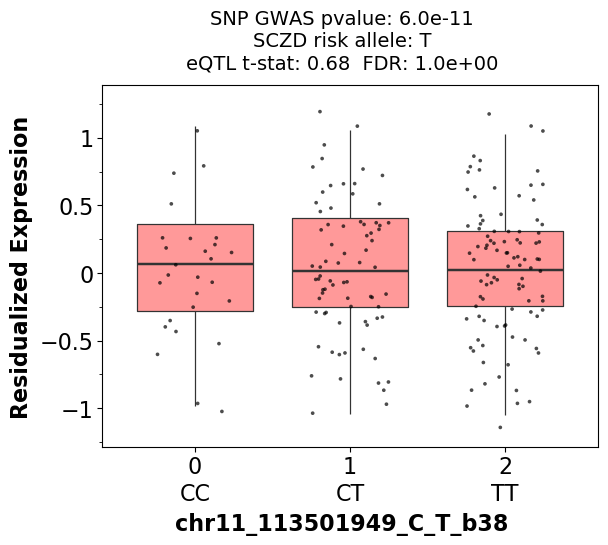

<ggplot: (8771524102840)>

In [25]:
pp = gwas_annotated_eqtl_plot('chr11_113501949_C_T_b38', 'chr11_113412884_113415420')
pp

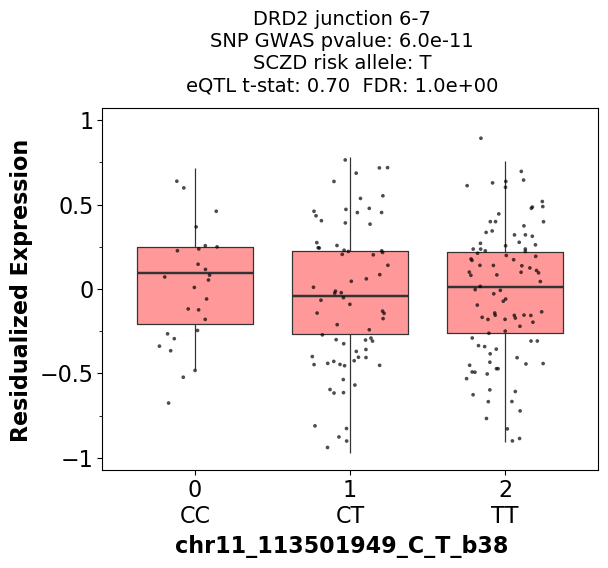

<ggplot: (8771523977292)>


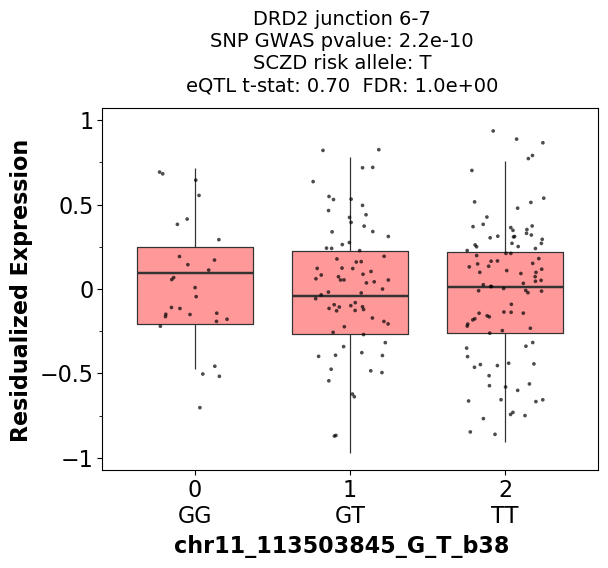

<ggplot: (8771523977454)>


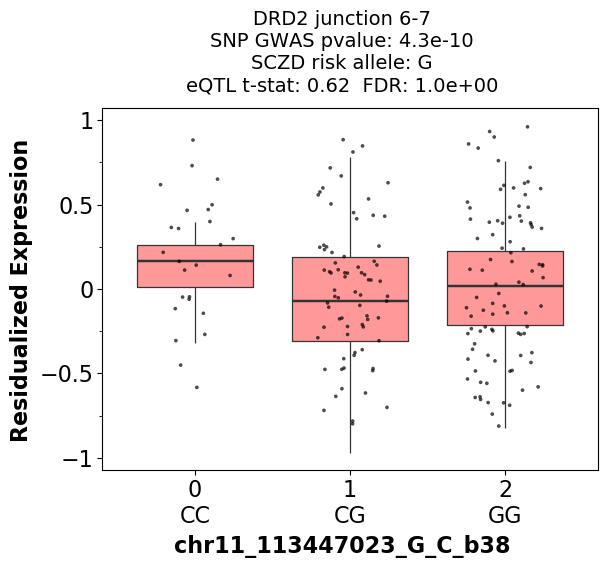

<ggplot: (8771524000714)>


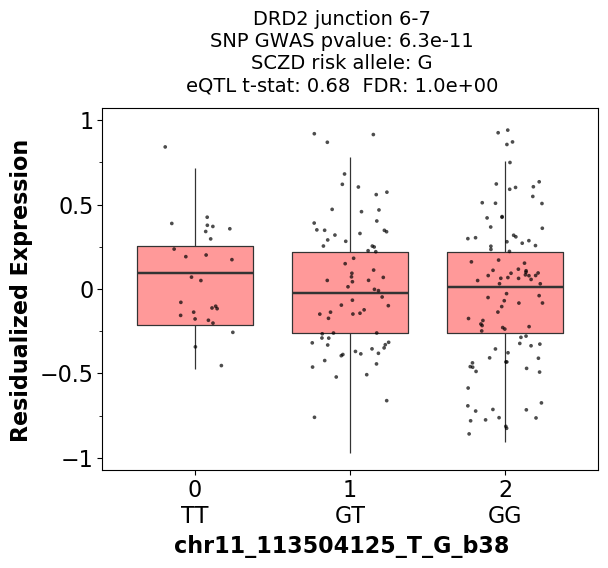

<ggplot: (8771523162179)>


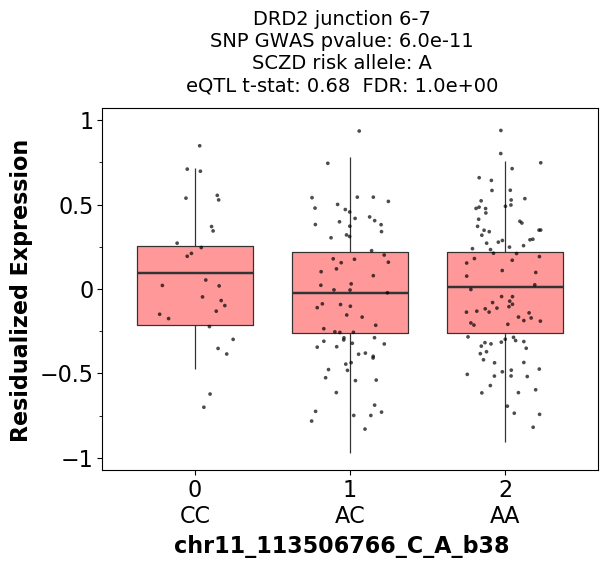

<ggplot: (8771523165151)>


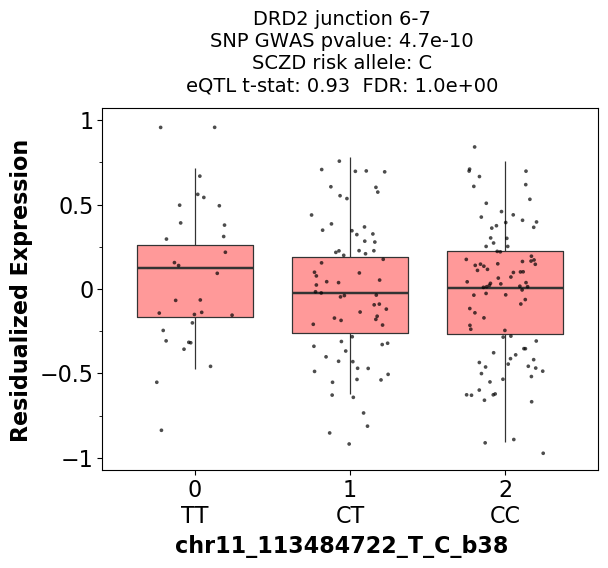

<ggplot: (8771523149385)>


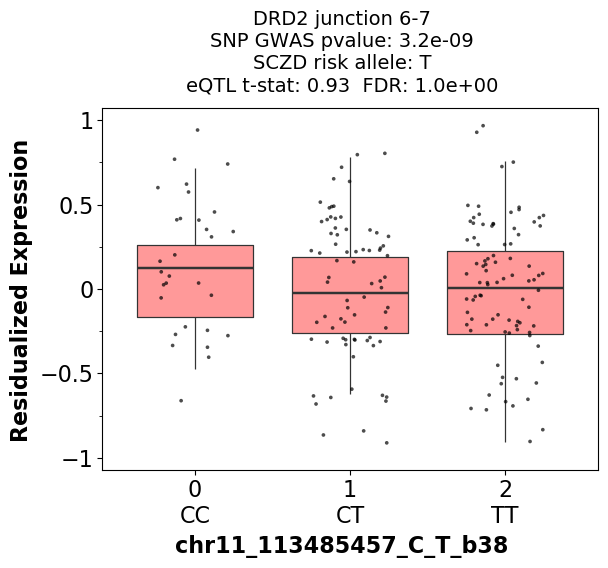

<ggplot: (8771523135940)>


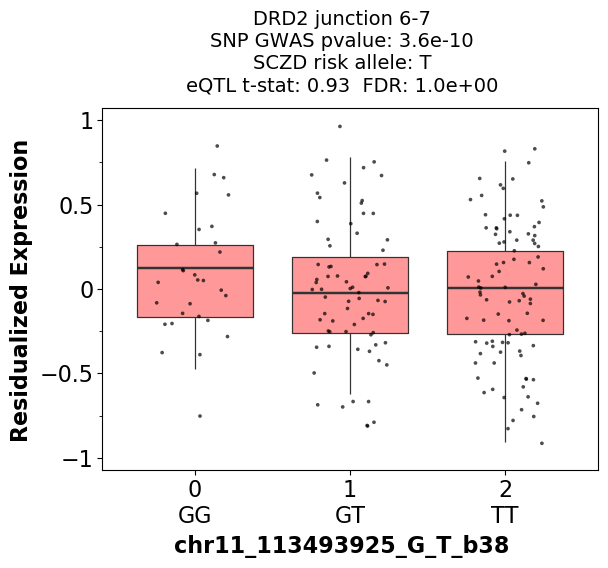

<ggplot: (8771524066157)>


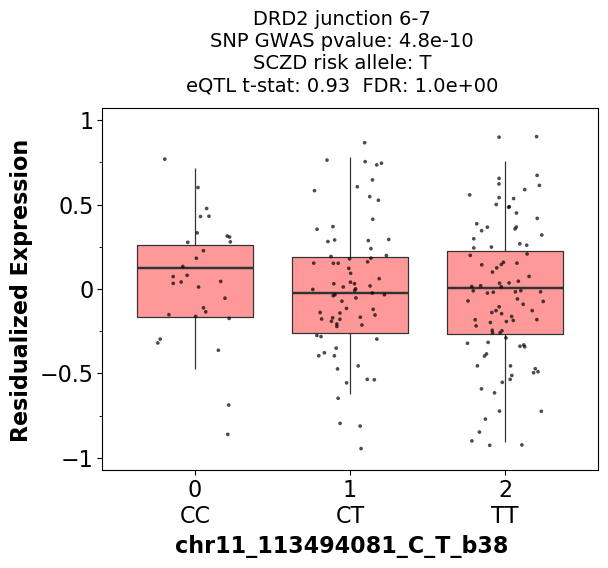

<ggplot: (8771523147722)>


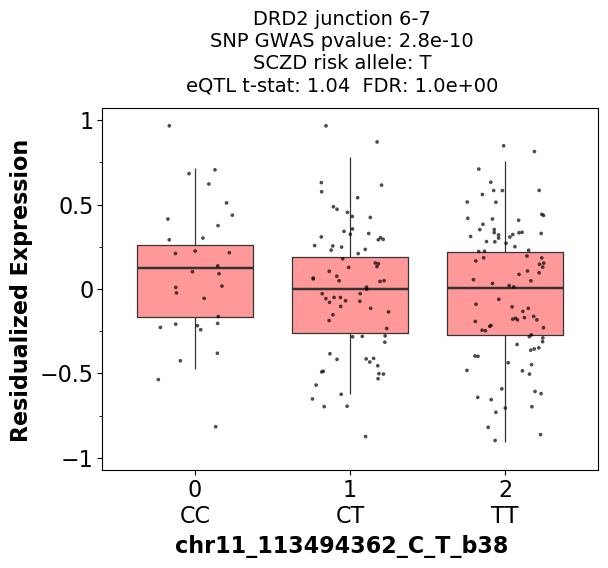

<ggplot: (8771523980159)>


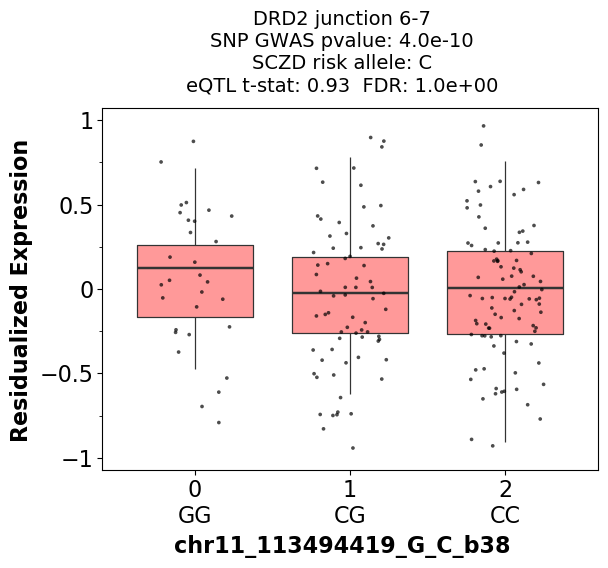

<ggplot: (8771523980541)>


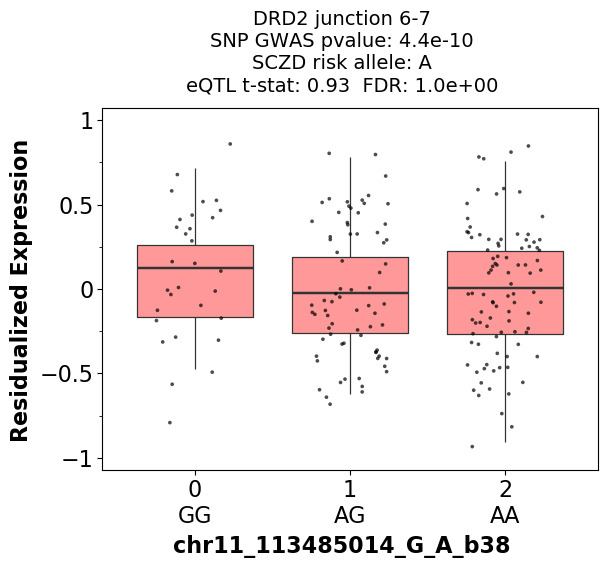

<ggplot: (8771445543985)>


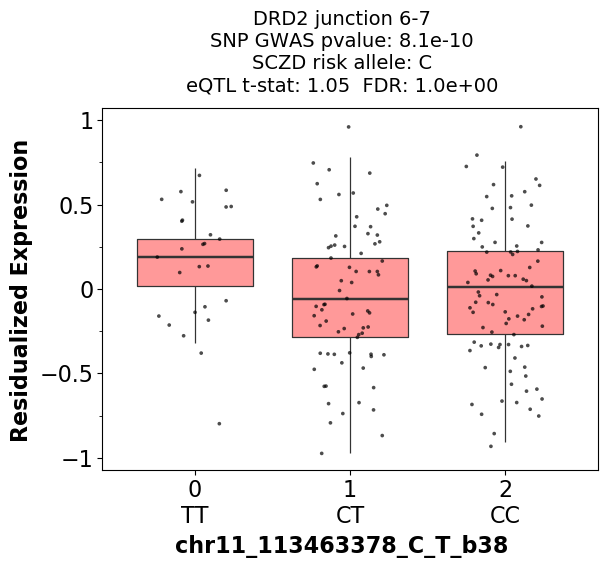

<ggplot: (8771445528848)>


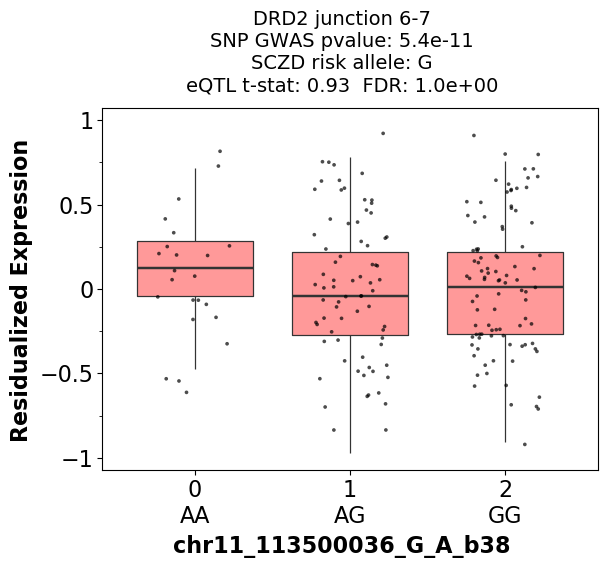

<ggplot: (8771445081125)>


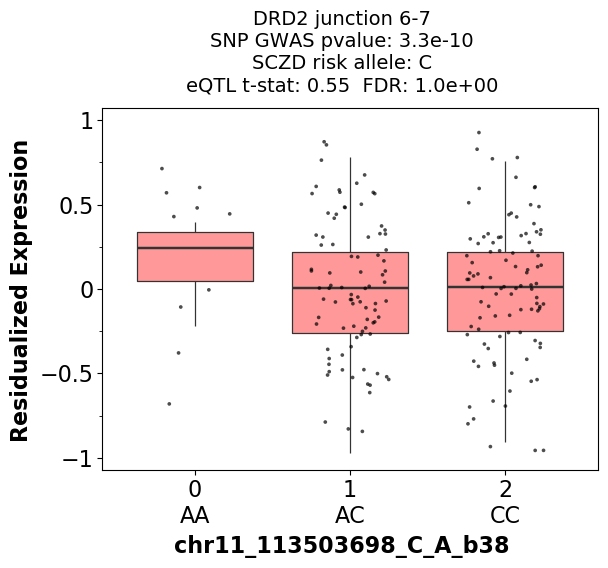

<ggplot: (8771445075917)>


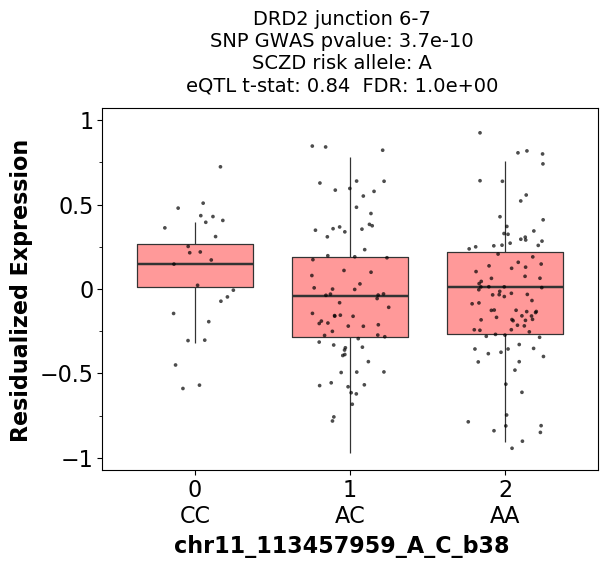

<ggplot: (8771445568618)>


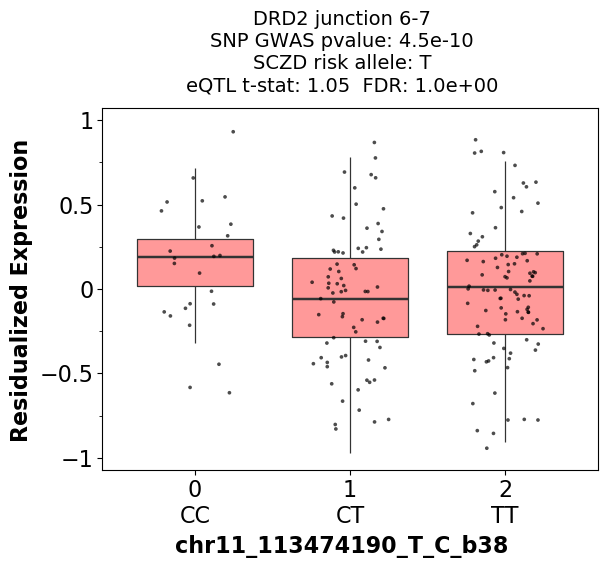

<ggplot: (8771523128438)>


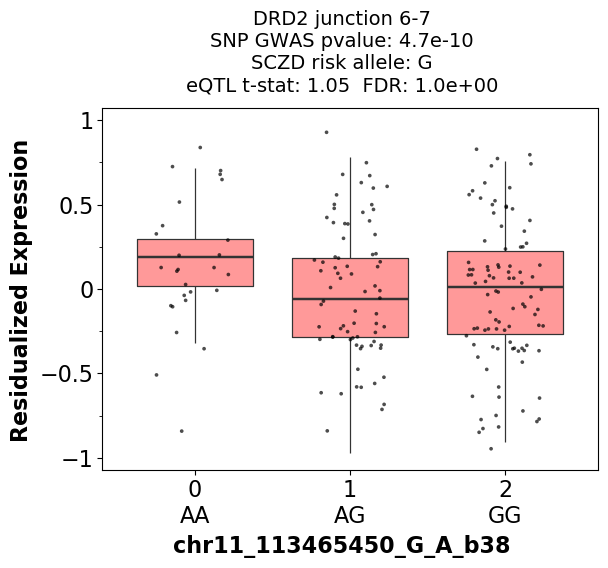

<ggplot: (8771523160248)>


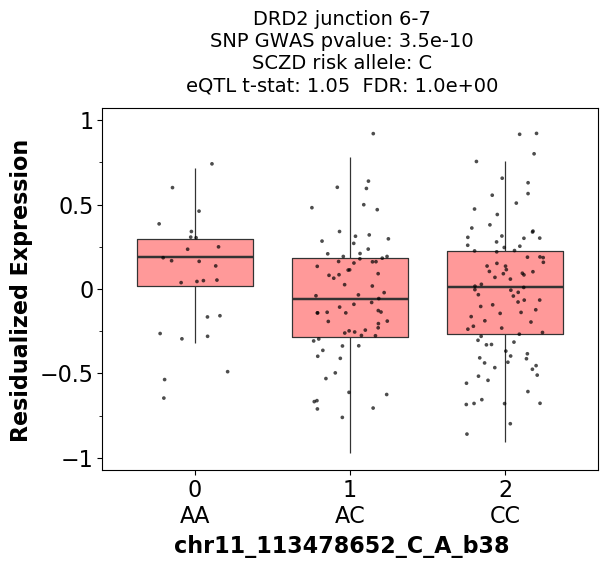

<ggplot: (8771523996374)>


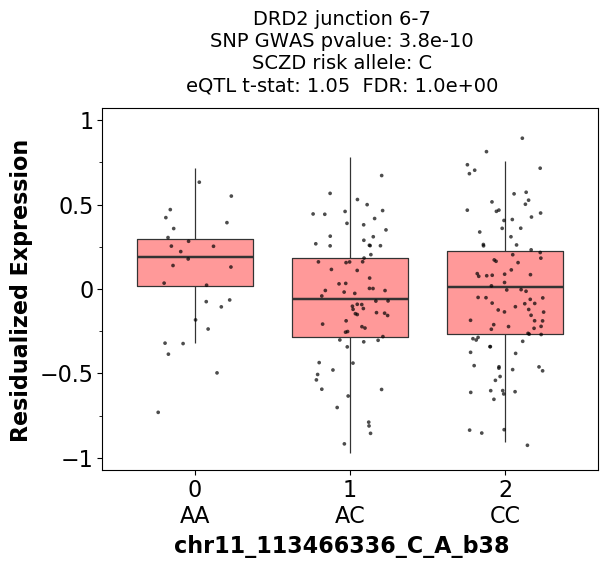

<ggplot: (8771524049122)>


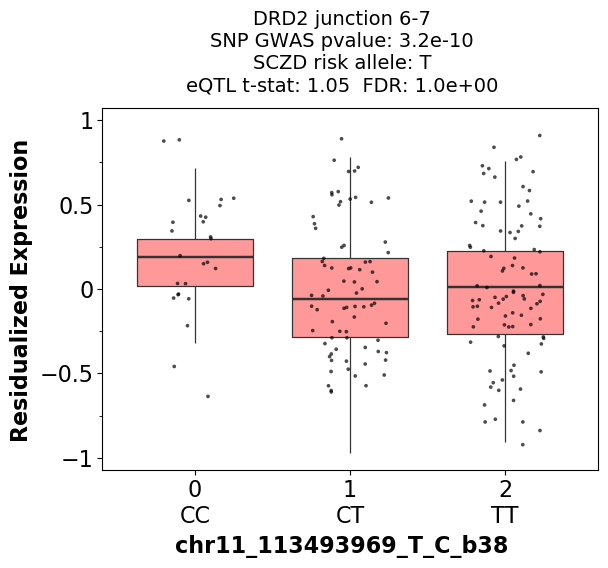

<ggplot: (8771523978996)>


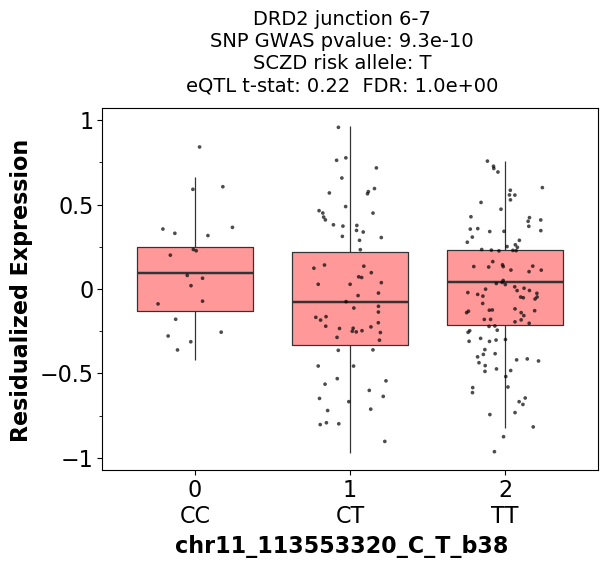

<ggplot: (8771445023630)>


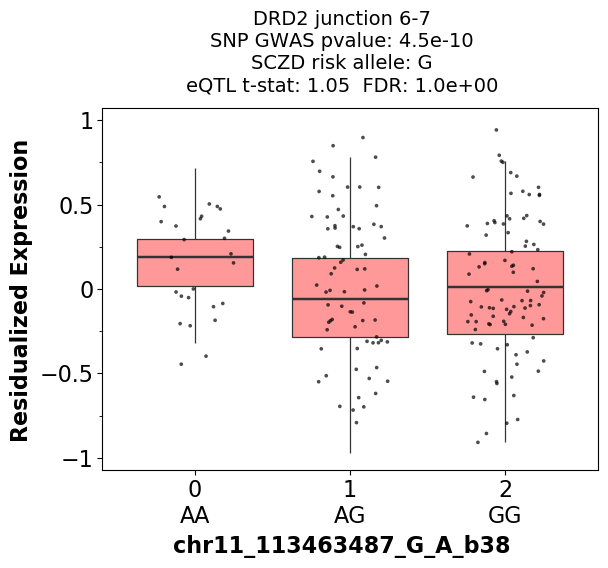

<ggplot: (8771600366478)>


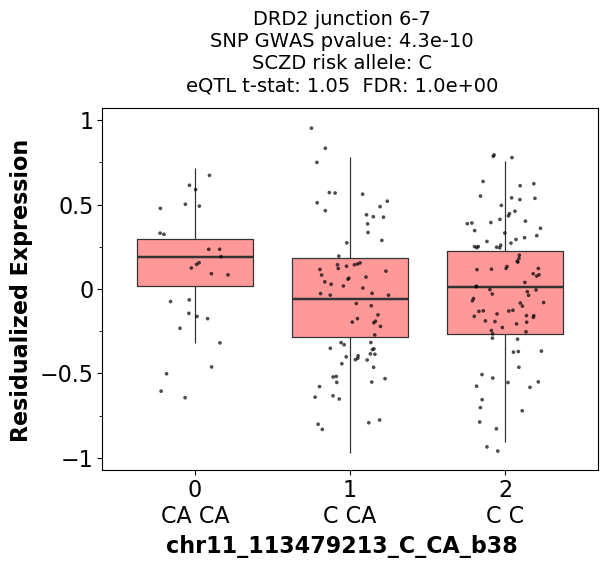

<ggplot: (8771445499627)>


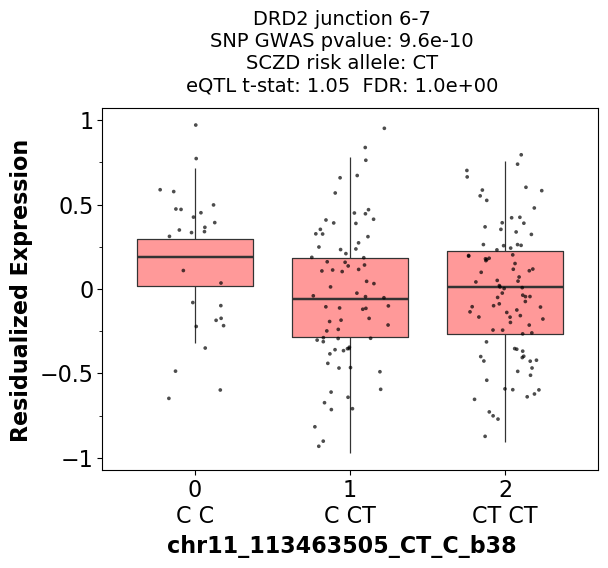

<ggplot: (8771445525983)>


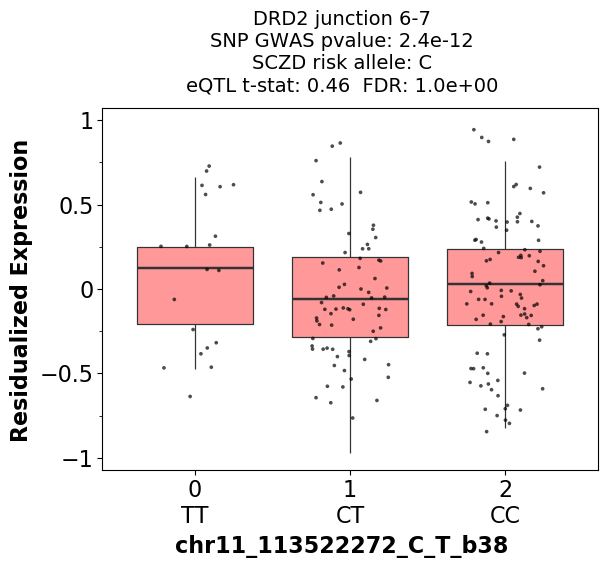

<ggplot: (8771445563700)>


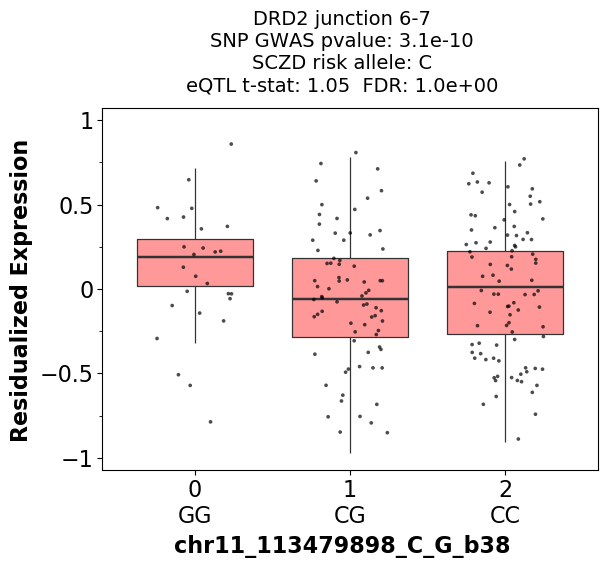

<ggplot: (8771524092459)>


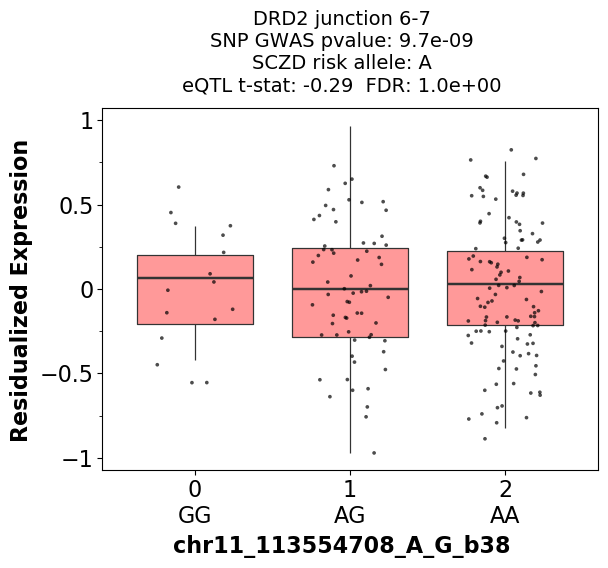

<ggplot: (8771524004359)>


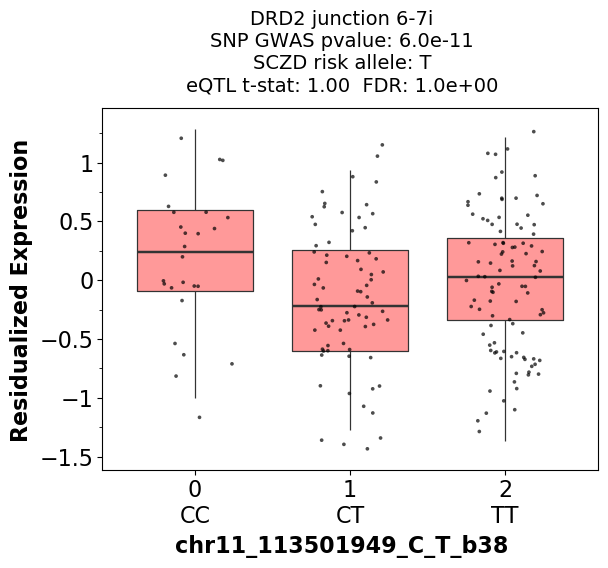

<ggplot: (8771445056681)>


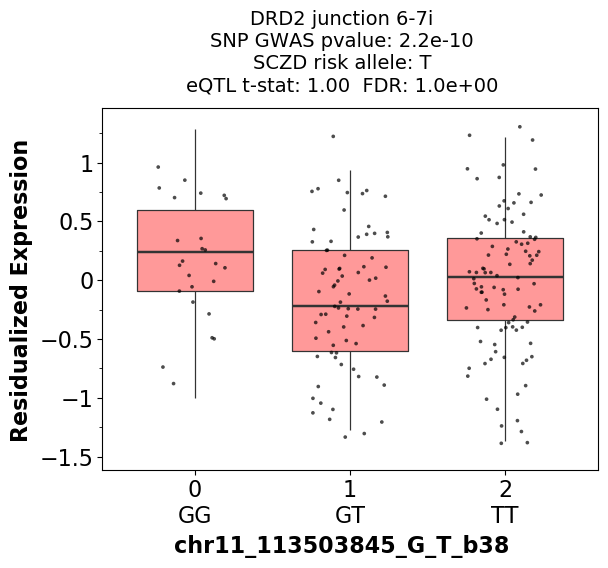

<ggplot: (8771445572205)>


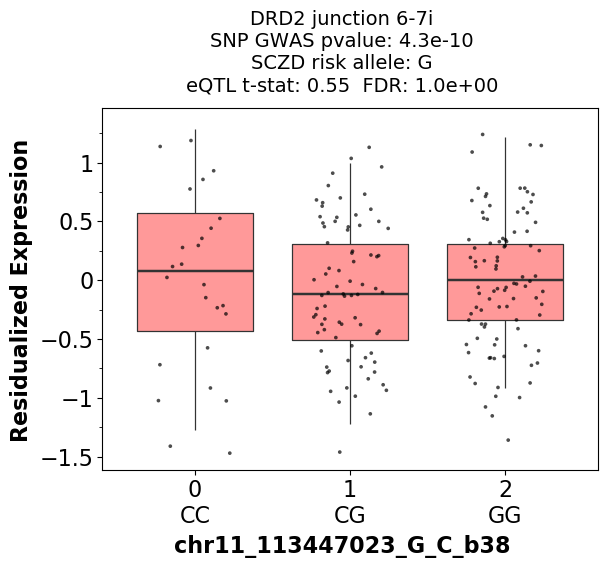

<ggplot: (8771444994964)>


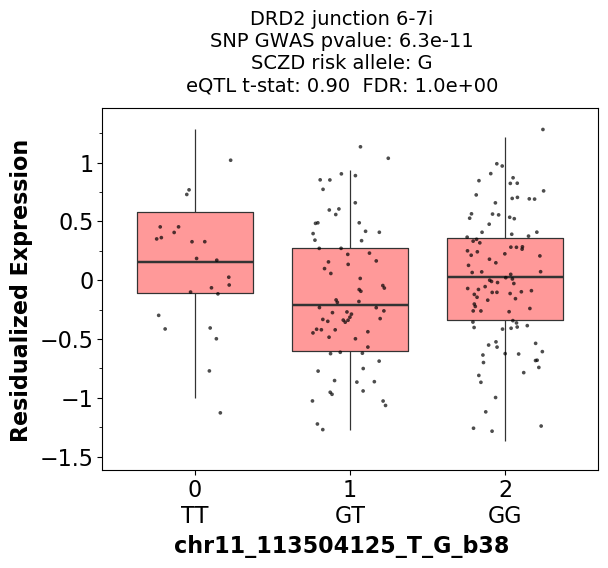

<ggplot: (8771444934470)>


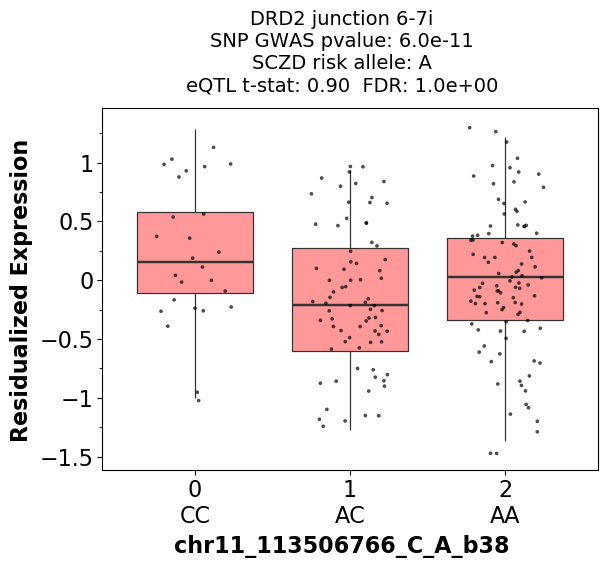

<ggplot: (8771445001277)>


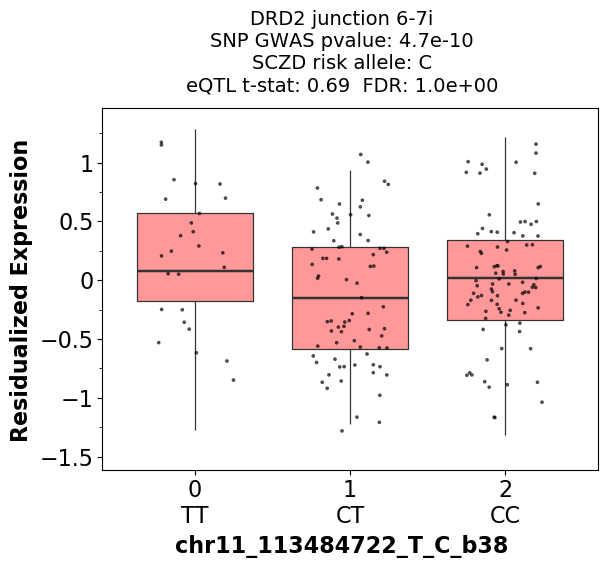

<ggplot: (8771444963030)>


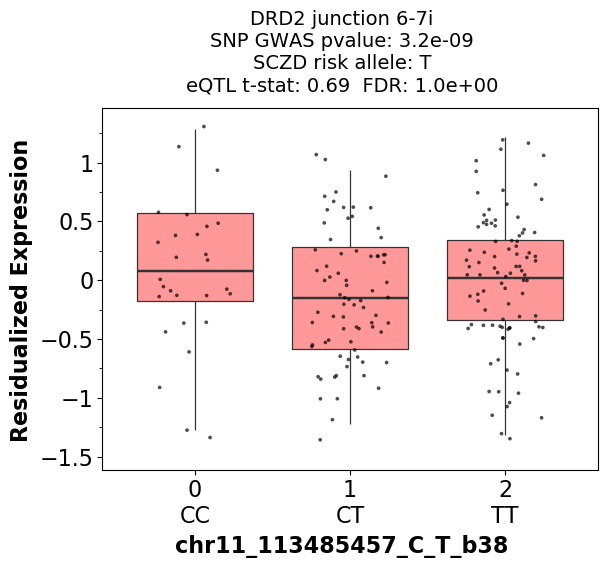

<ggplot: (8771444998042)>


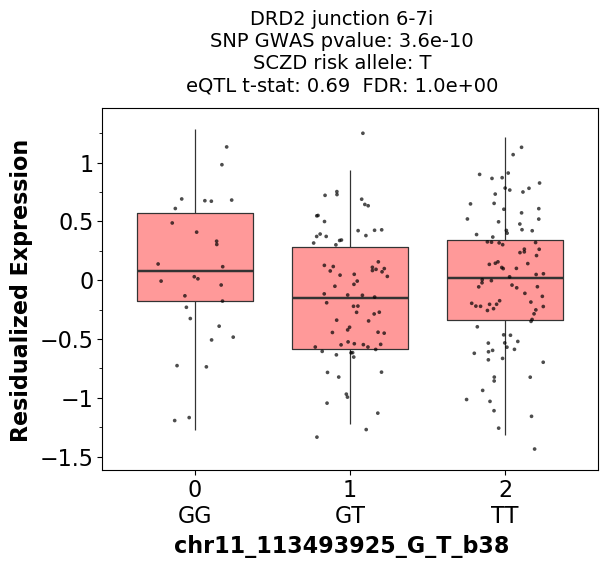

<ggplot: (8771444998123)>


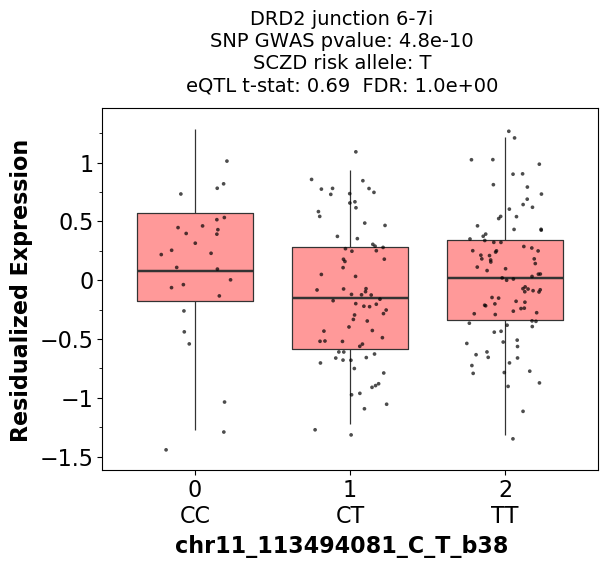

<ggplot: (8771524358018)>


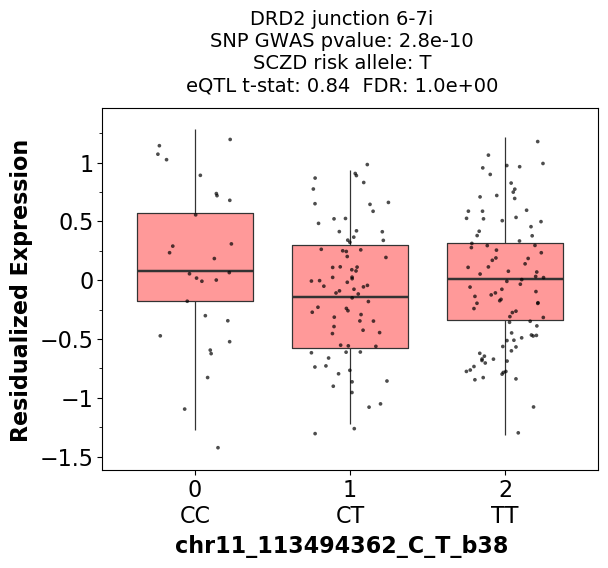

<ggplot: (8771524004497)>


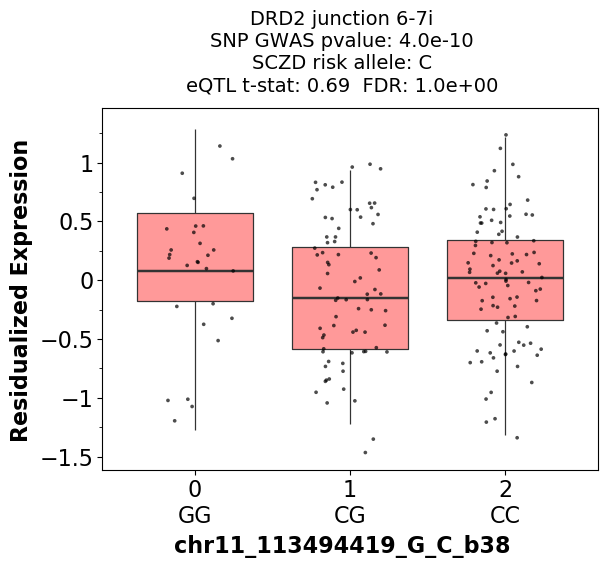

<ggplot: (8771523161597)>


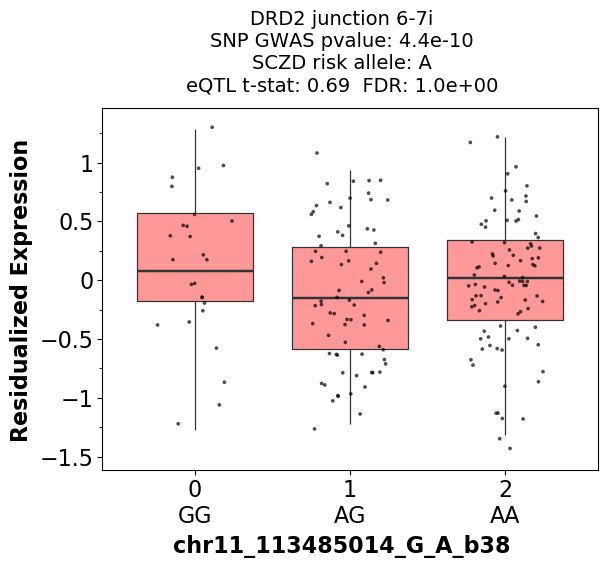

<ggplot: (8771523149487)>


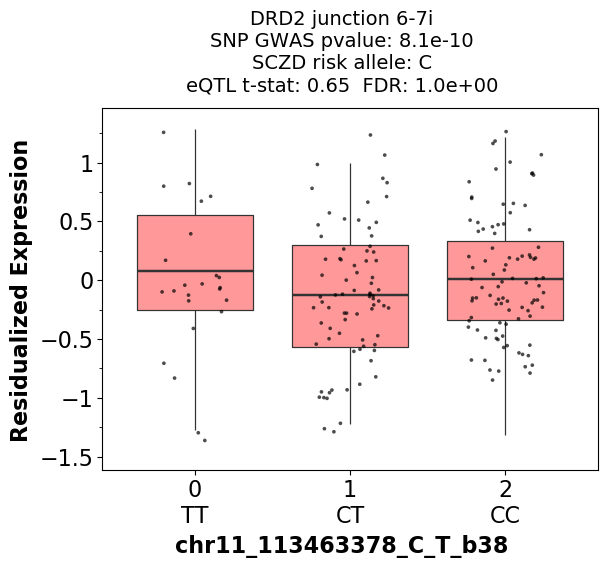

<ggplot: (8771445573449)>


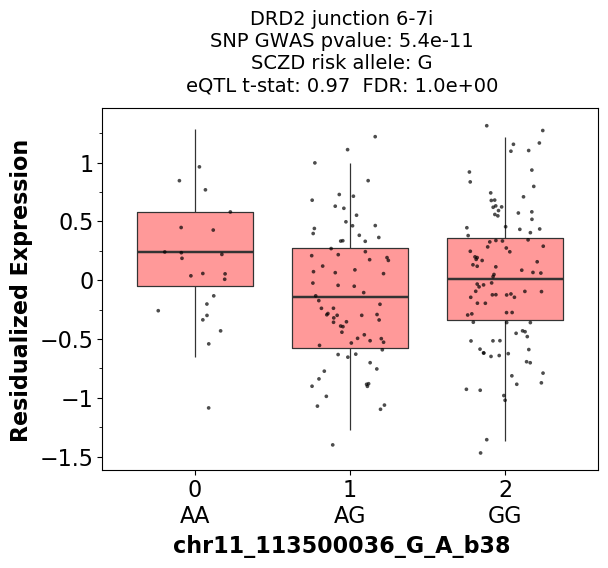

<ggplot: (8771445546963)>


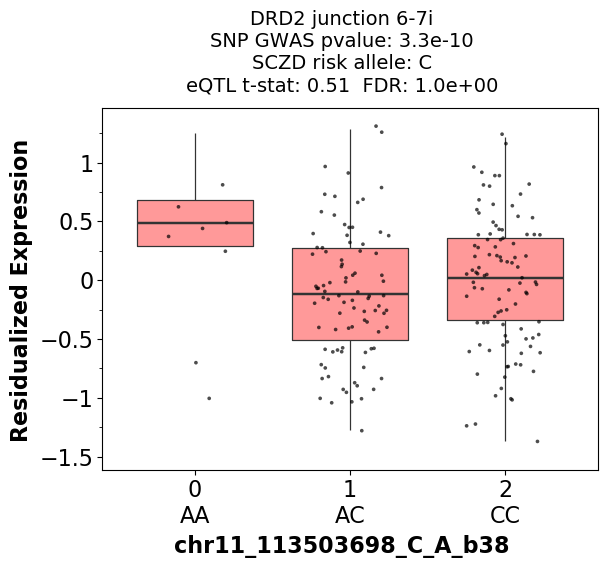

<ggplot: (8771524003732)>


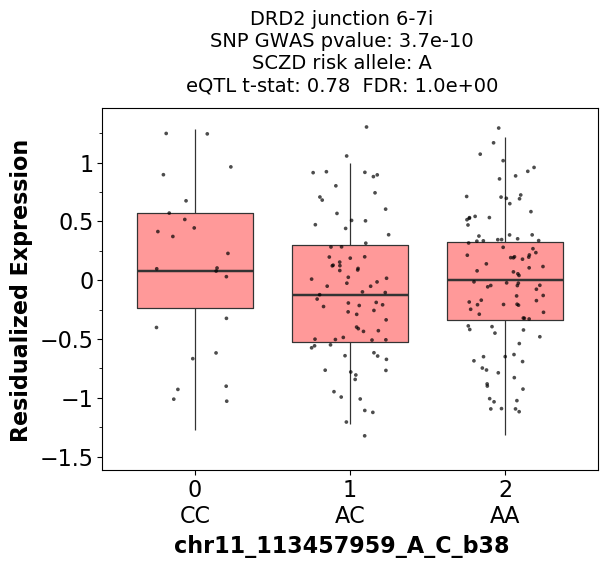

<ggplot: (8771523113415)>


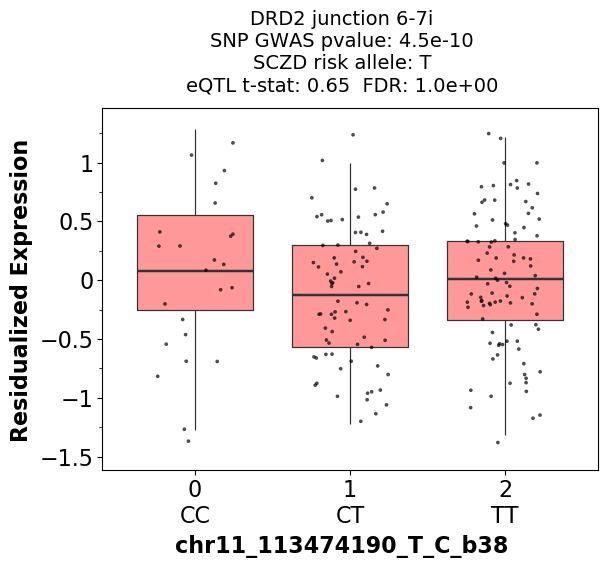

<ggplot: (8771444949971)>


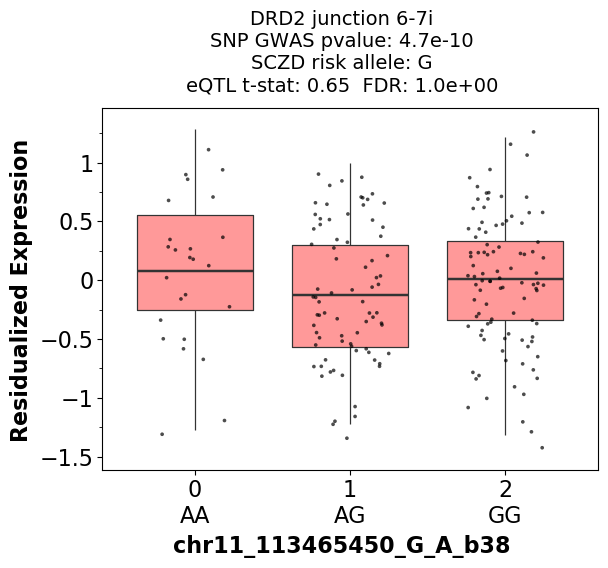

<ggplot: (8771444900093)>


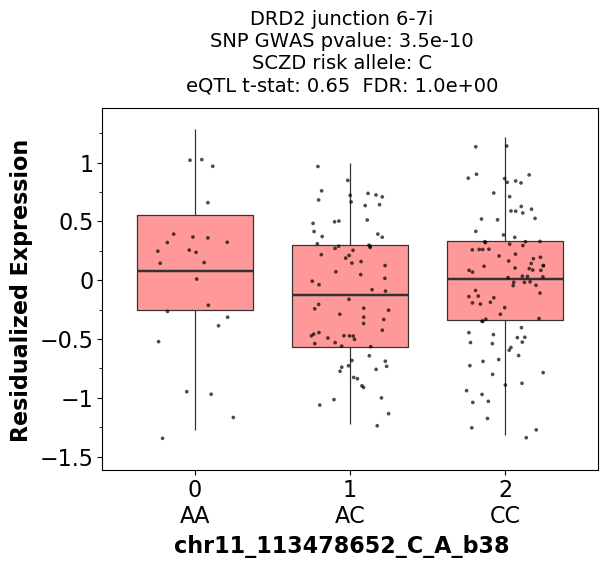

<ggplot: (8771444535546)>


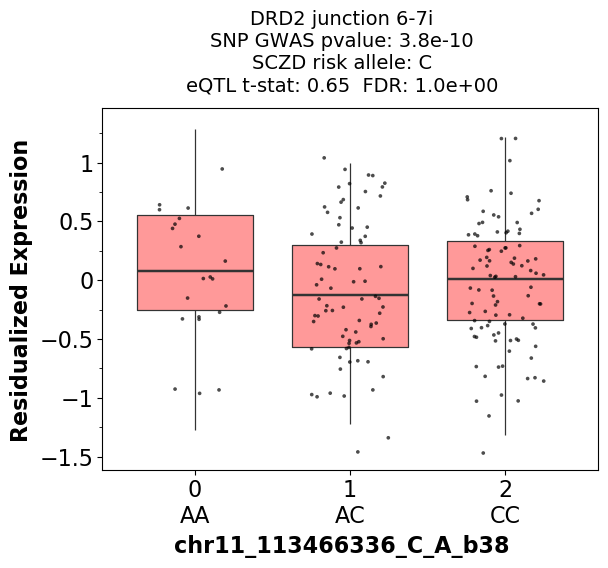

<ggplot: (8771444535357)>


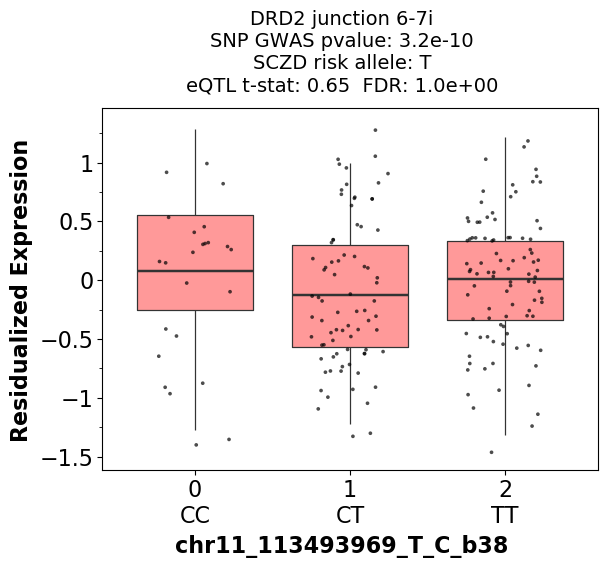

<ggplot: (8771444522692)>


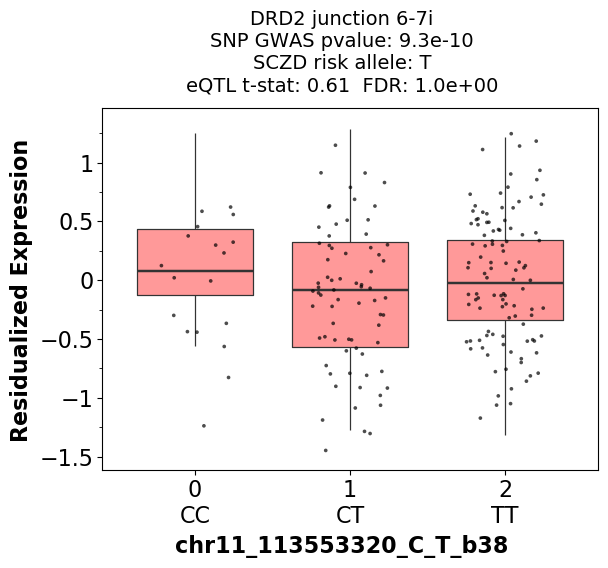

<ggplot: (8771444561764)>


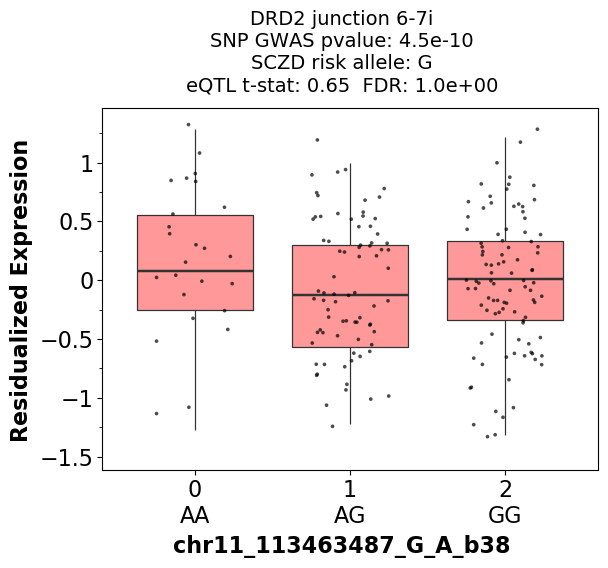

<ggplot: (8771444538763)>


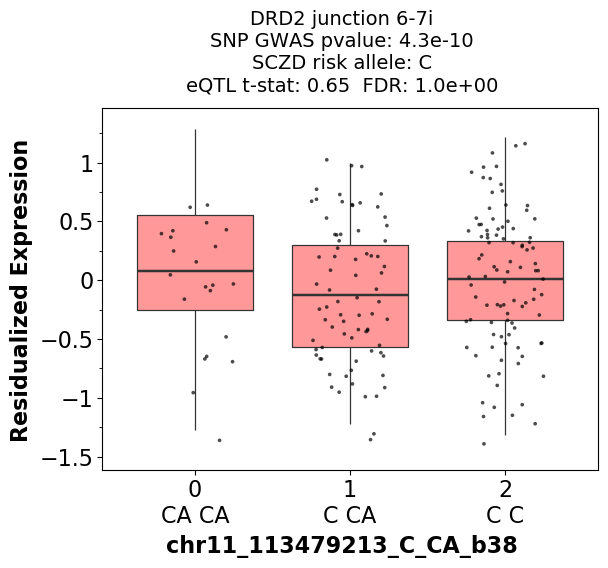

<ggplot: (8771523994390)>


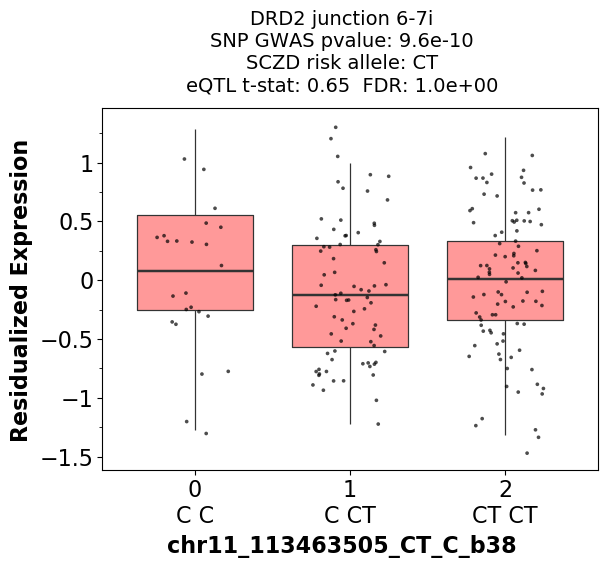

<ggplot: (8771444485572)>


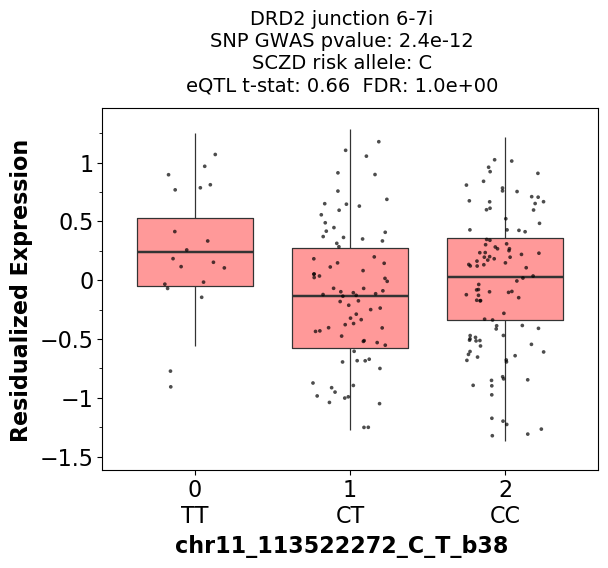

<ggplot: (8771444497243)>


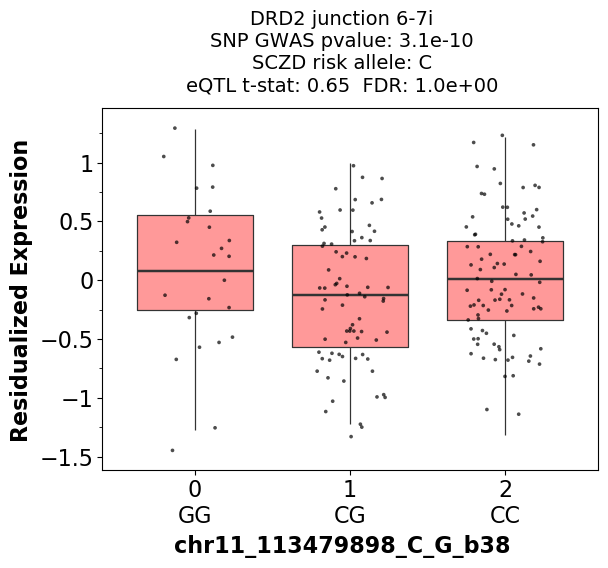

<ggplot: (8771524089893)>


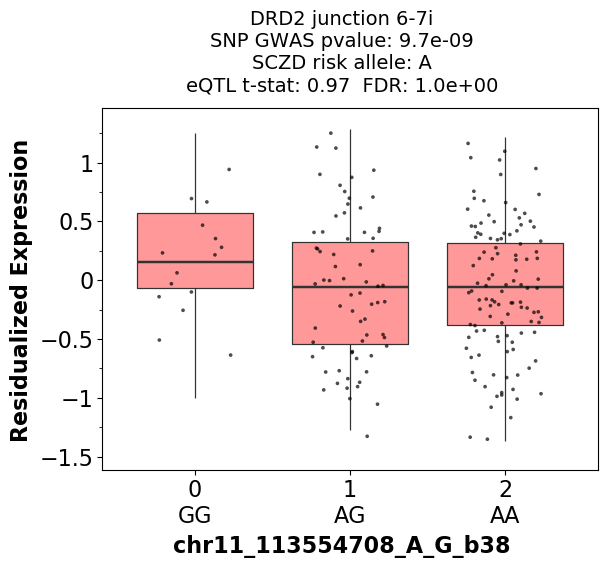

<ggplot: (8771523993173)>


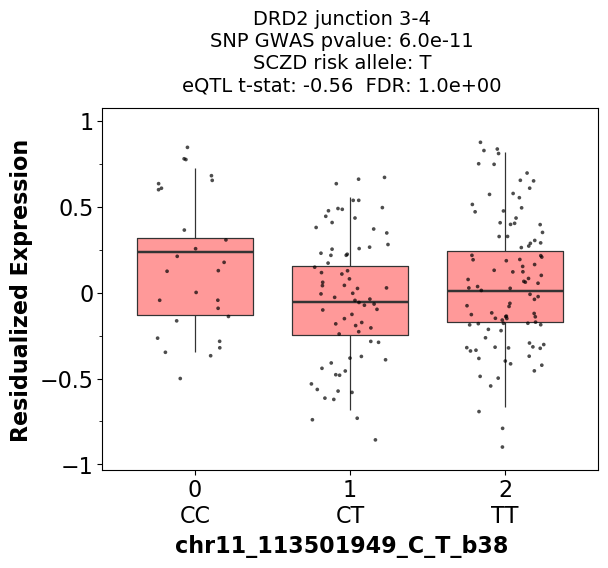

<ggplot: (8771523115222)>


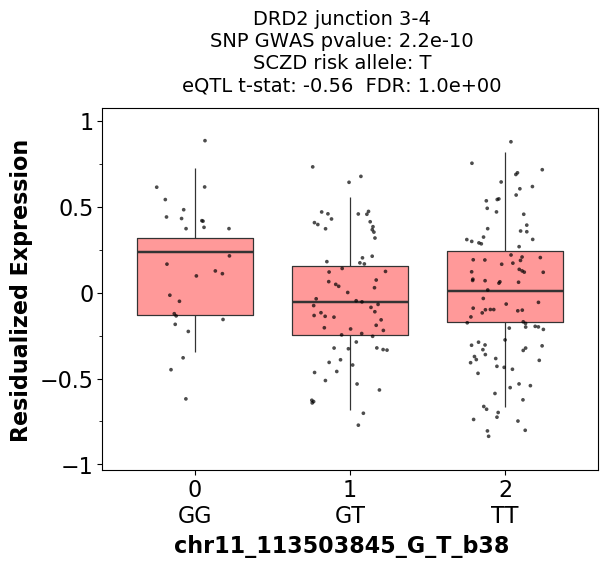

<ggplot: (8771524063516)>


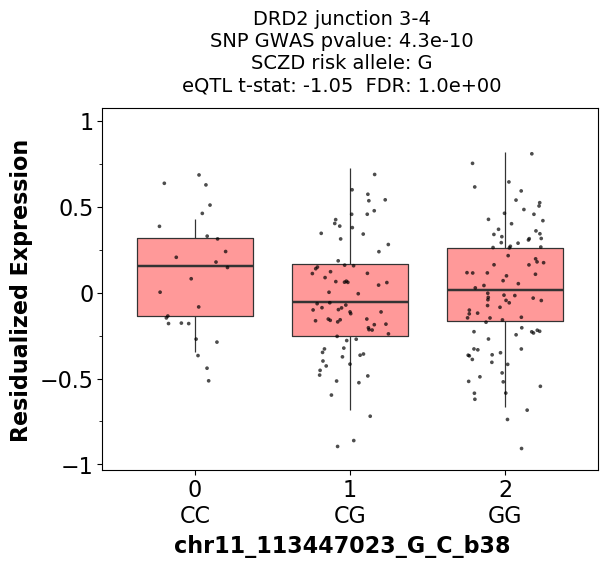

<ggplot: (8771524094980)>


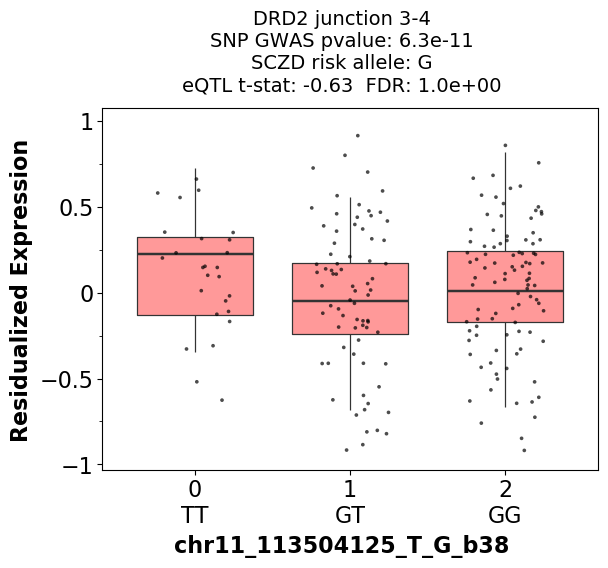

<ggplot: (8771523172684)>


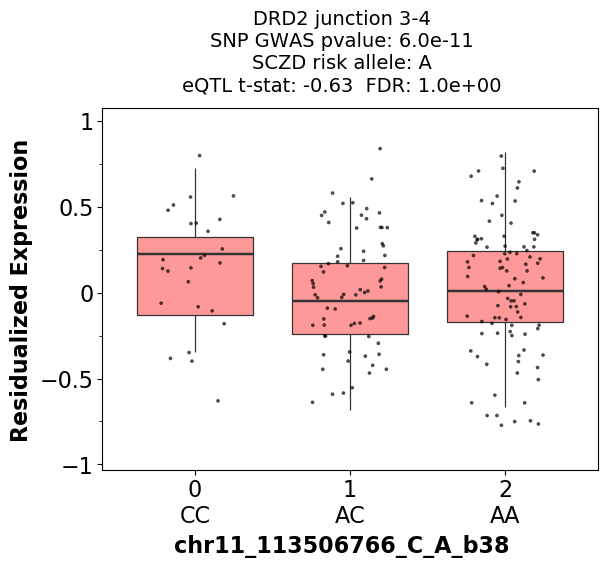

<ggplot: (8771445547623)>


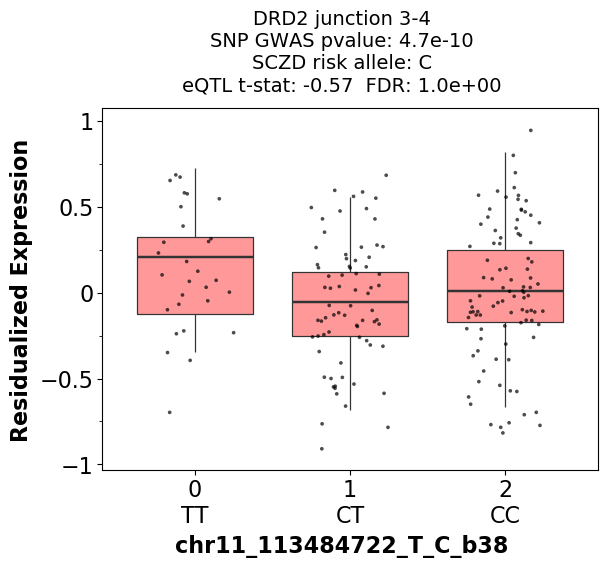

<ggplot: (8771523152086)>


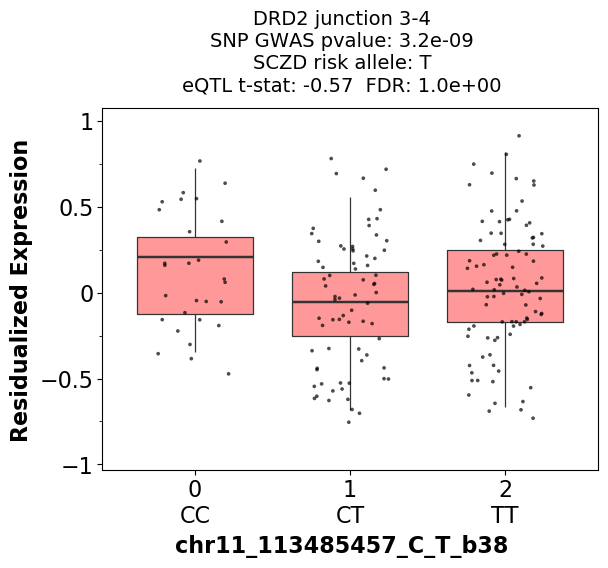

<ggplot: (8771524068744)>


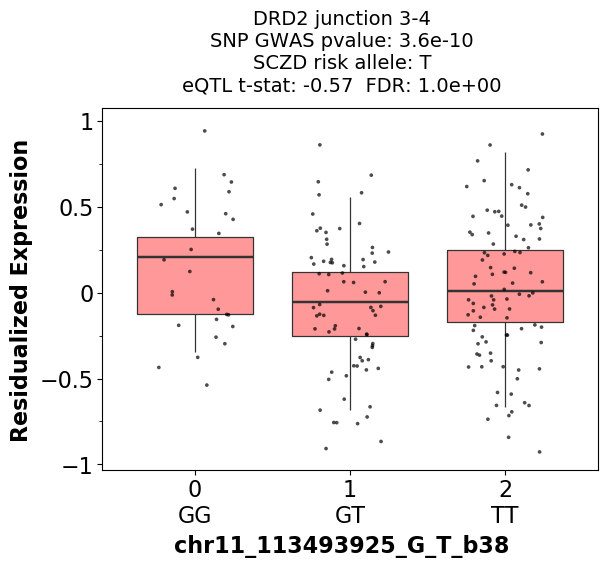

<ggplot: (8771445567299)>


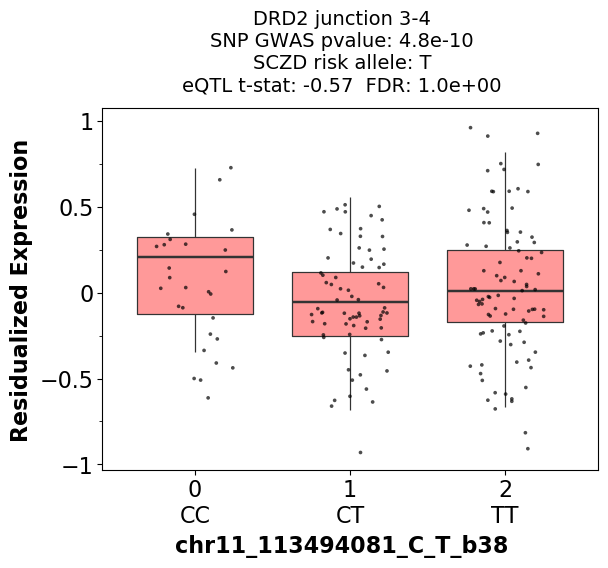

<ggplot: (8771445023660)>


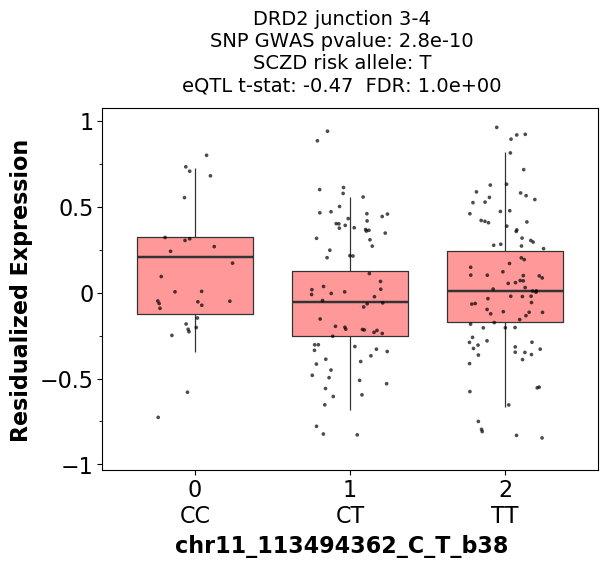

<ggplot: (8771445053127)>


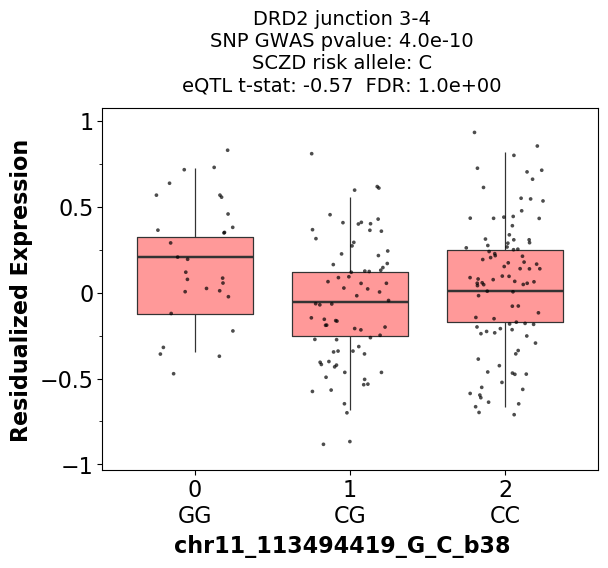

<ggplot: (8771445520282)>


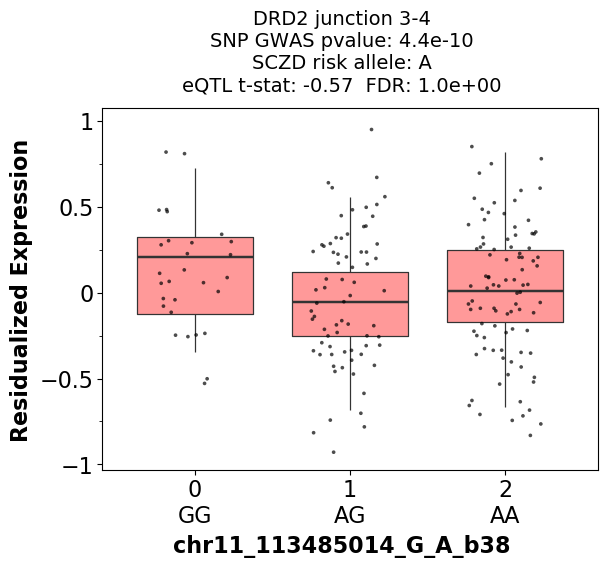

<ggplot: (8771445521966)>


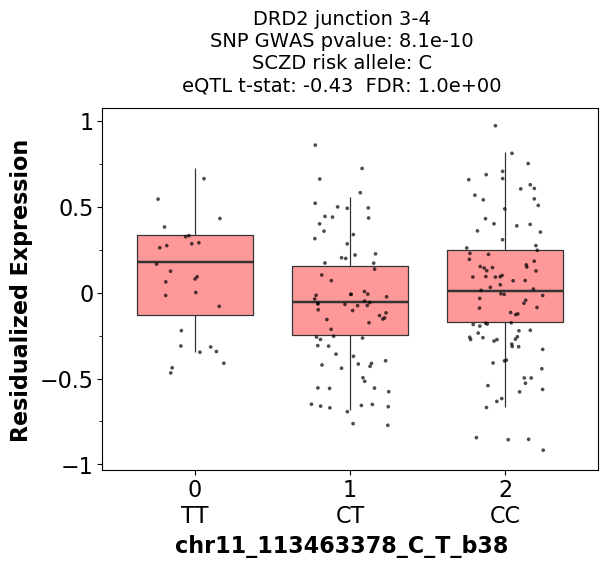

<ggplot: (8771523980388)>


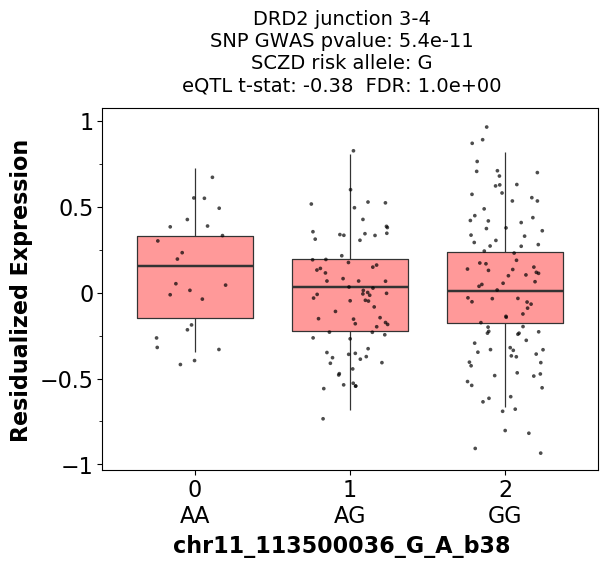

<ggplot: (8771445520186)>


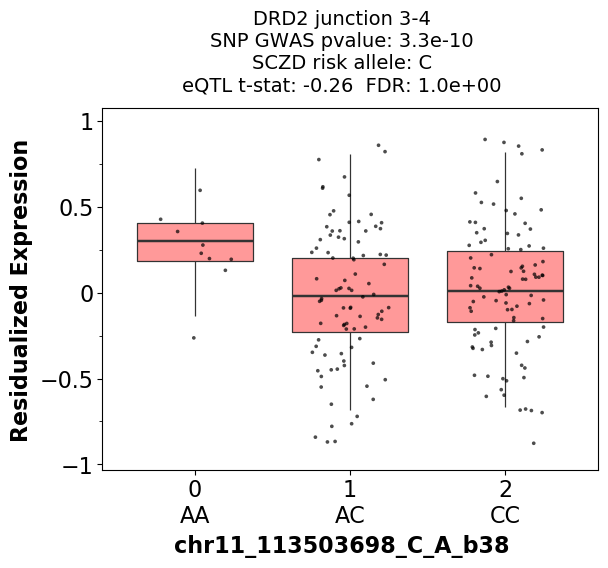

<ggplot: (8771524072744)>


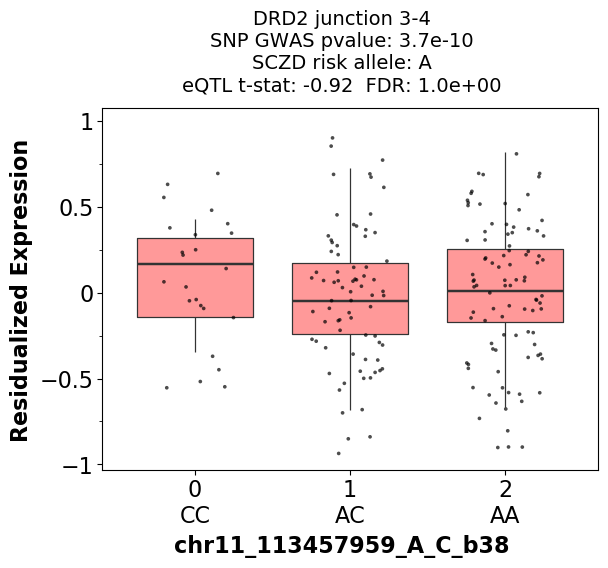

<ggplot: (8771524112255)>


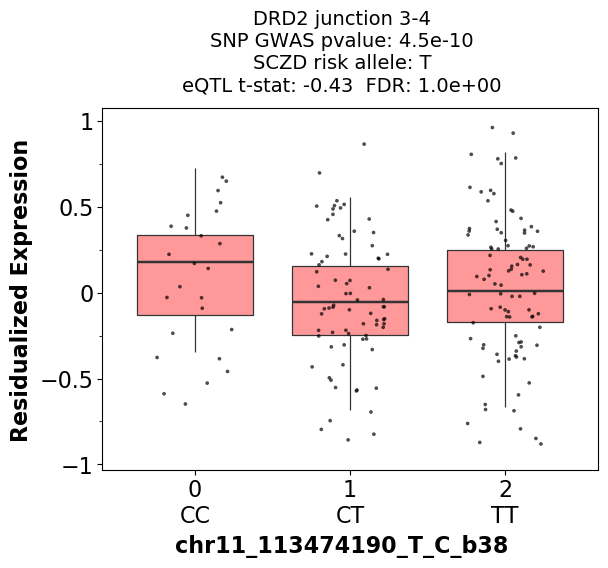

<ggplot: (8771444977571)>


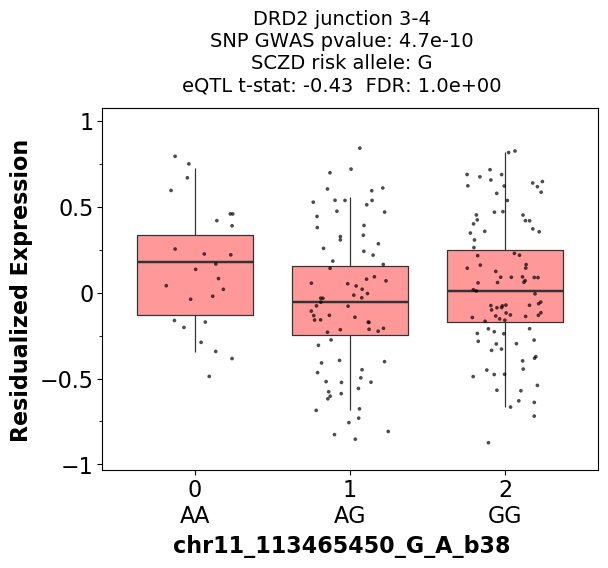

<ggplot: (8771523138557)>


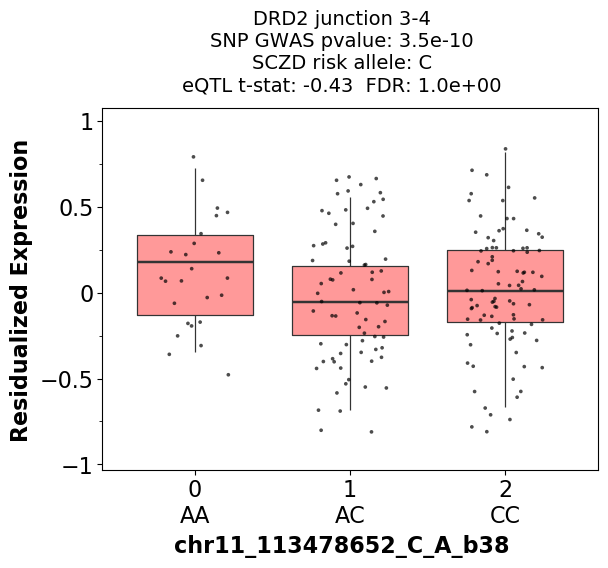

<ggplot: (8771444551352)>


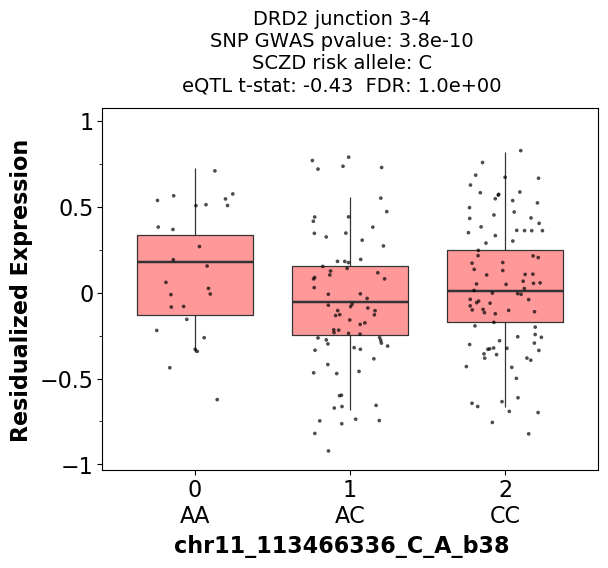

<ggplot: (8771444488117)>


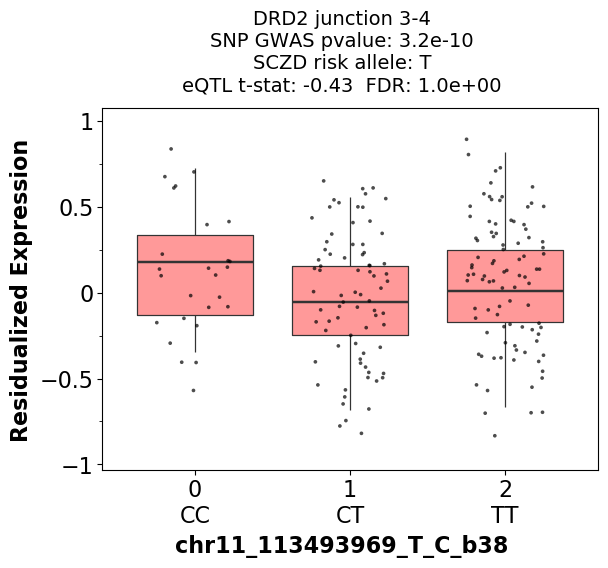

<ggplot: (8771445086266)>


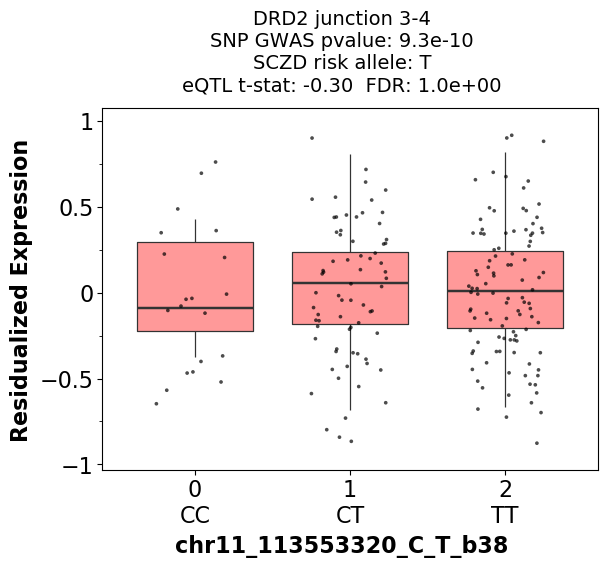

<ggplot: (8771445001325)>


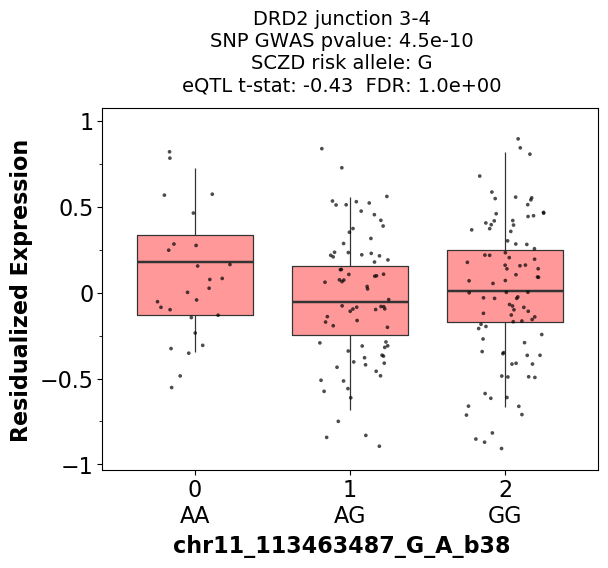

<ggplot: (8771445086266)>


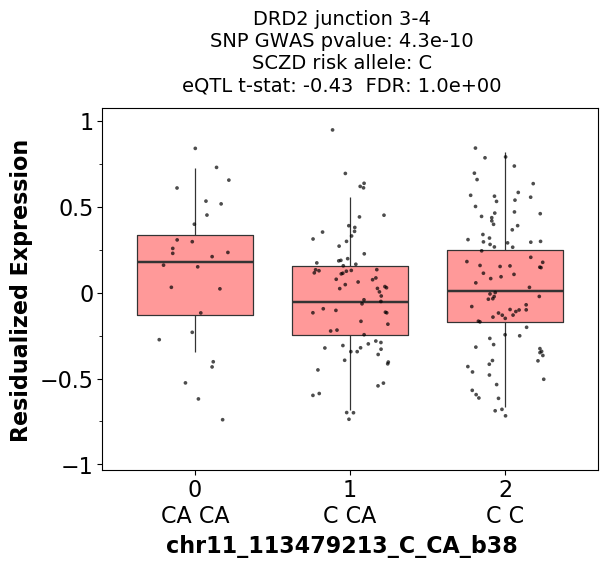

<ggplot: (8771444498363)>


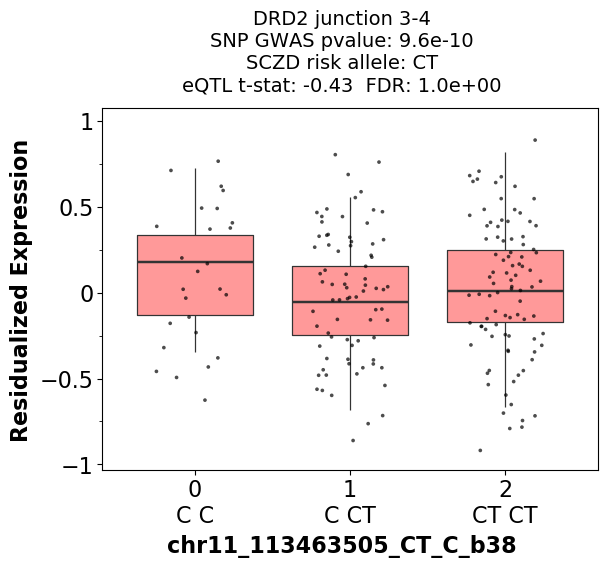

<ggplot: (8771445517436)>


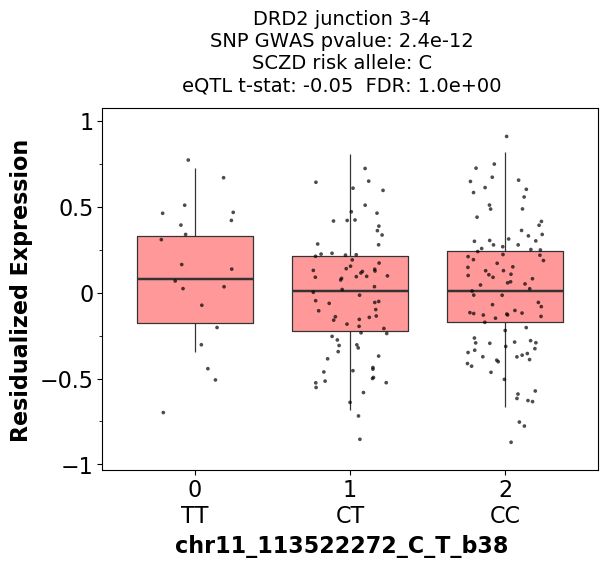

<ggplot: (8771523993875)>


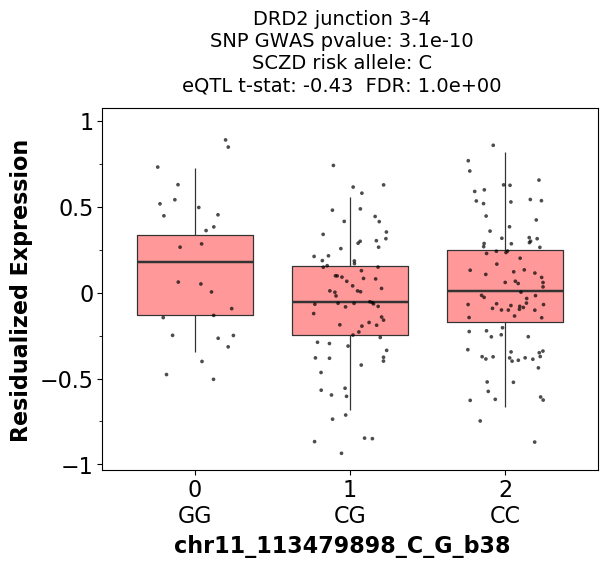

<ggplot: (8771414708529)>


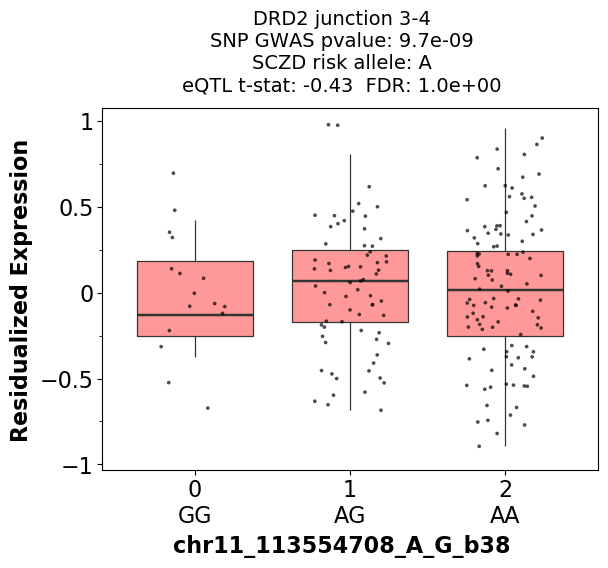

<ggplot: (8771524058347)>


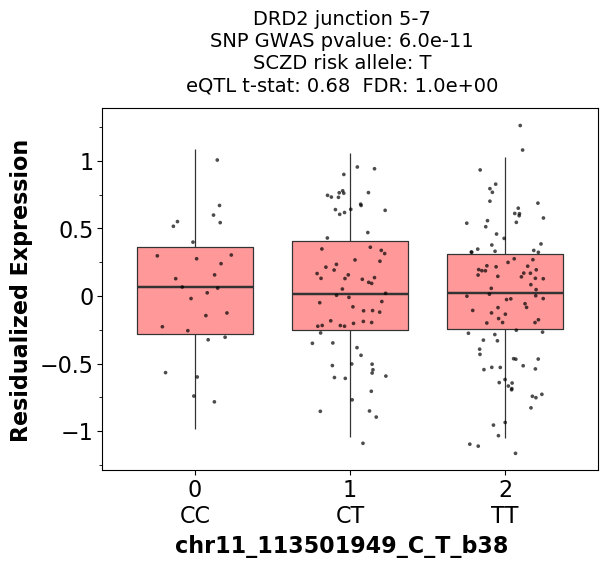

<ggplot: (8771444984555)>


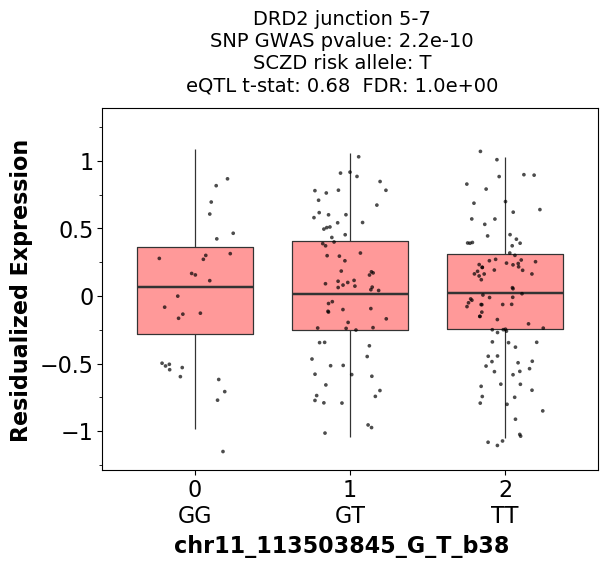

<ggplot: (8771524041247)>


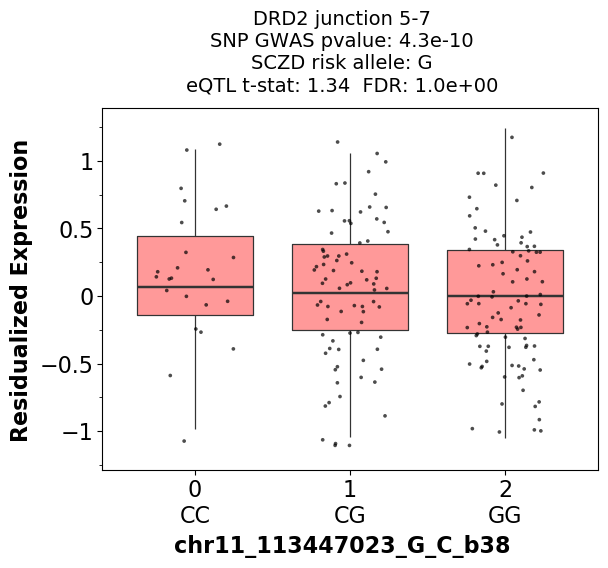

<ggplot: (8771524148559)>


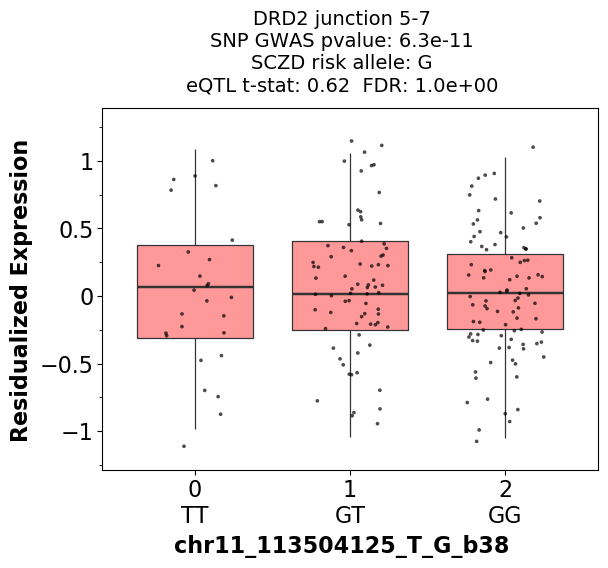

<ggplot: (8771523148406)>


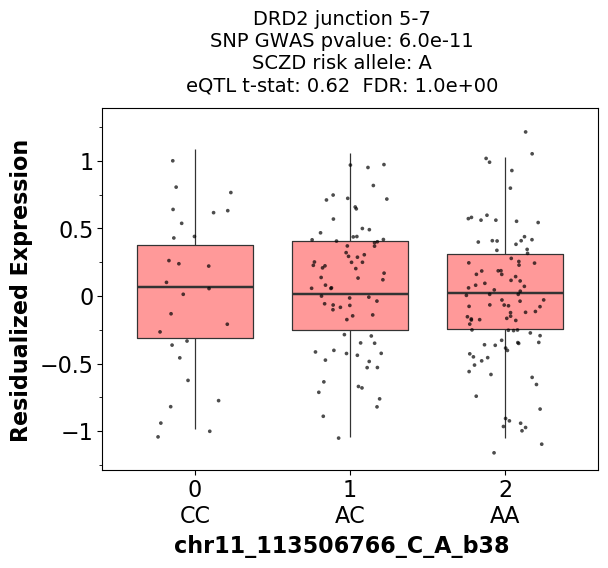

<ggplot: (8771445563703)>


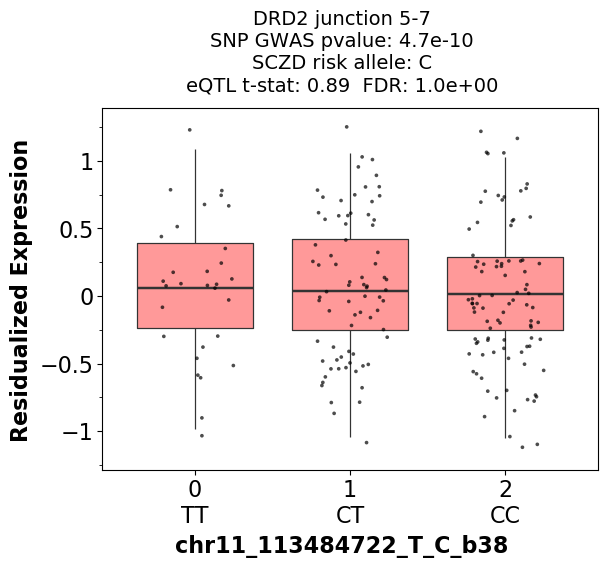

<ggplot: (8771524075511)>


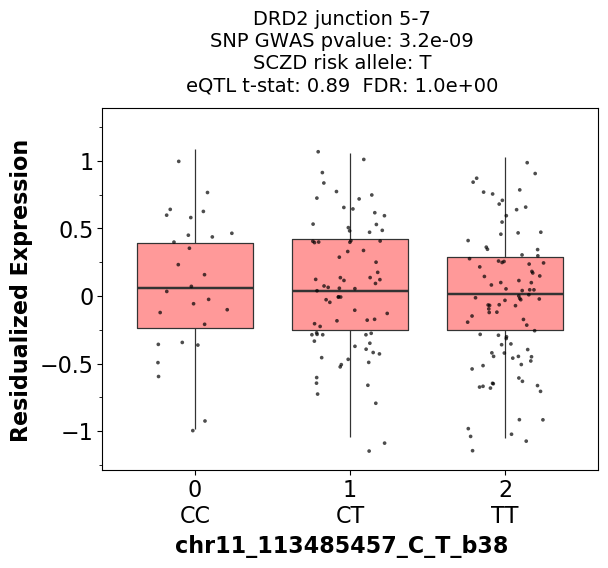

<ggplot: (8771524075421)>


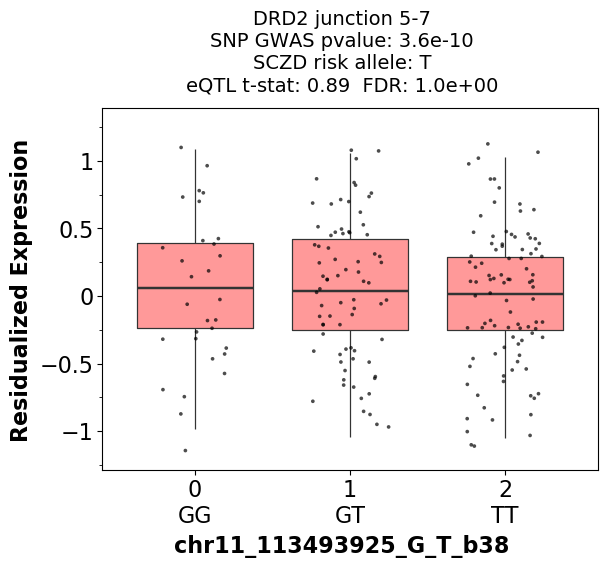

<ggplot: (8771445023618)>


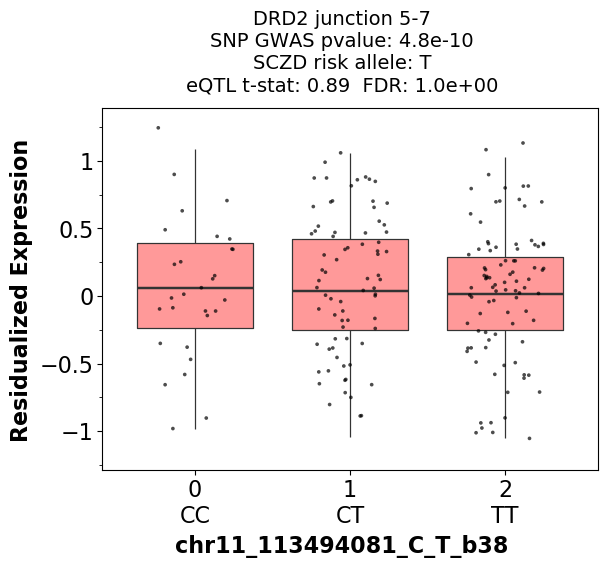

<ggplot: (8771445023546)>


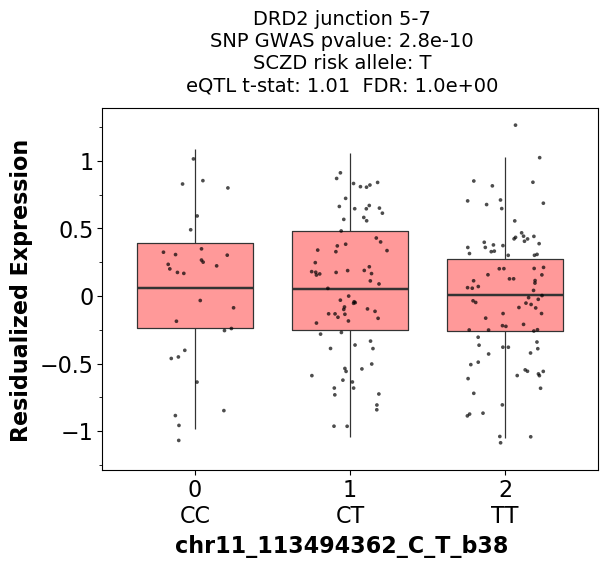

<ggplot: (8771523118382)>


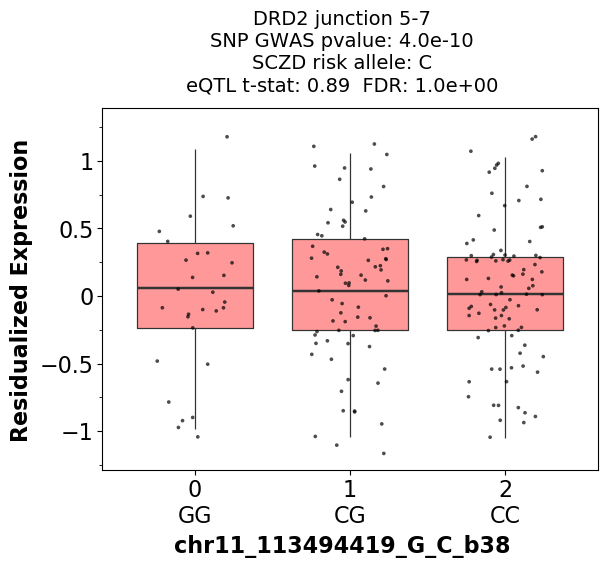

<ggplot: (8771445546861)>


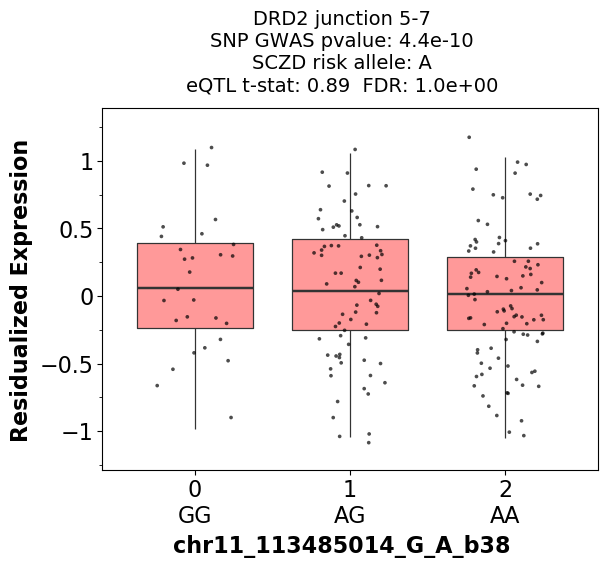

<ggplot: (8771523108398)>


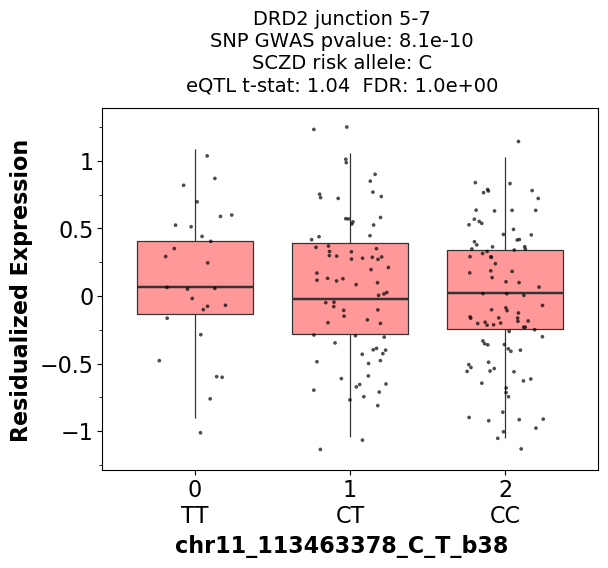

<ggplot: (8771523118502)>


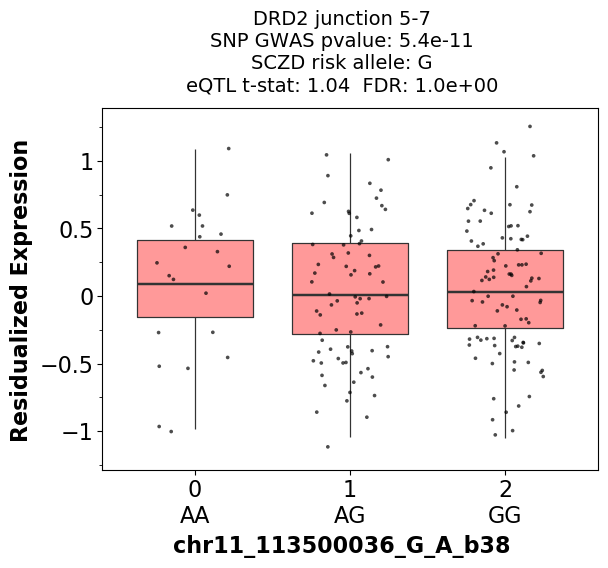

<ggplot: (8771523118523)>


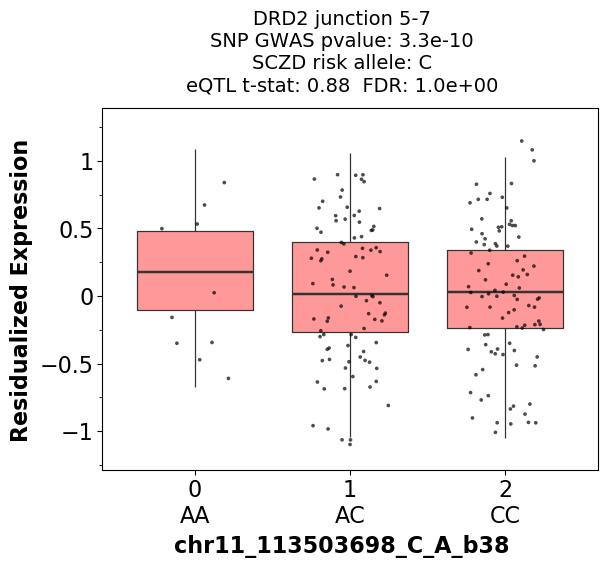

<ggplot: (8771445039282)>


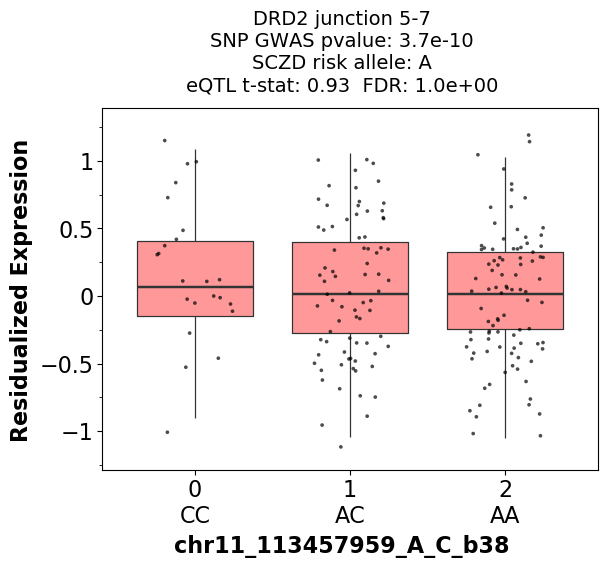

<ggplot: (8771445539205)>


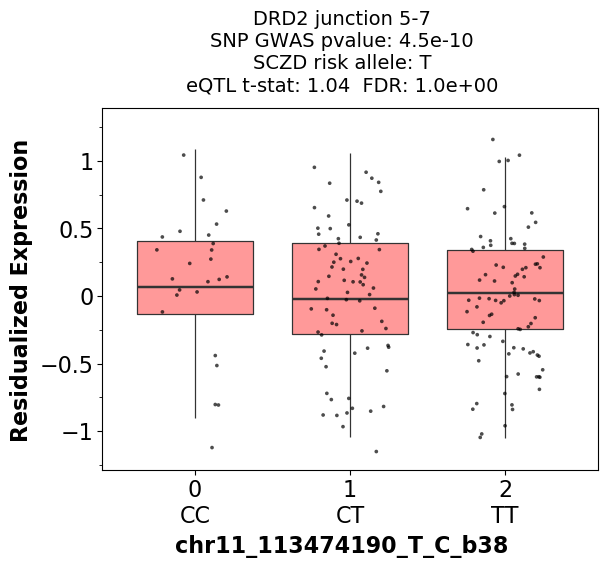

<ggplot: (8771523169148)>


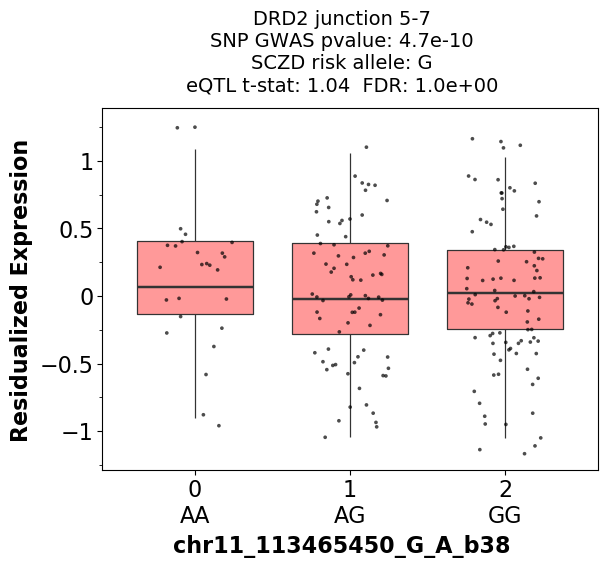

<ggplot: (8771524005843)>


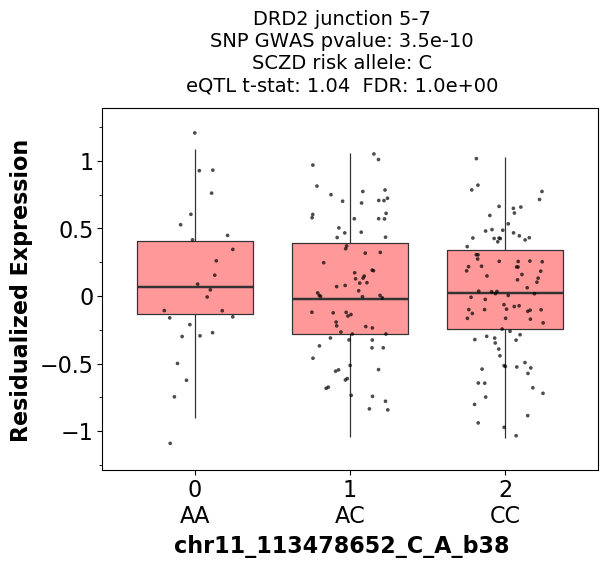

<ggplot: (8771524143388)>


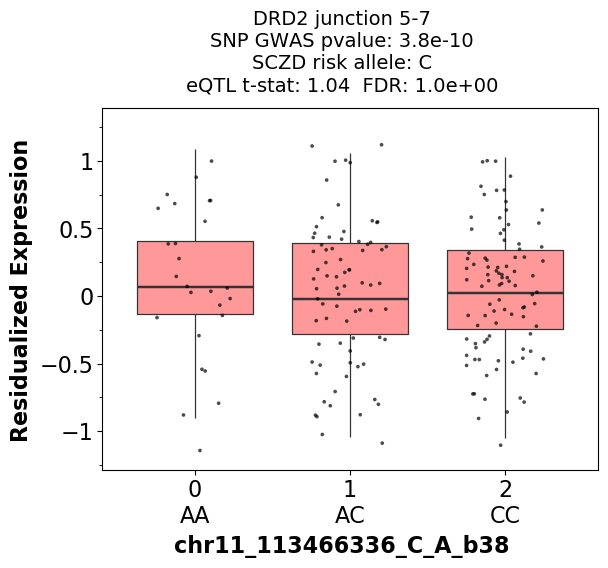

<ggplot: (8771523111988)>


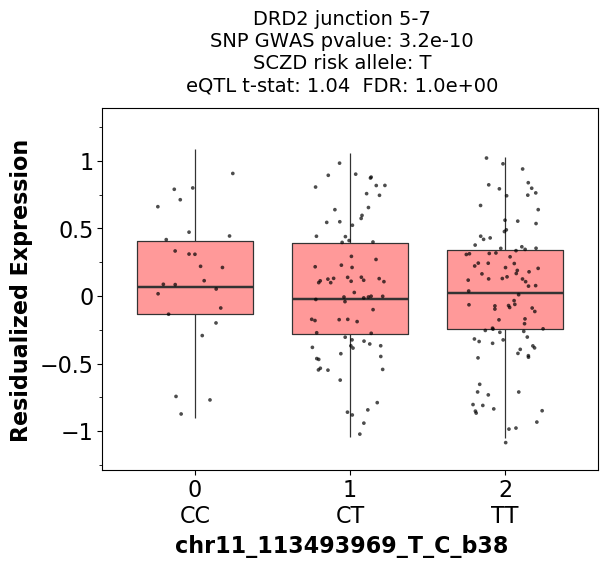

<ggplot: (8771523994513)>


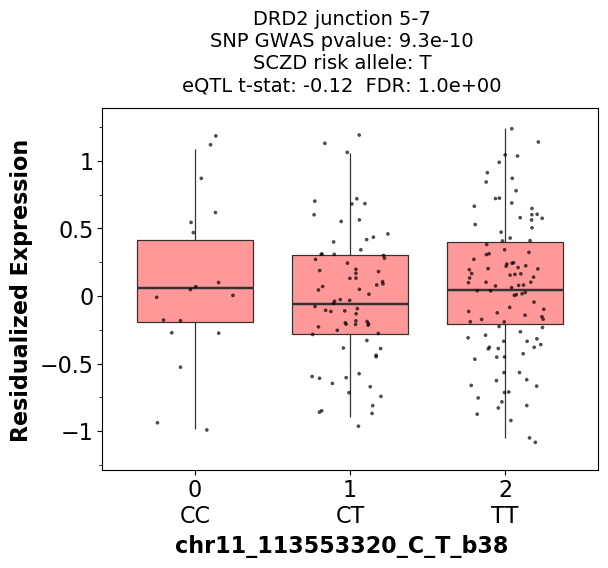

<ggplot: (8771523155396)>


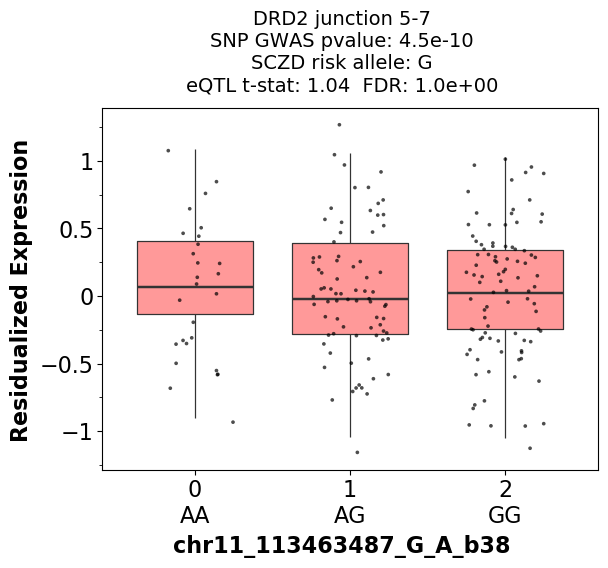

<ggplot: (8771445572274)>


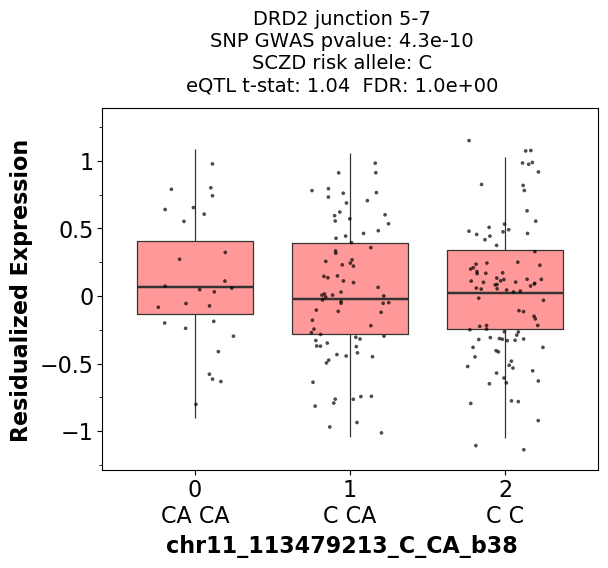

<ggplot: (8771444958925)>


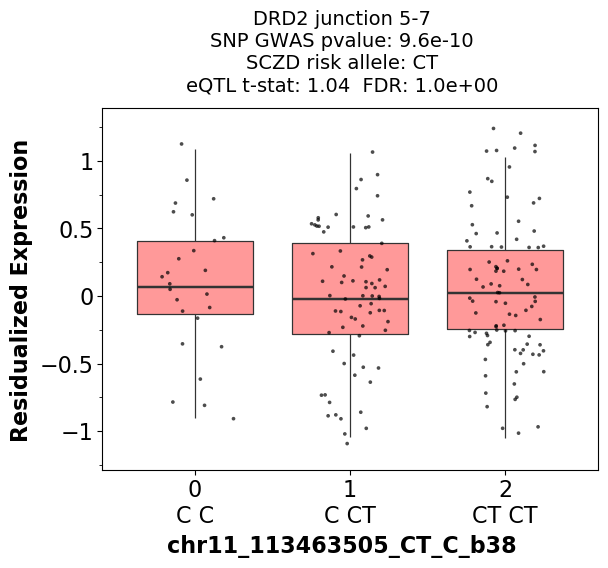

<ggplot: (8771445014004)>


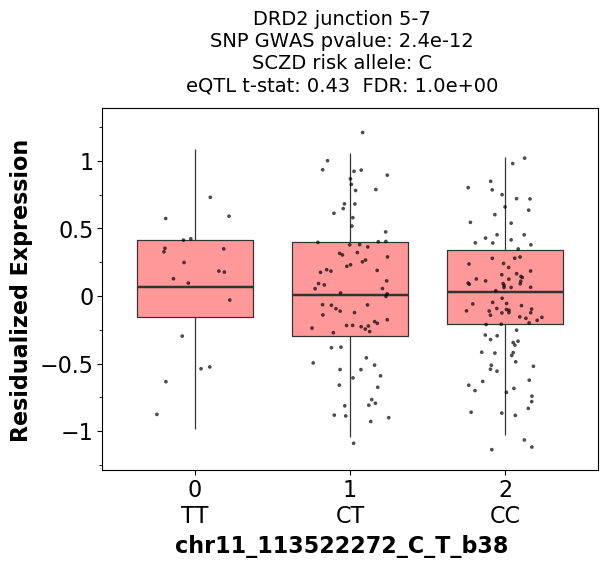

<ggplot: (8771524068816)>


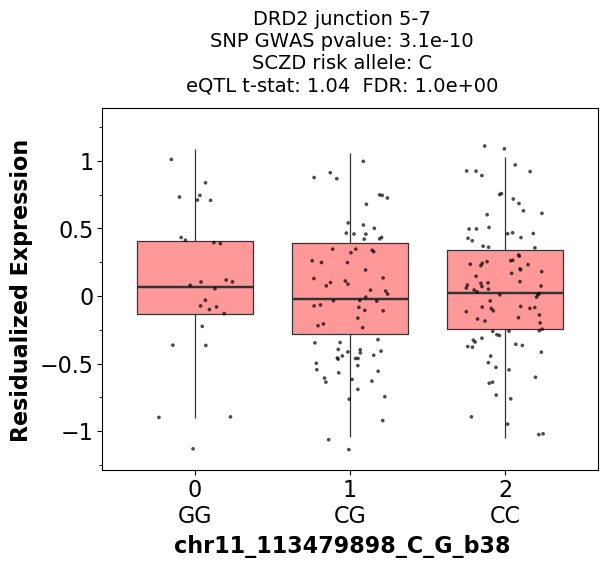

<ggplot: (8771523132145)>


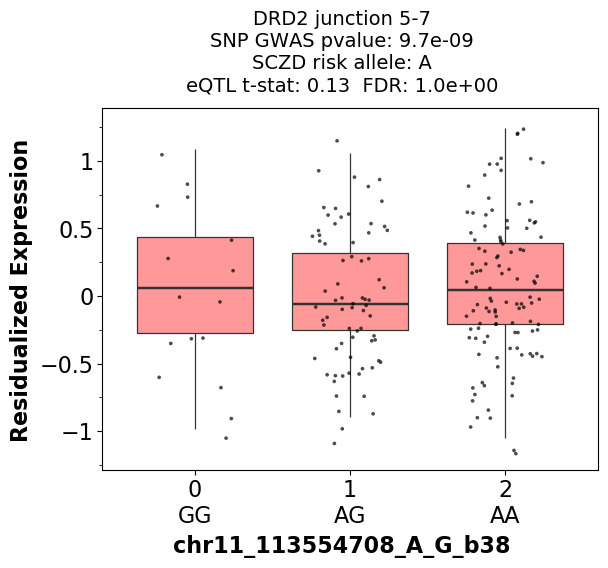

<ggplot: (8771445031985)>


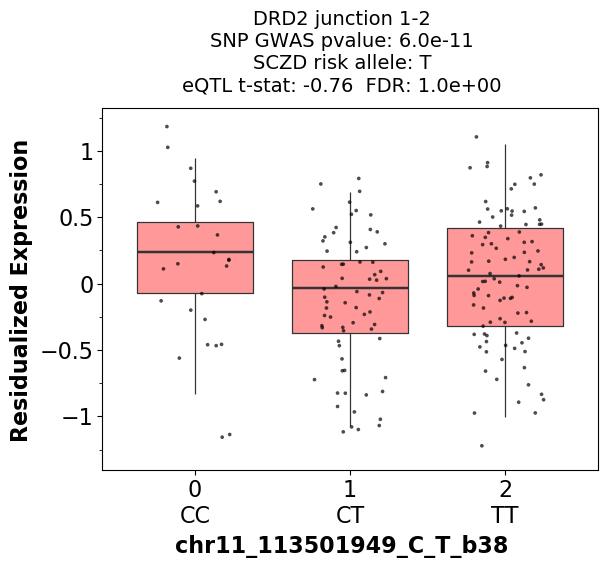

<ggplot: (8771524001464)>


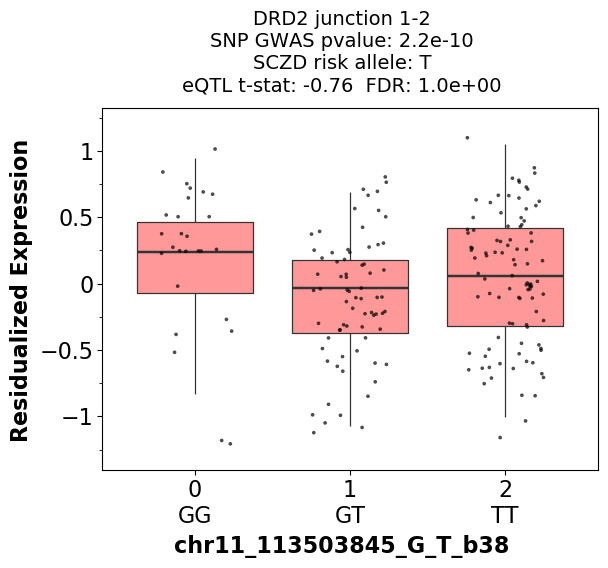

<ggplot: (8771445003493)>


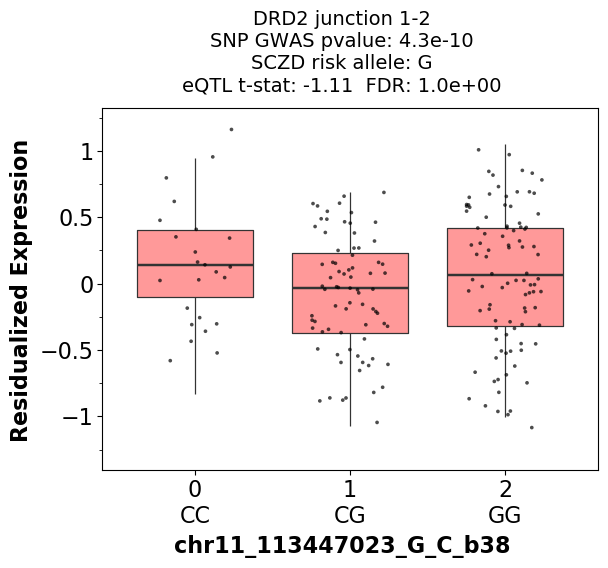

<ggplot: (8771444909117)>


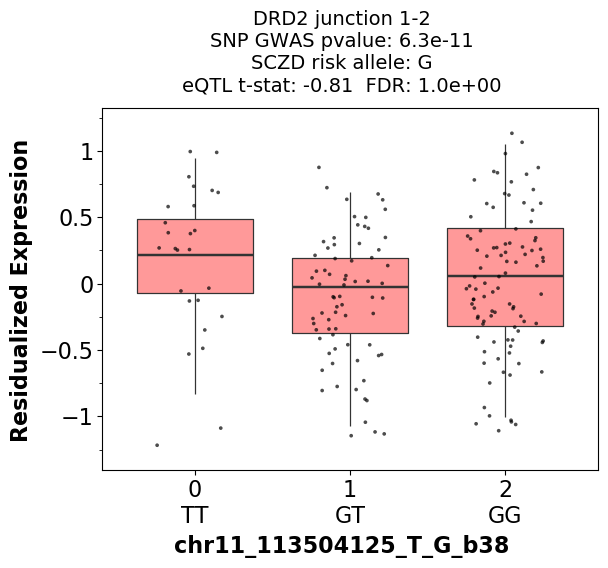

<ggplot: (8771524024278)>


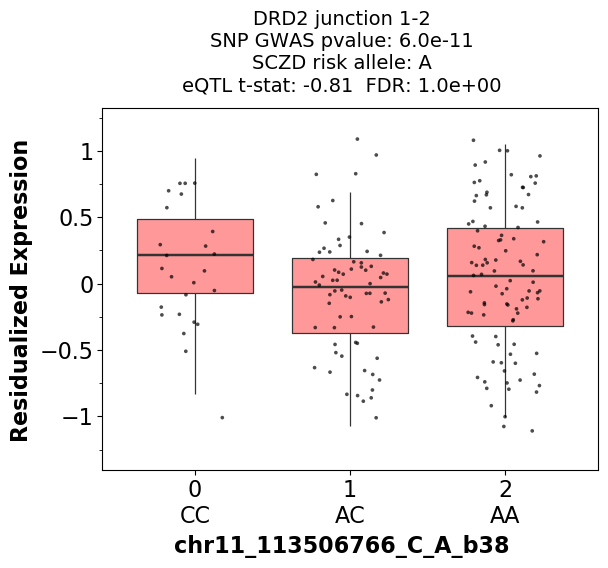

<ggplot: (8771524097425)>


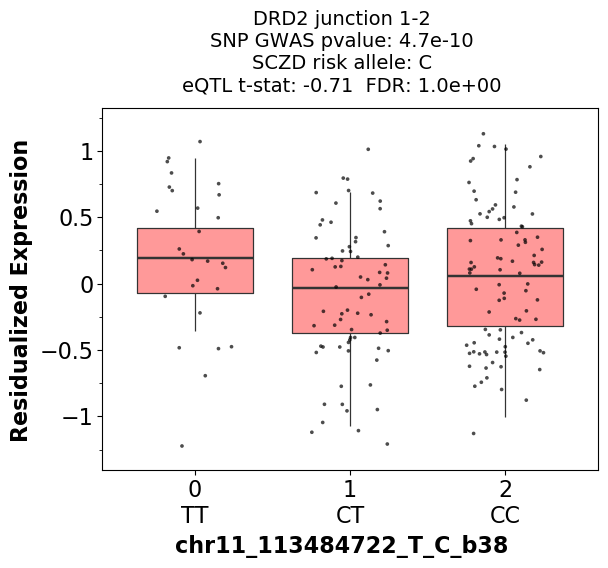

<ggplot: (8771523997790)>


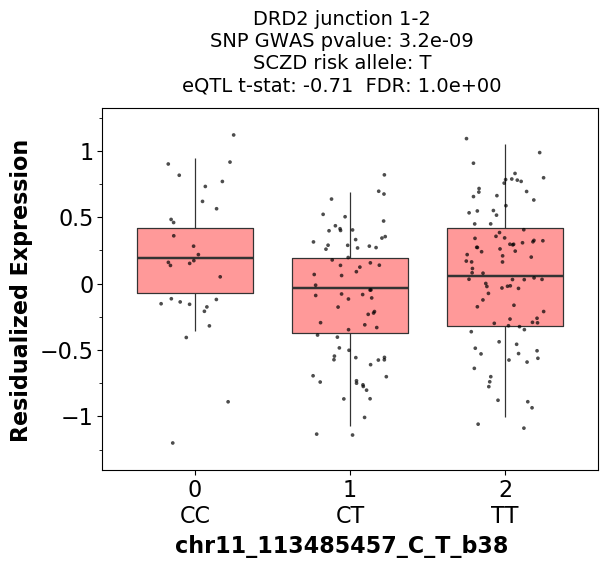

<ggplot: (8771445541973)>


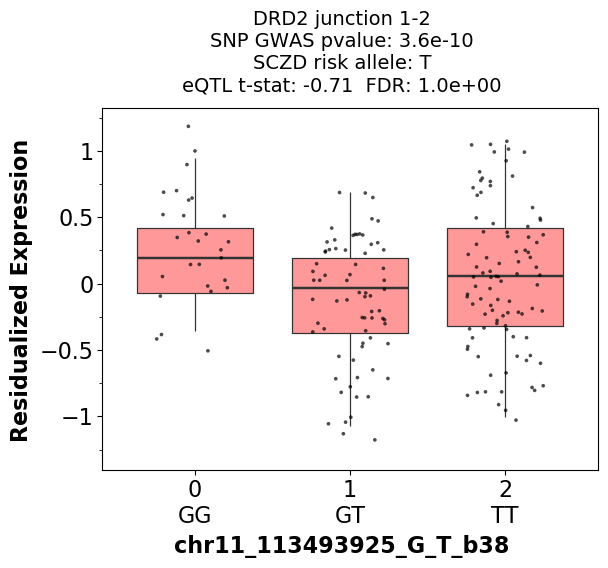

<ggplot: (8771523997790)>


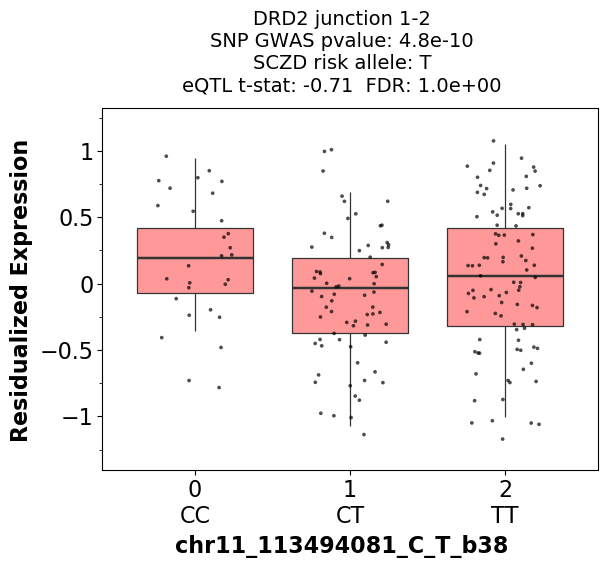

<ggplot: (8771444497396)>


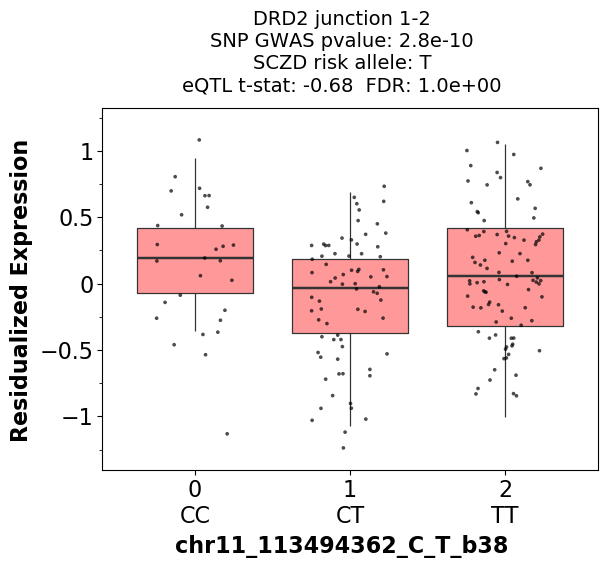

<ggplot: (8771523155324)>


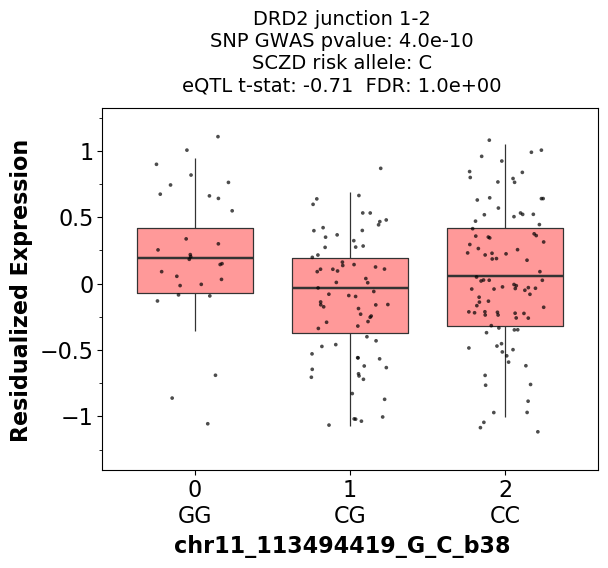

<ggplot: (8771445069584)>


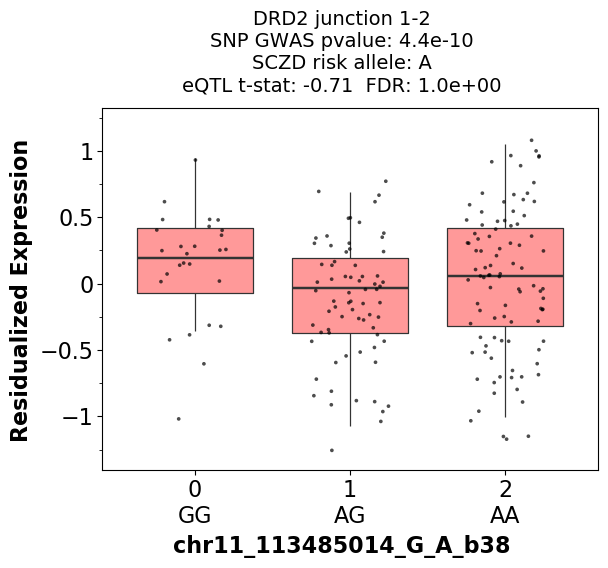

<ggplot: (8771445516894)>


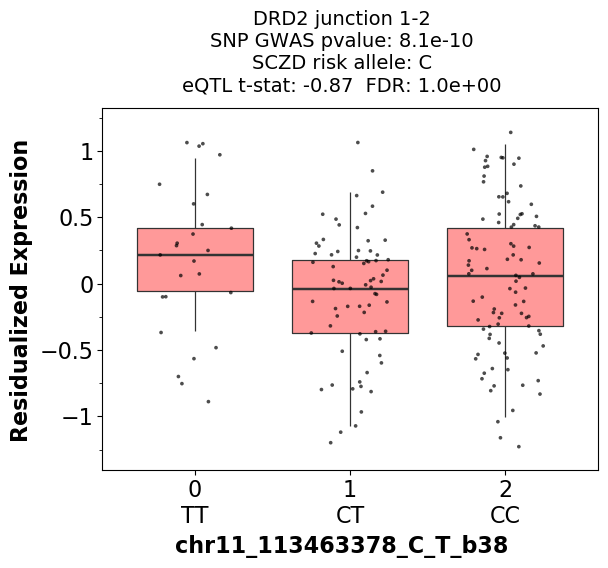

<ggplot: (8771524143457)>


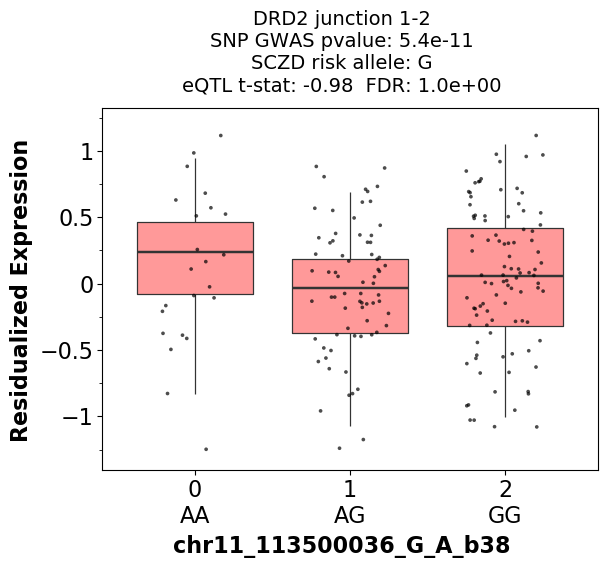

<ggplot: (8771445031253)>


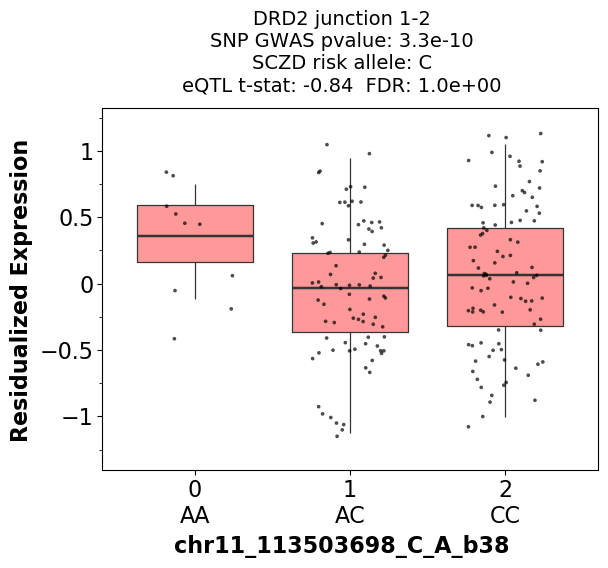

<ggplot: (8771445499901)>


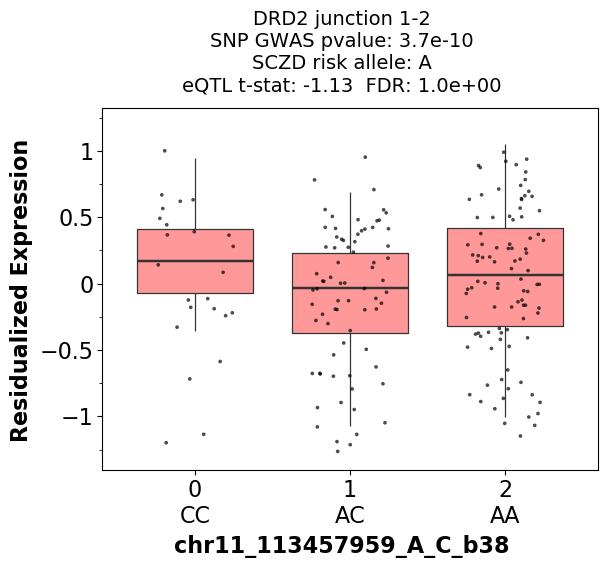

<ggplot: (8771444498303)>


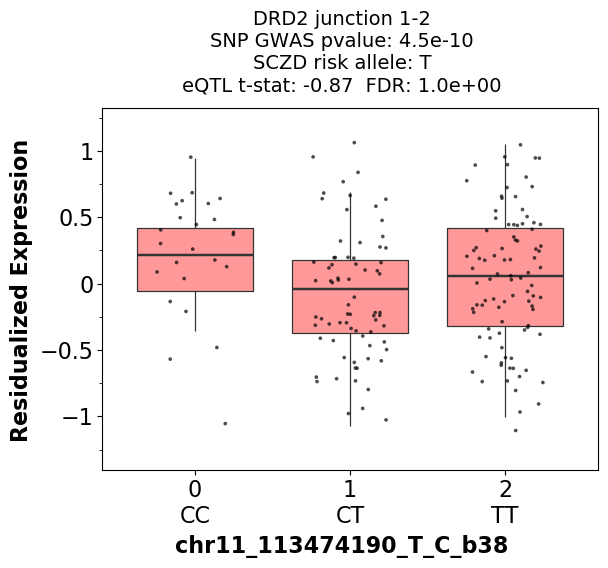

<ggplot: (8771444497192)>


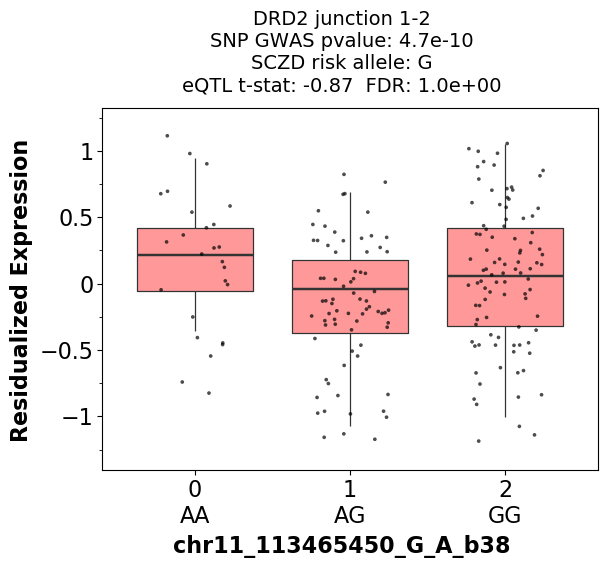

<ggplot: (8771523151273)>


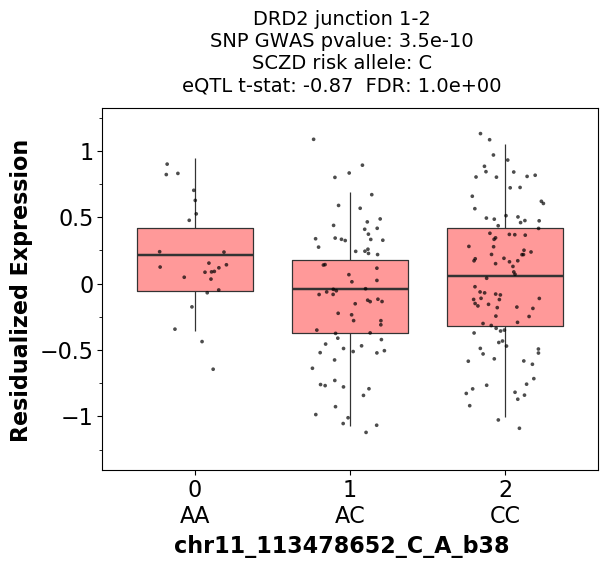

<ggplot: (8771524044255)>


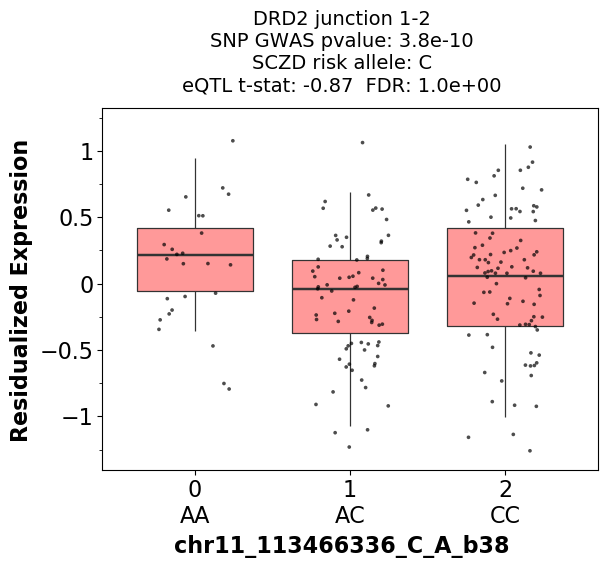

<ggplot: (8771524102873)>


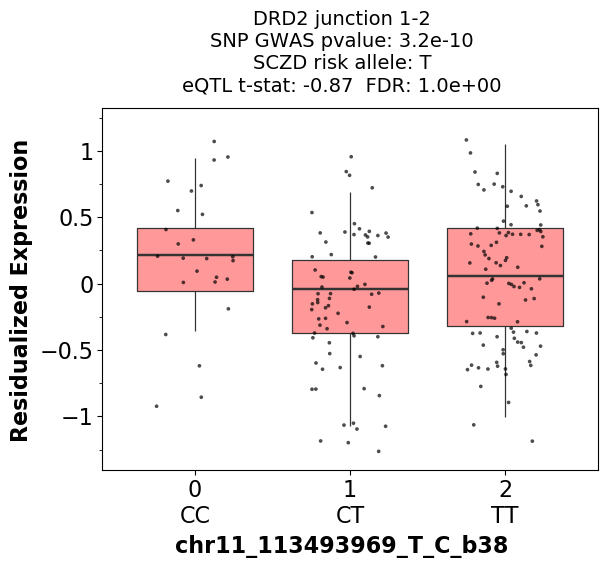

<ggplot: (8771444934446)>


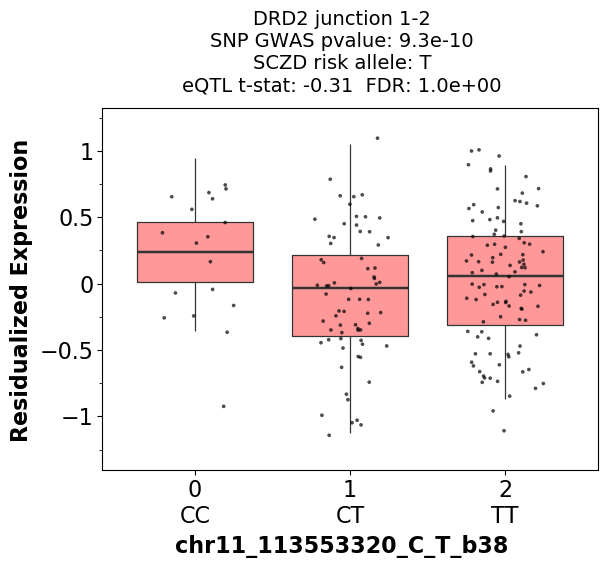

<ggplot: (8771523111521)>


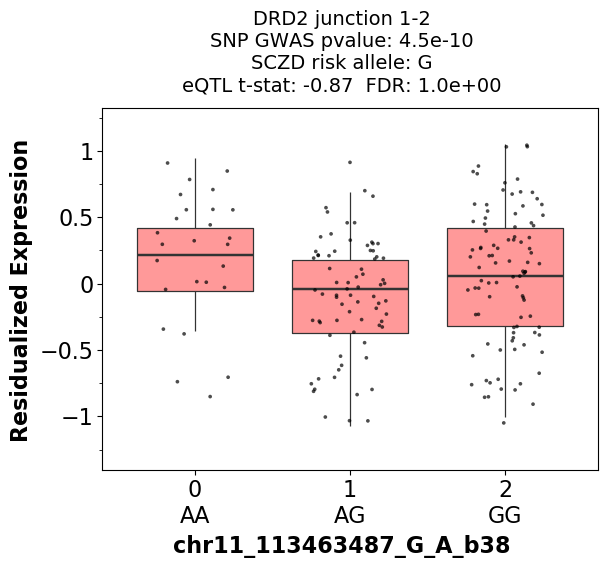

<ggplot: (8771444551256)>


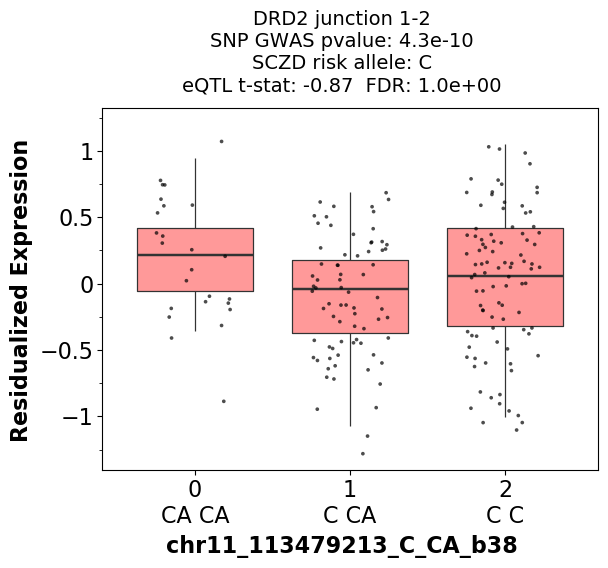

<ggplot: (8771445572337)>


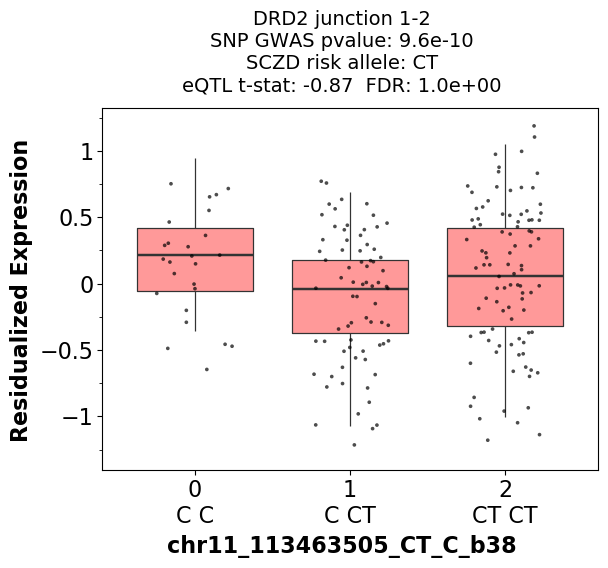

<ggplot: (8771444958835)>


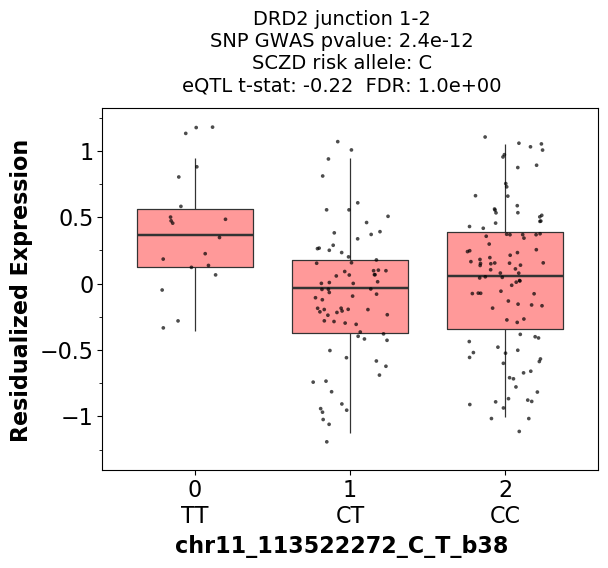

<ggplot: (8771444958907)>


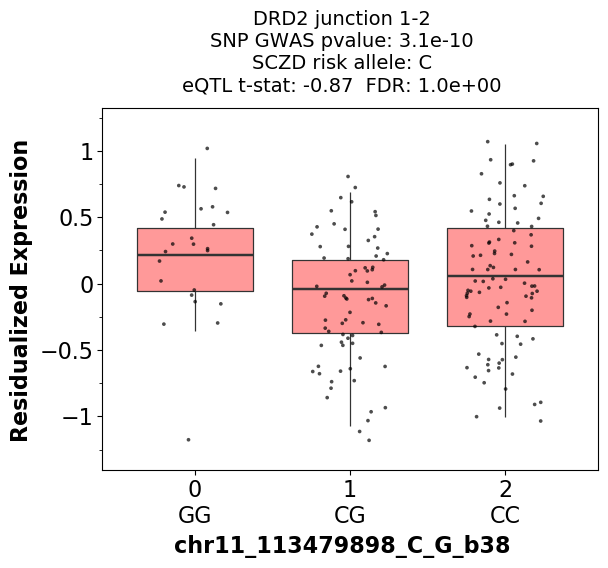

<ggplot: (8771445013935)>


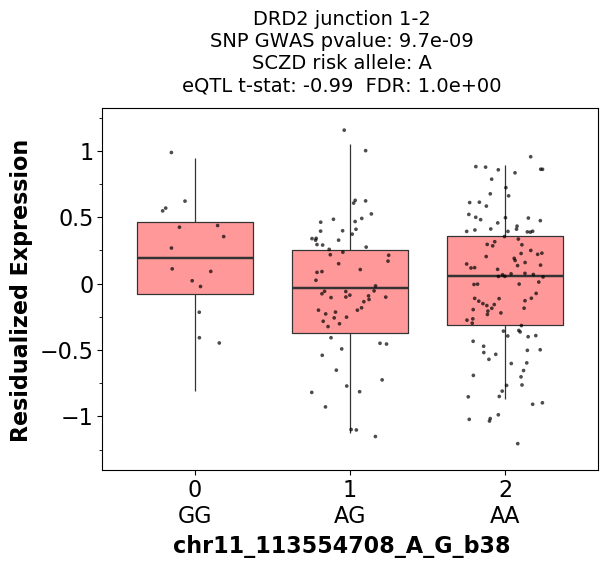

<ggplot: (8771524068639)>


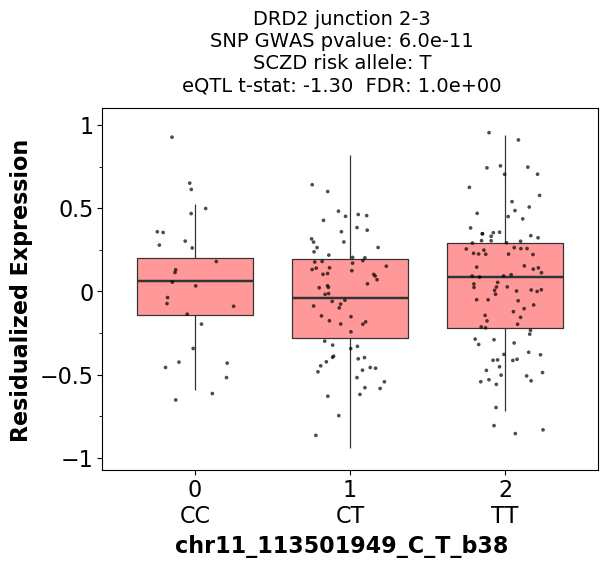

<ggplot: (8771444927043)>


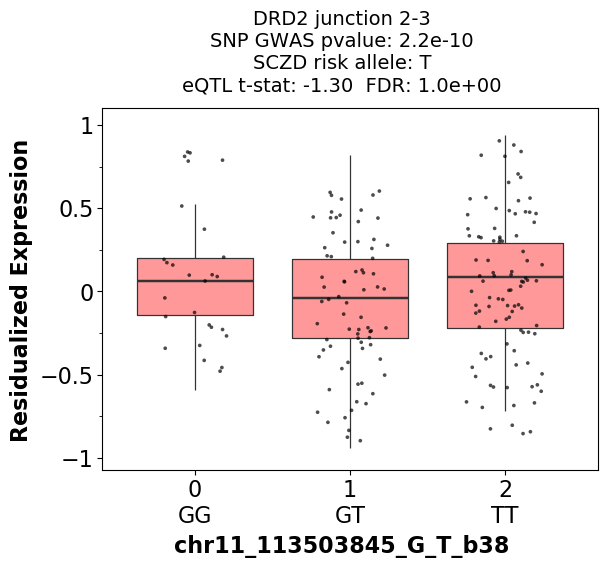

<ggplot: (8771444522506)>


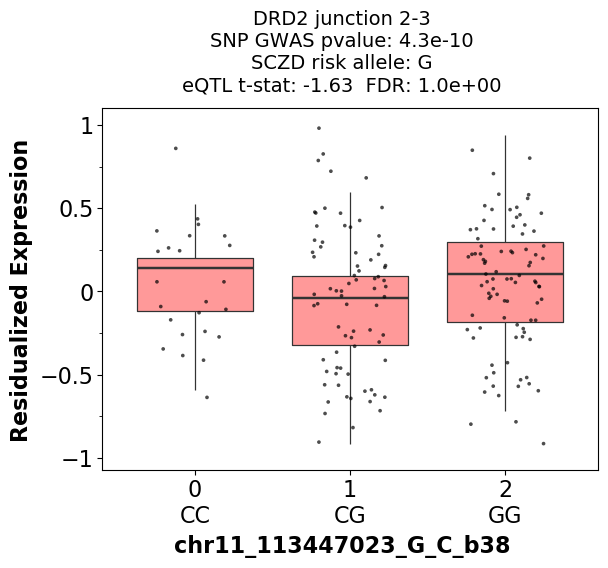

<ggplot: (8771524100419)>


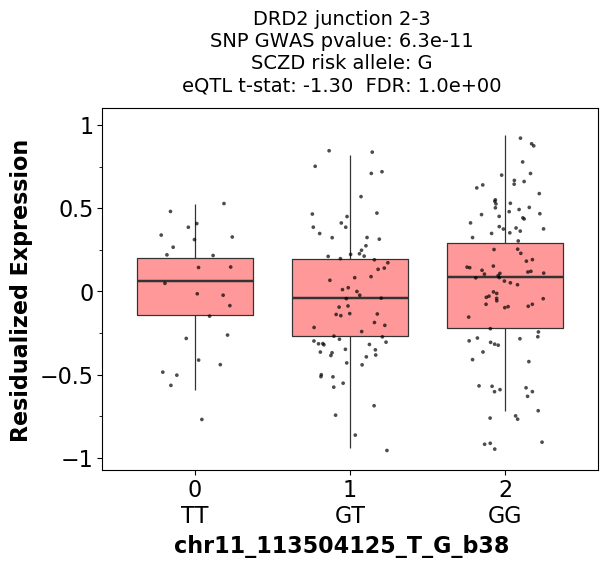

<ggplot: (8771523108398)>


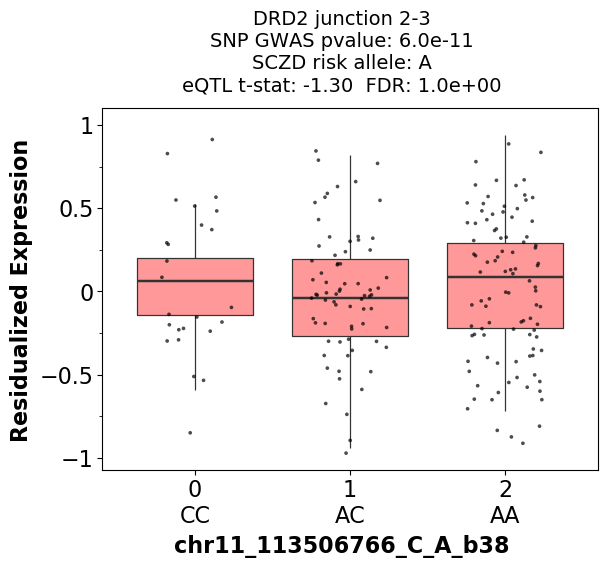

<ggplot: (8771524066112)>


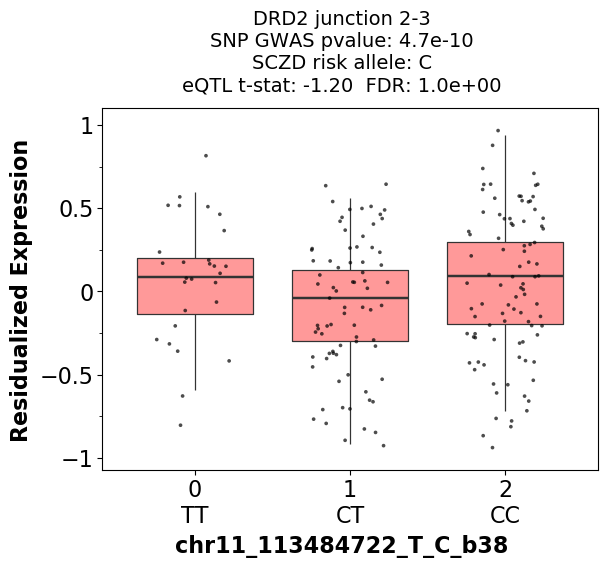

<ggplot: (8771444969313)>


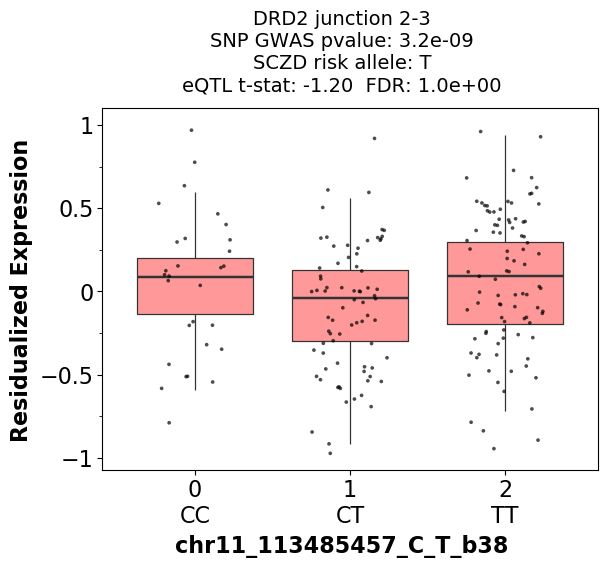

<ggplot: (8771524089953)>


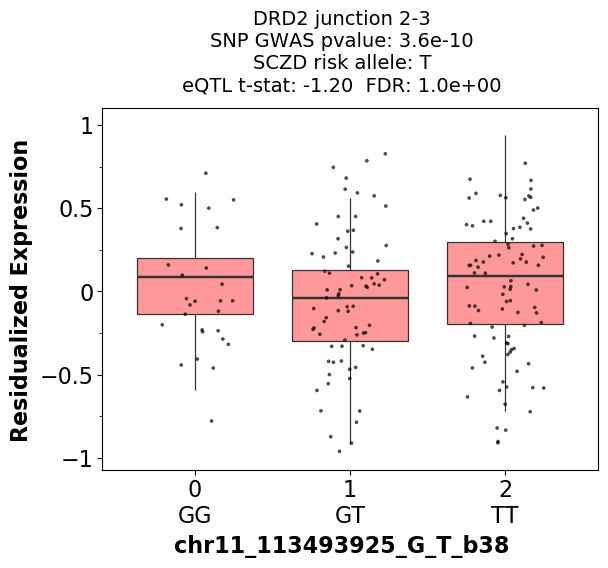

<ggplot: (8771524021101)>


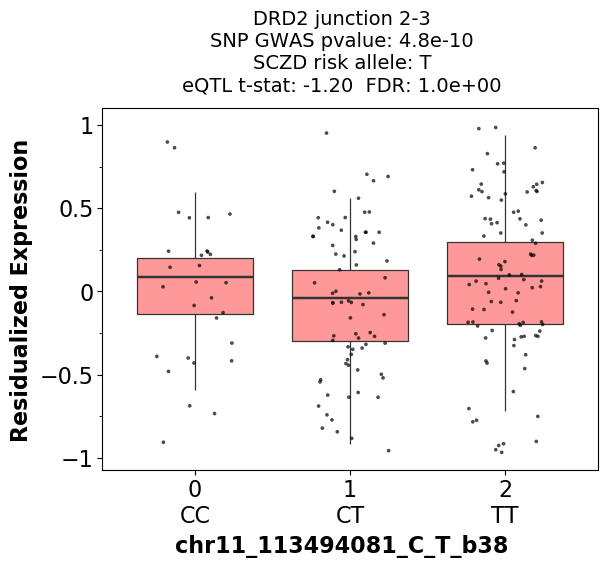

<ggplot: (8771524000606)>


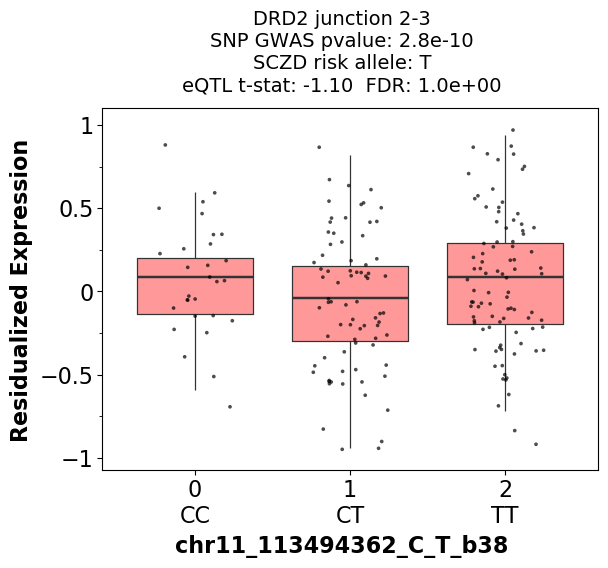

<ggplot: (8771523113244)>


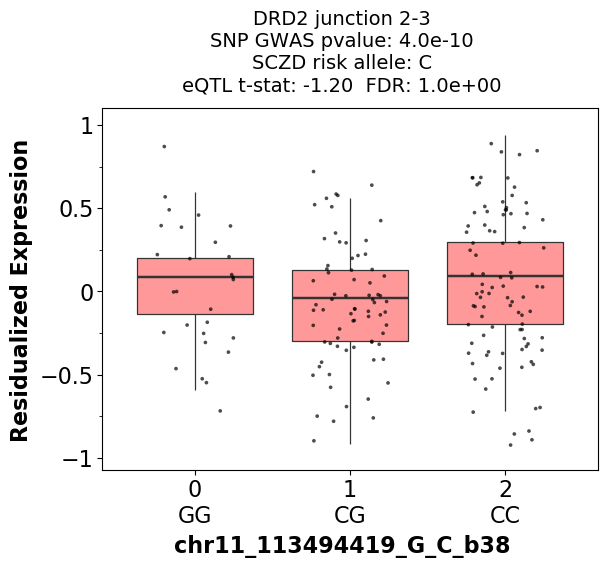

<ggplot: (8771445545304)>


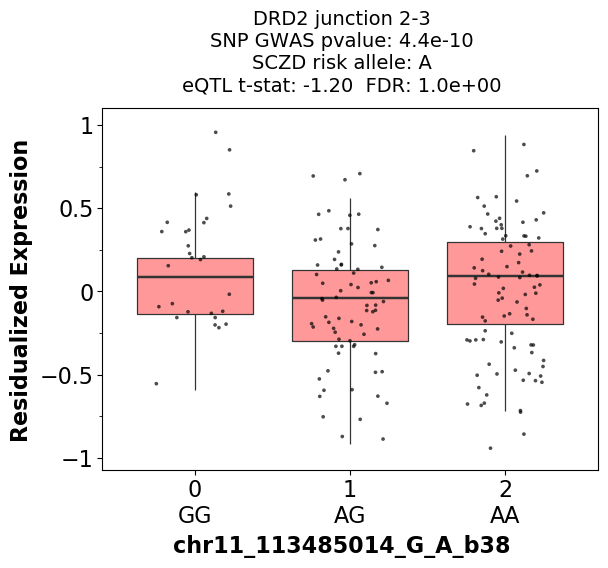

<ggplot: (8771524063597)>


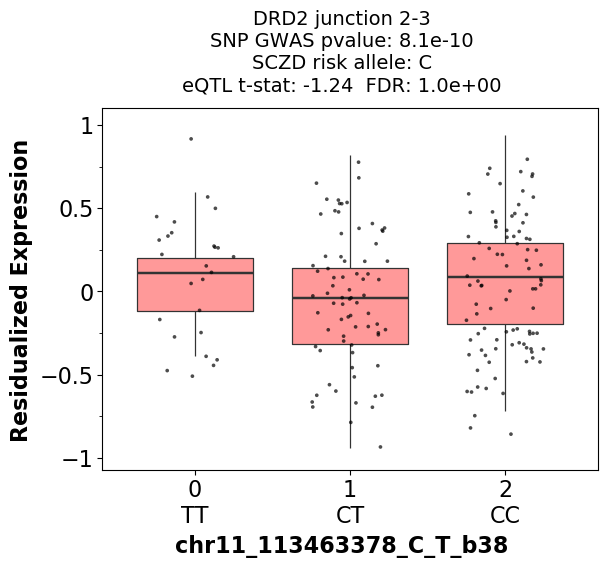

<ggplot: (8771524061070)>


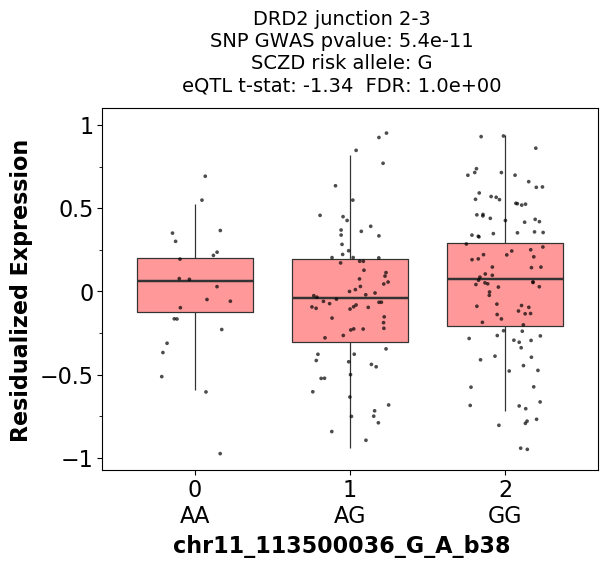

<ggplot: (8771524080445)>


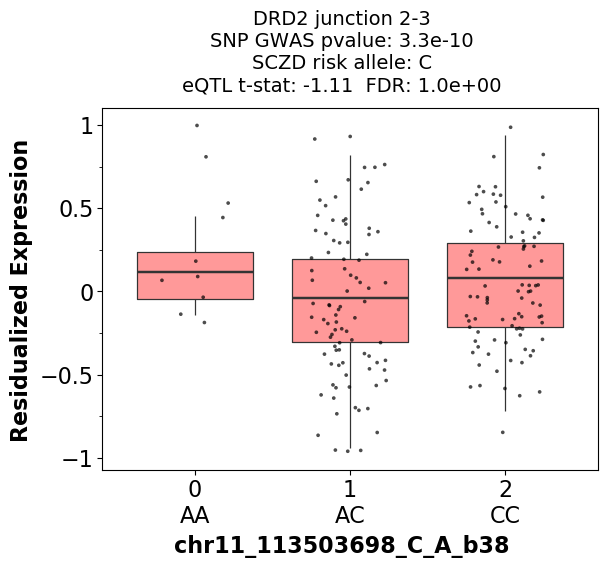

<ggplot: (8771444535709)>


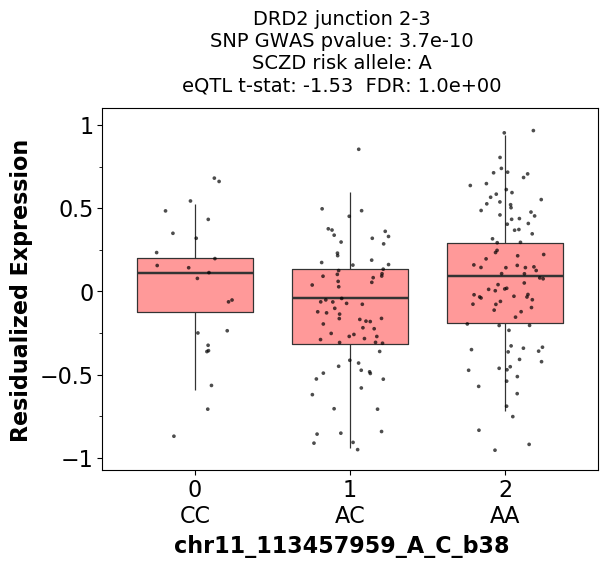

<ggplot: (8771445567248)>


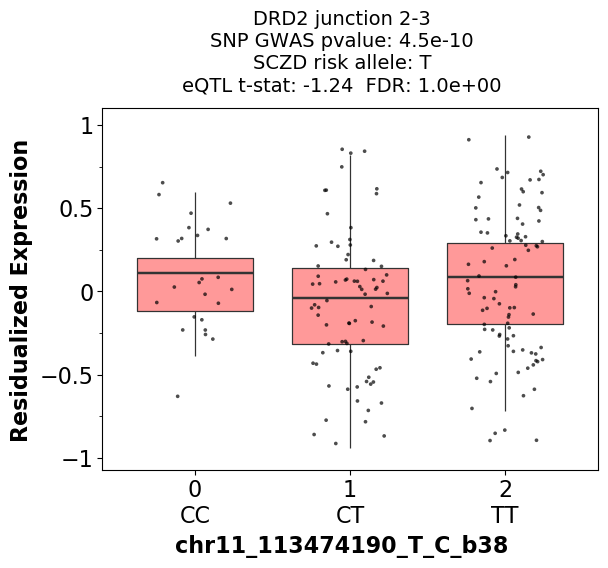

<ggplot: (8771444934596)>


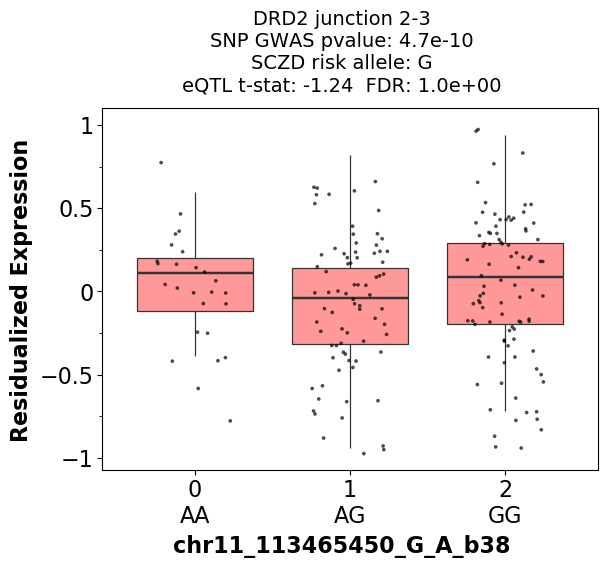

<ggplot: (8771444551355)>


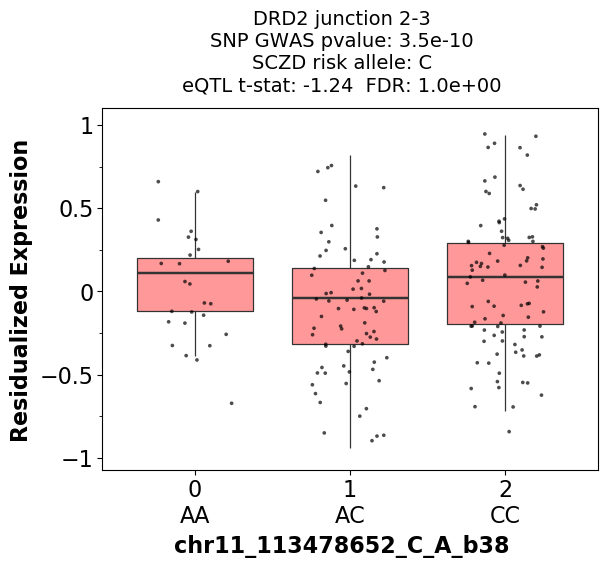

<ggplot: (8771444890426)>


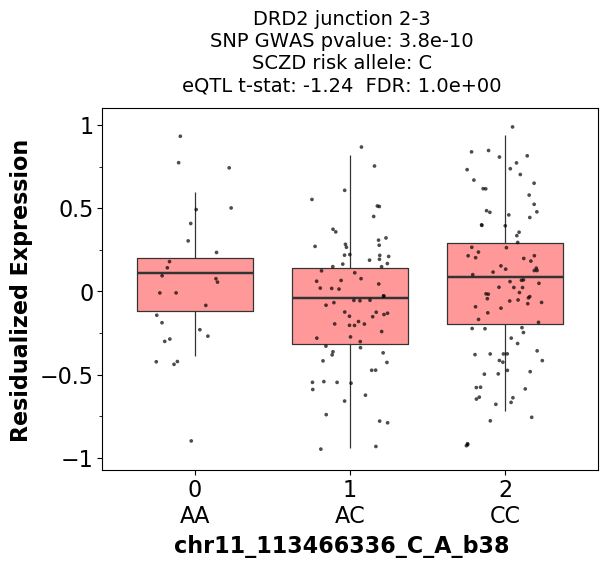

<ggplot: (8771445572232)>


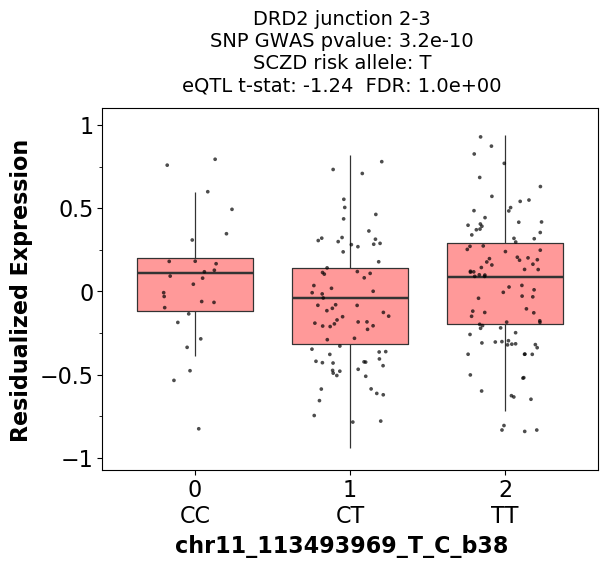

<ggplot: (8771524061040)>


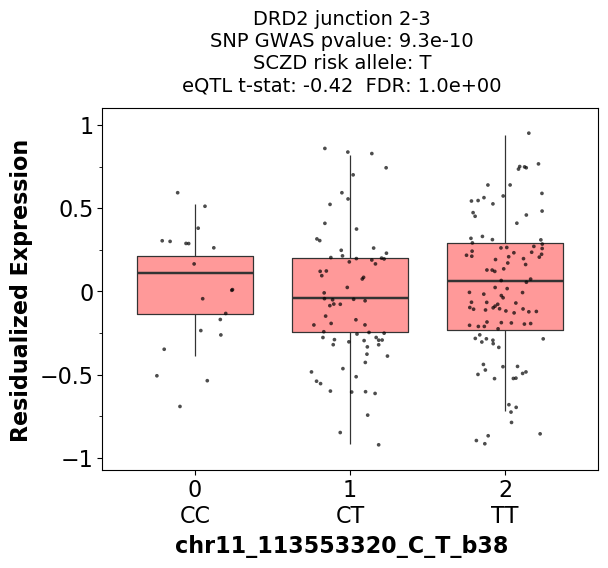

<ggplot: (8771444503745)>


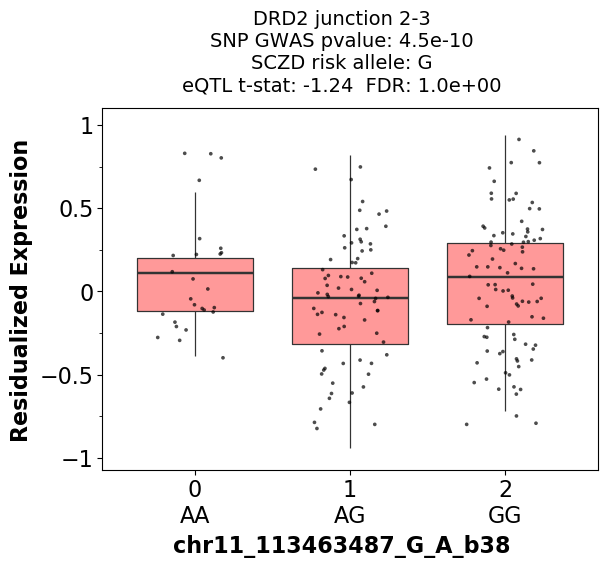

<ggplot: (8771524072816)>


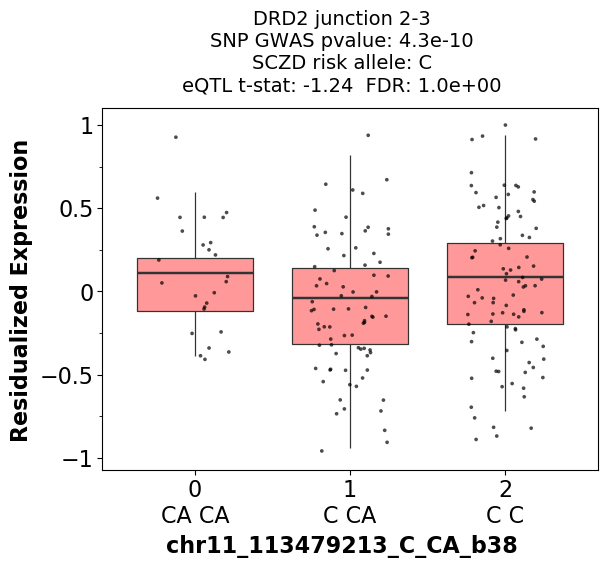

<ggplot: (8771523159474)>


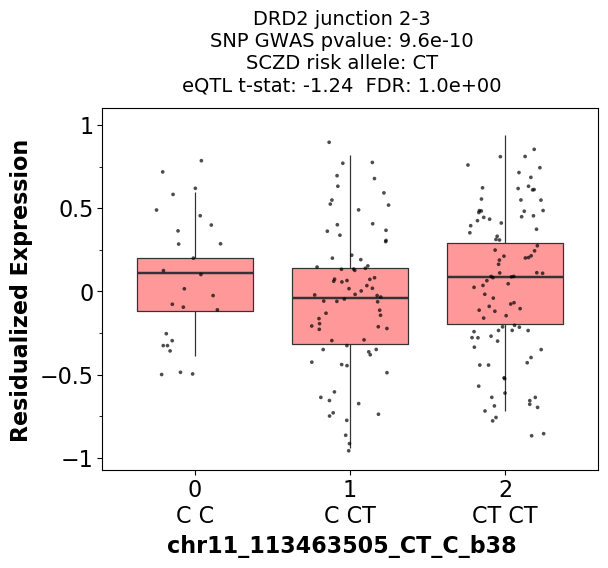

<ggplot: (8771524021233)>


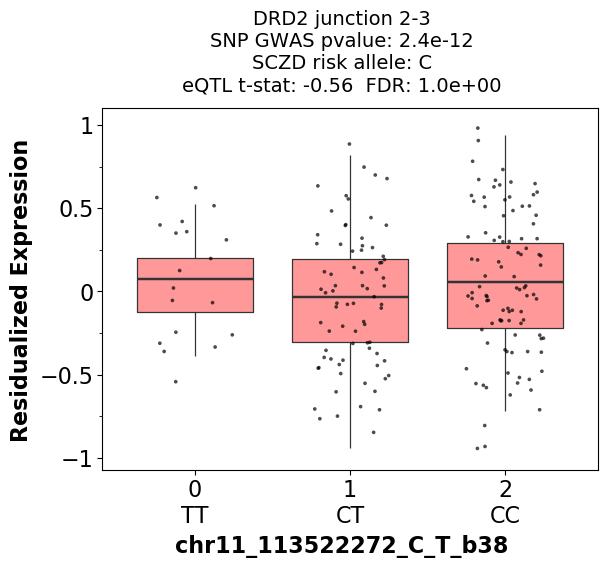

<ggplot: (8771523147406)>


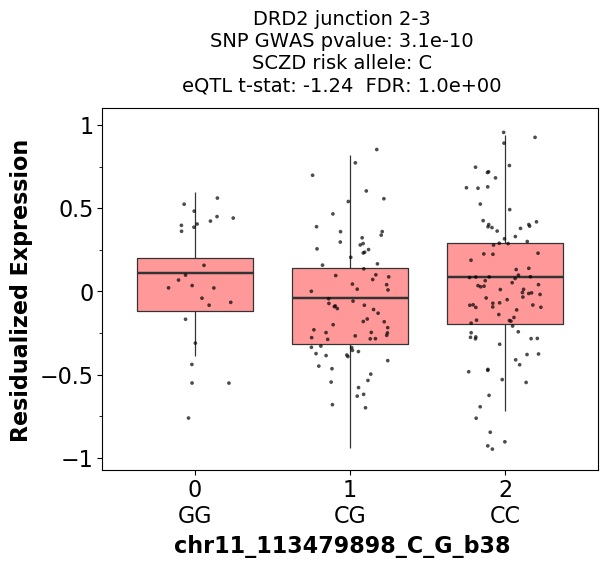

<ggplot: (8771524092447)>


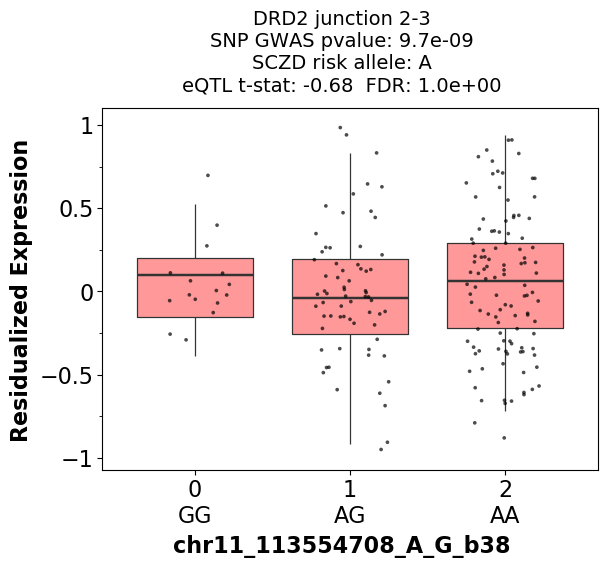

<ggplot: (8771524109451)>


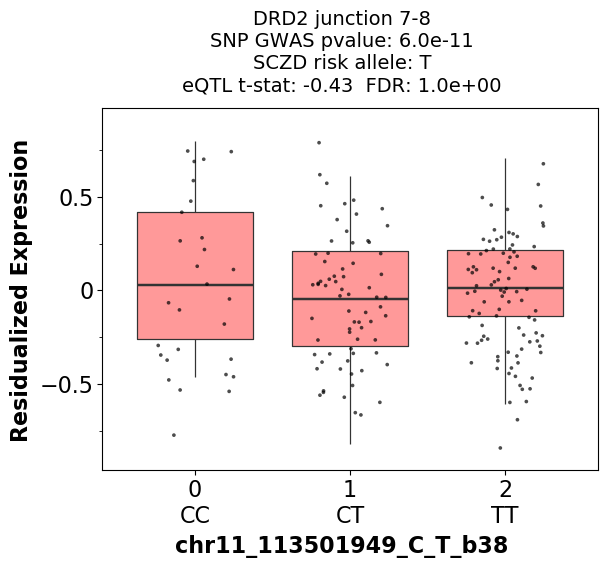

<ggplot: (8771445075776)>


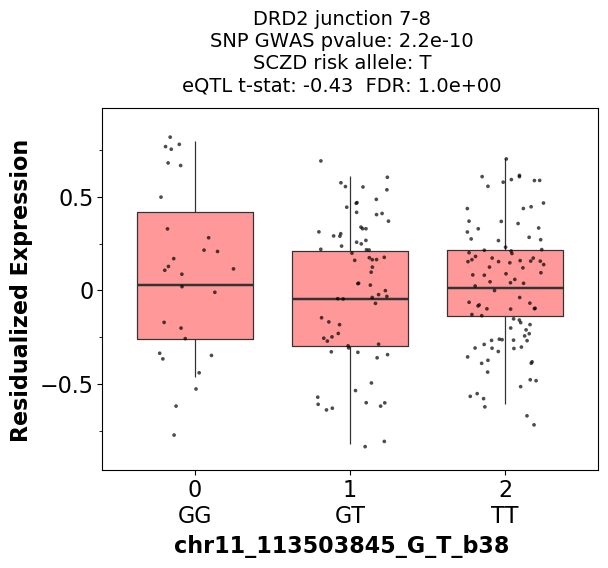

<ggplot: (8771523149328)>


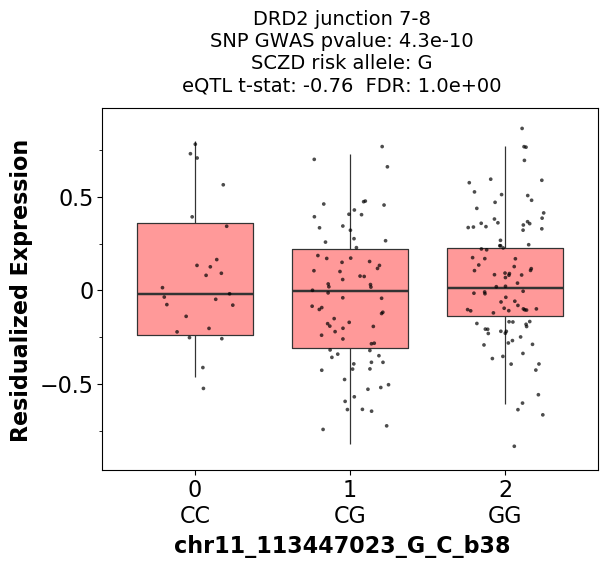

<ggplot: (8771445013803)>


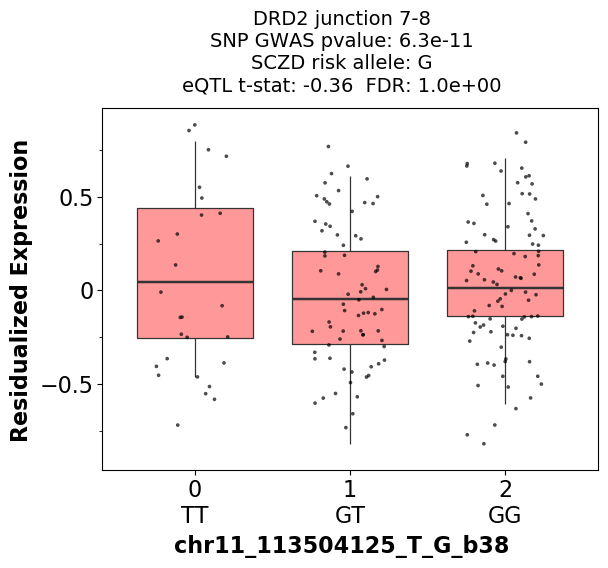

<ggplot: (8771523152068)>


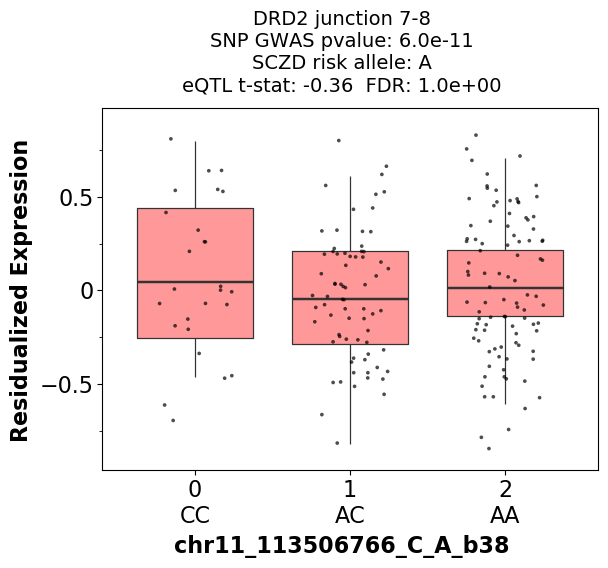

<ggplot: (8771445499805)>


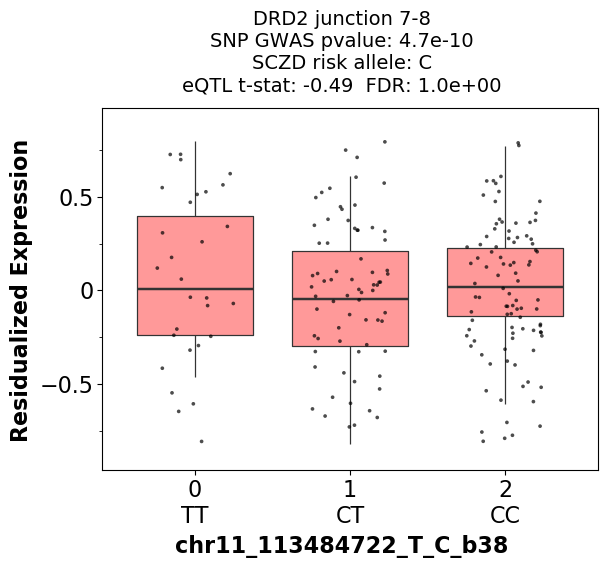

<ggplot: (8771445568717)>


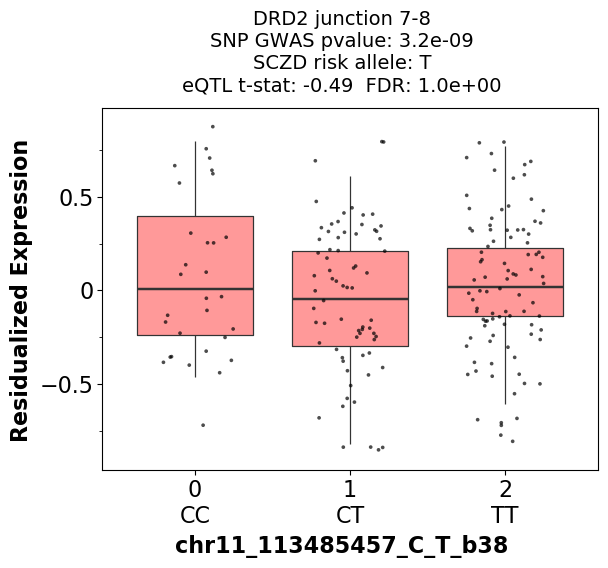

<ggplot: (8771523143909)>


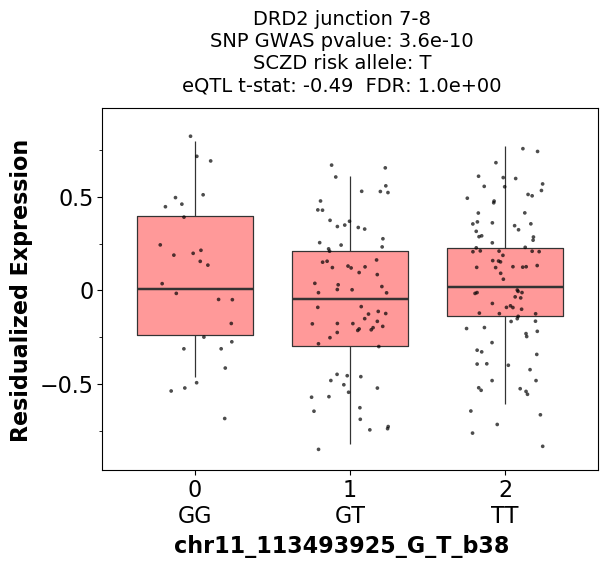

<ggplot: (8771524007054)>


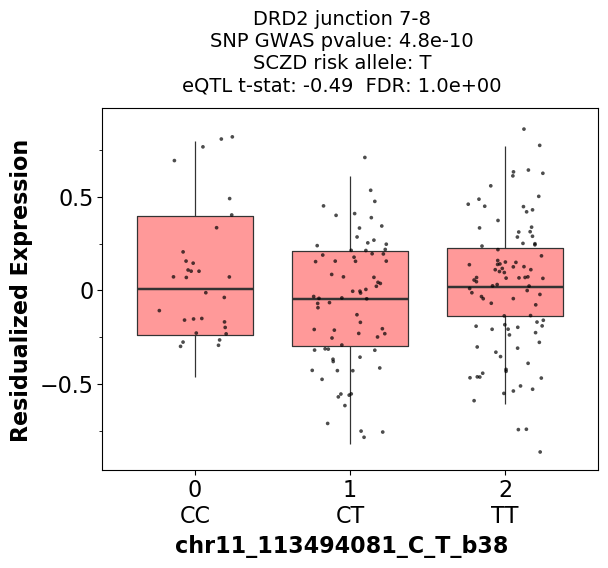

<ggplot: (8771523118400)>


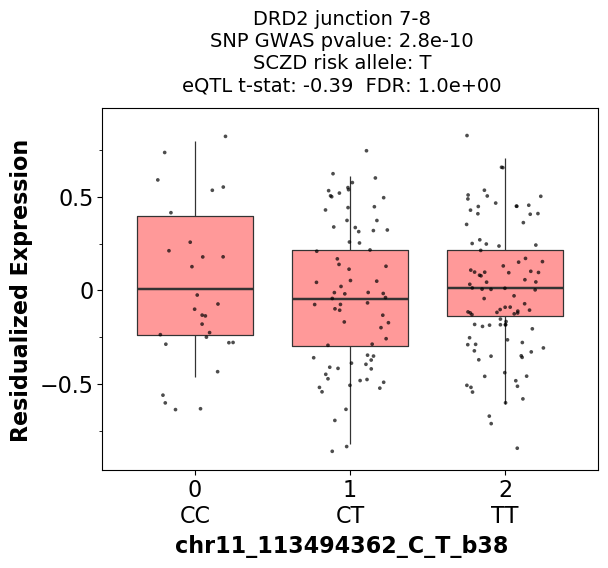

<ggplot: (8771523130838)>


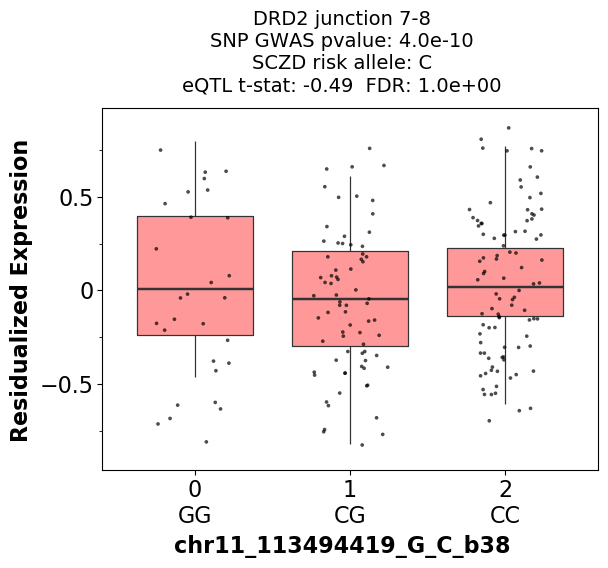

<ggplot: (8771523145647)>


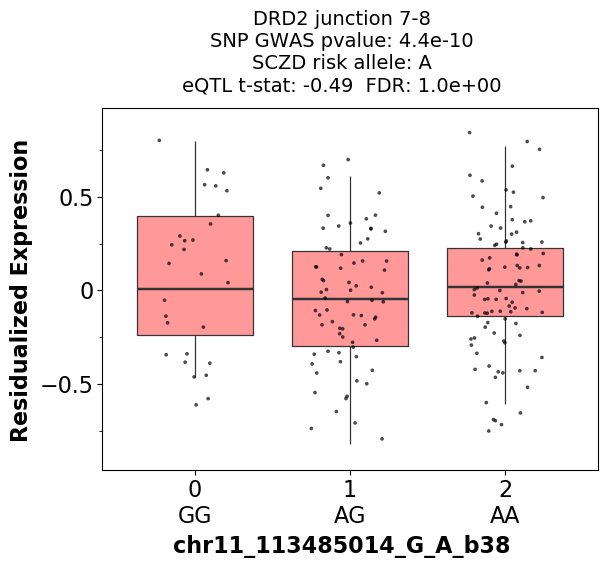

<ggplot: (8771523123450)>


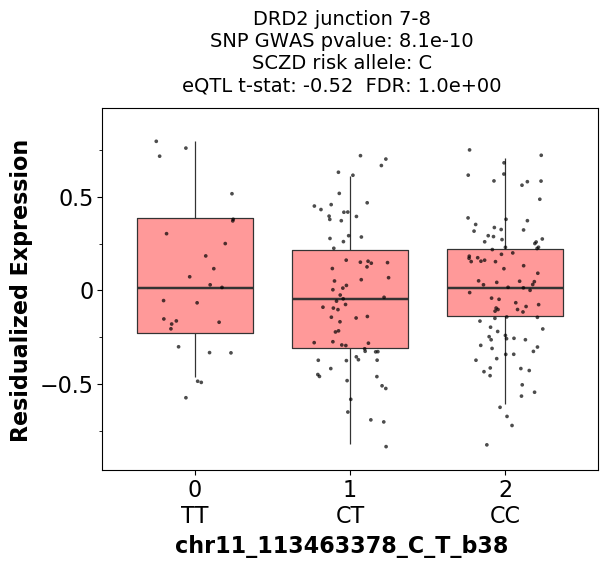

<ggplot: (8771524131503)>


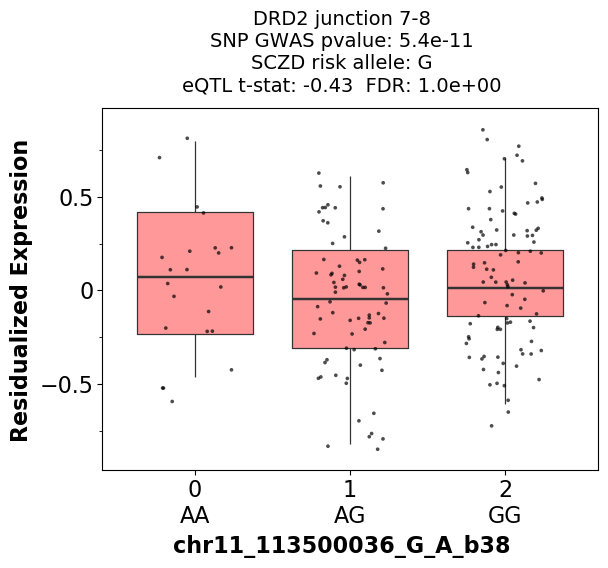

<ggplot: (8771523982948)>


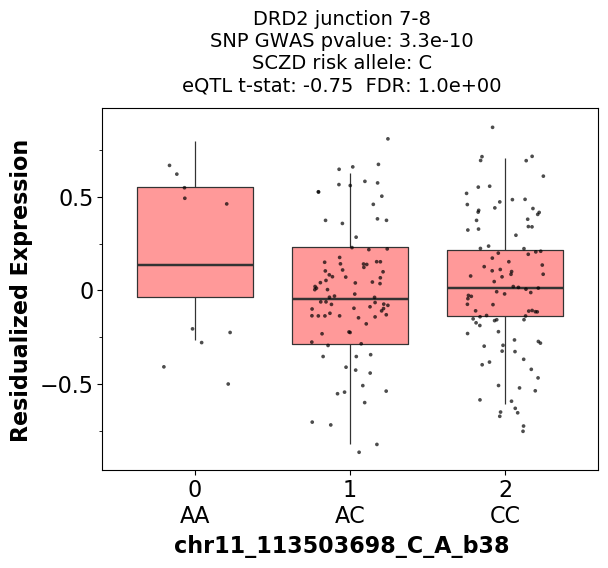

<ggplot: (8771523982957)>


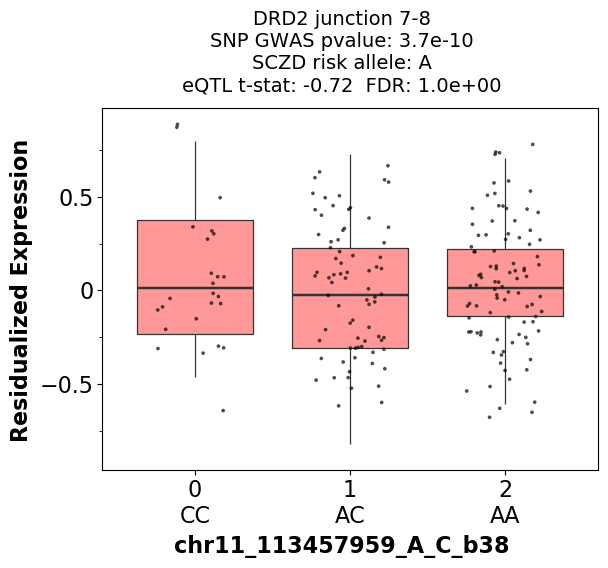

<ggplot: (8771523165052)>


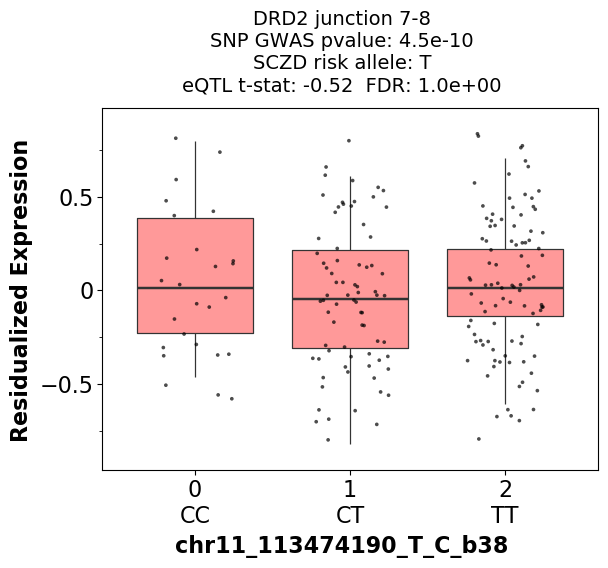

<ggplot: (8771445006544)>


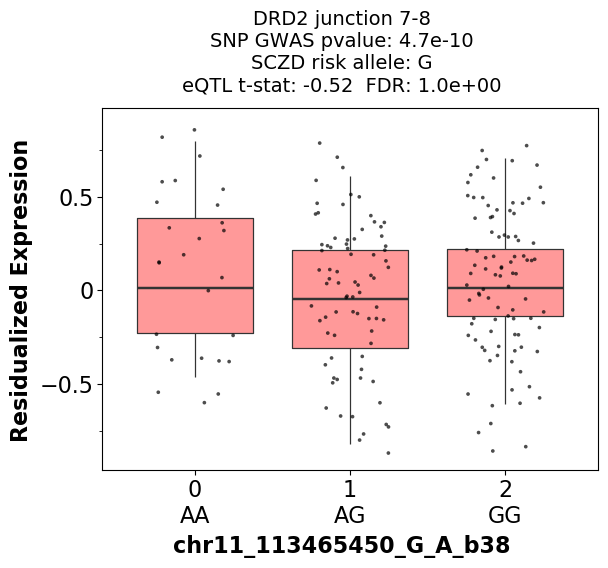

<ggplot: (8771445006535)>


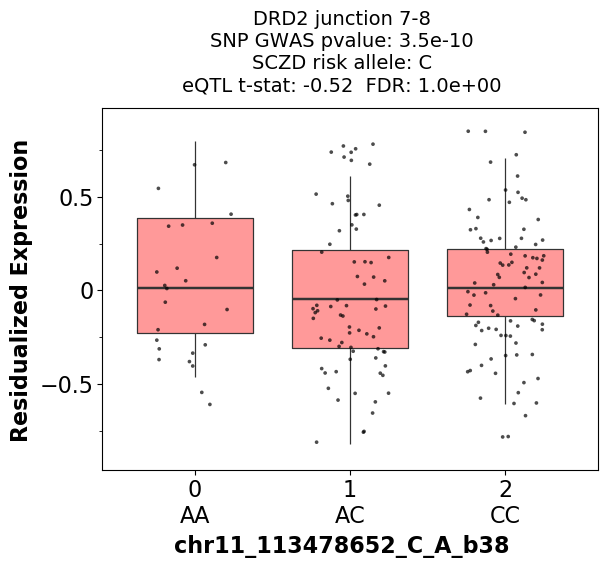

<ggplot: (8771523151354)>


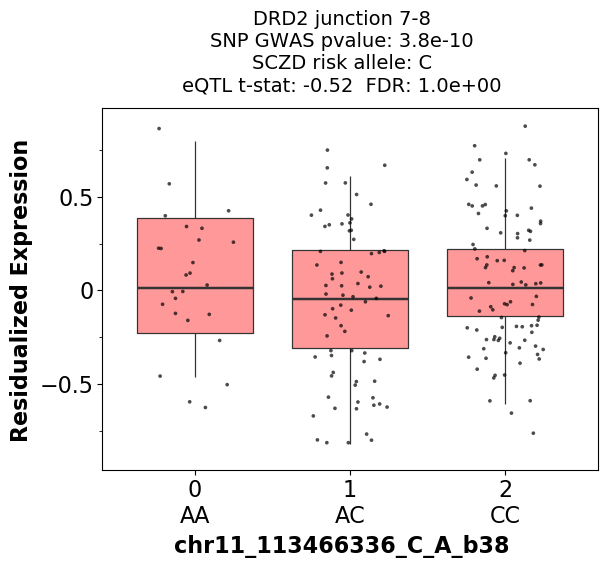

<ggplot: (8771444843716)>


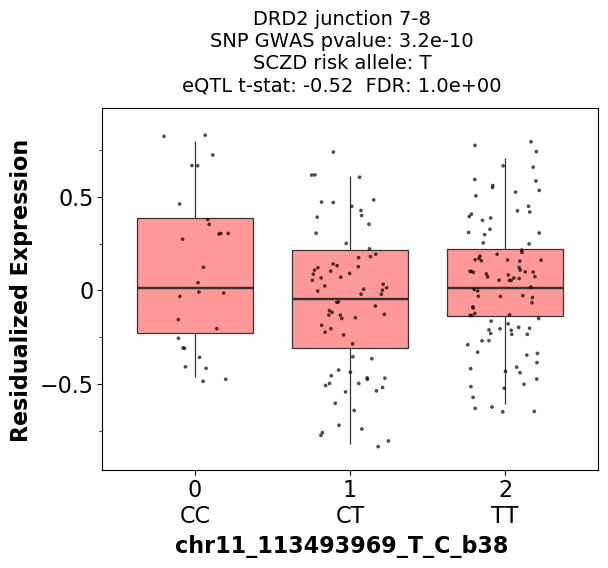

<ggplot: (8771445512364)>


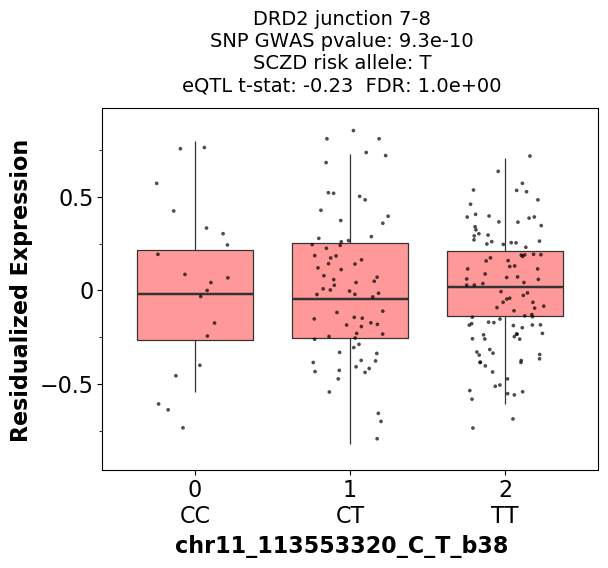

<ggplot: (8771445039300)>


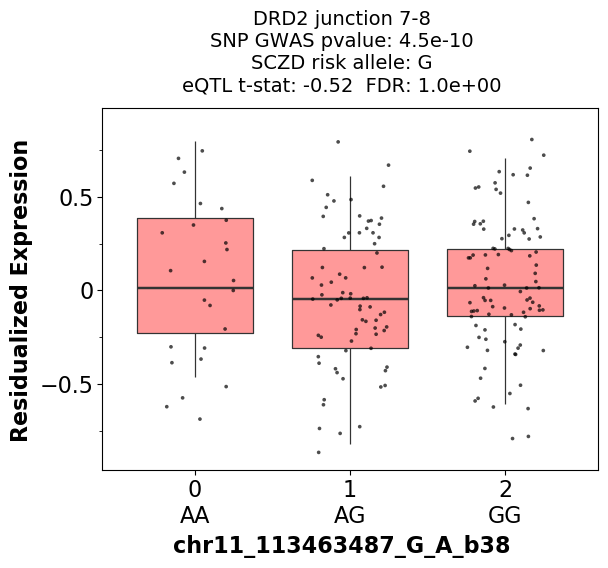

<ggplot: (8771445544042)>


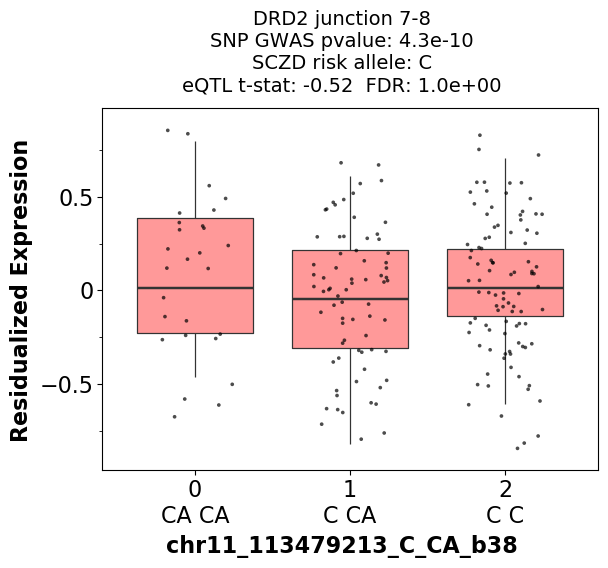

<ggplot: (8771523988637)>


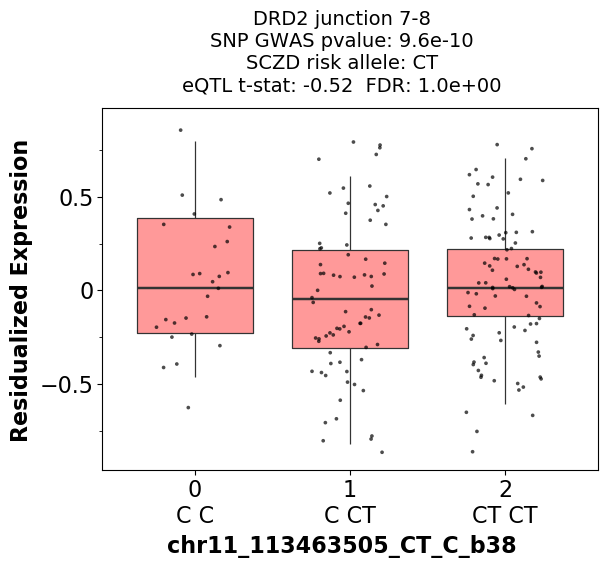

<ggplot: (8771445016643)>


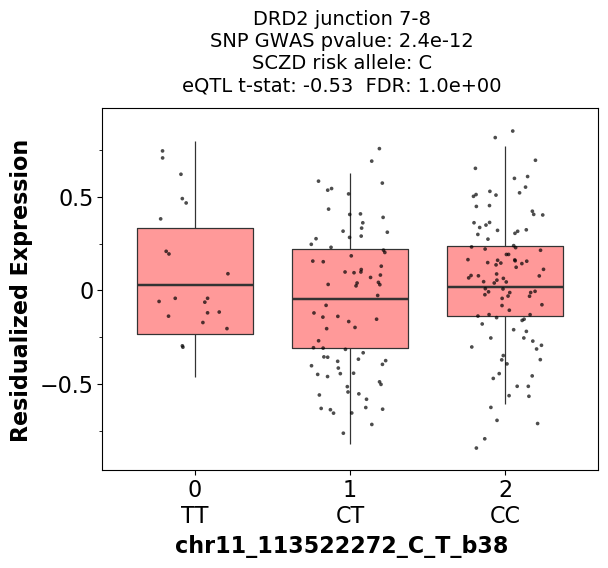

<ggplot: (8771445084959)>


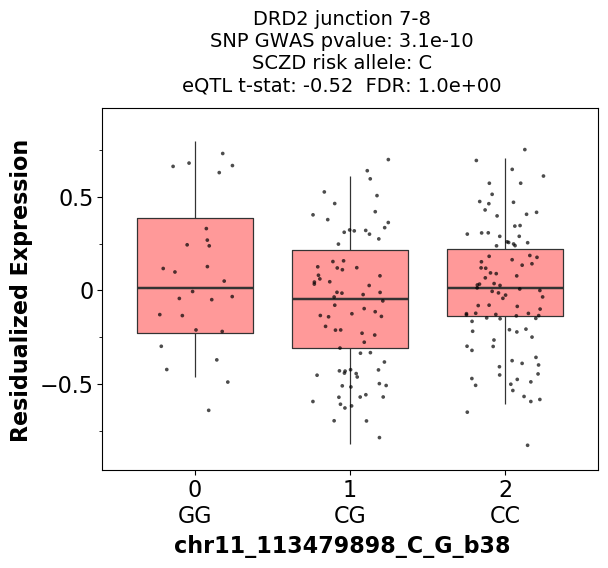

<ggplot: (8771523152653)>


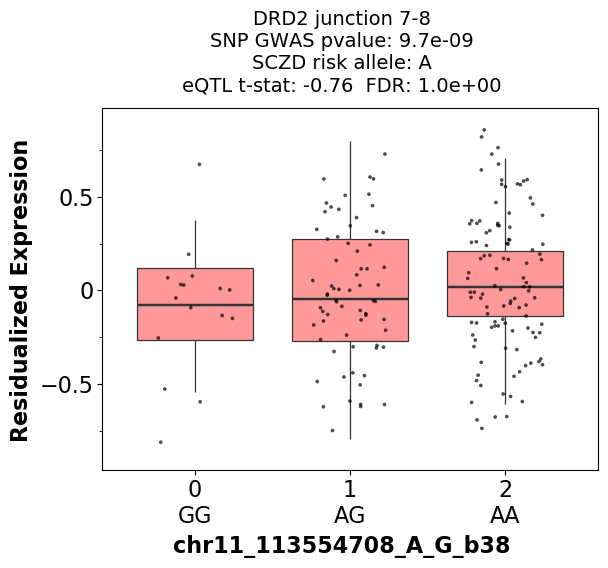

<ggplot: (8771445527116)>


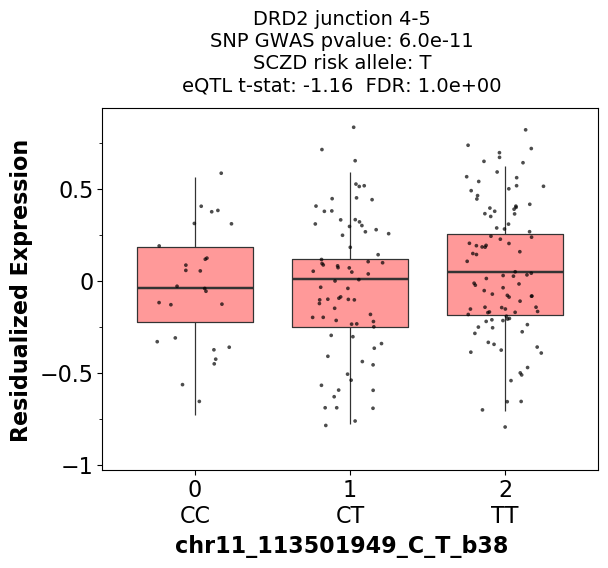

<ggplot: (8771523147560)>


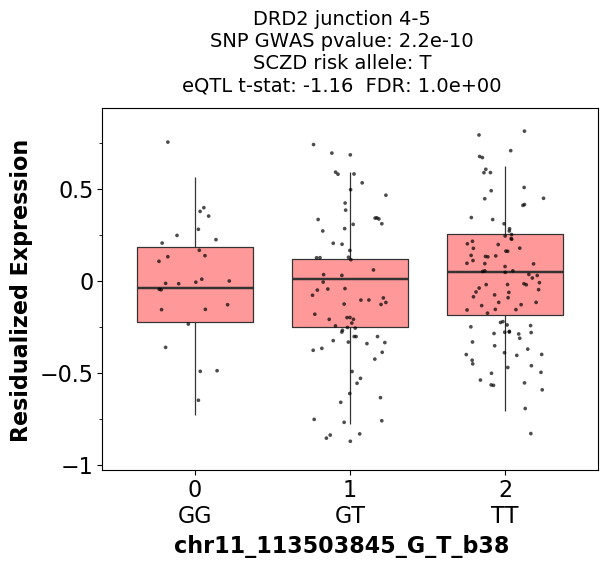

<ggplot: (8771524075400)>


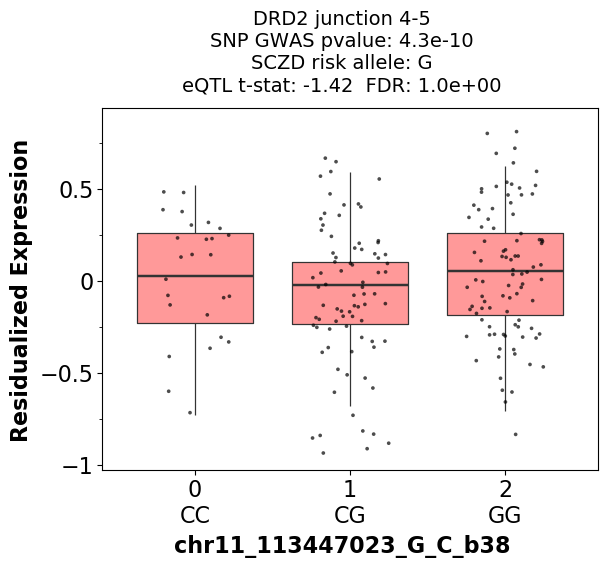

<ggplot: (8771524123661)>


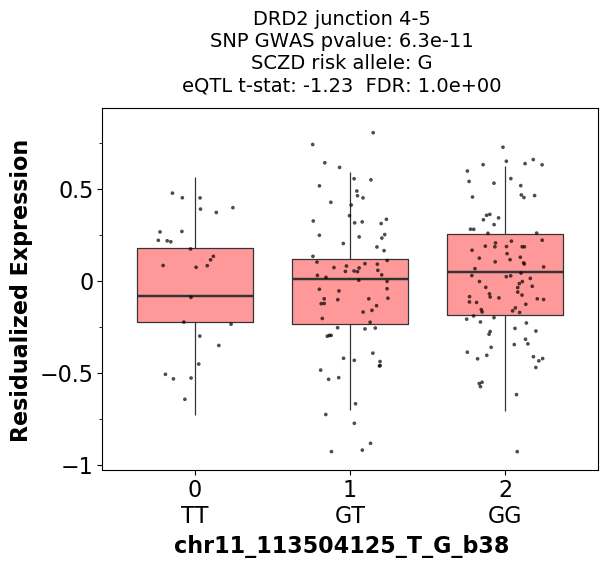

<ggplot: (8771444969274)>


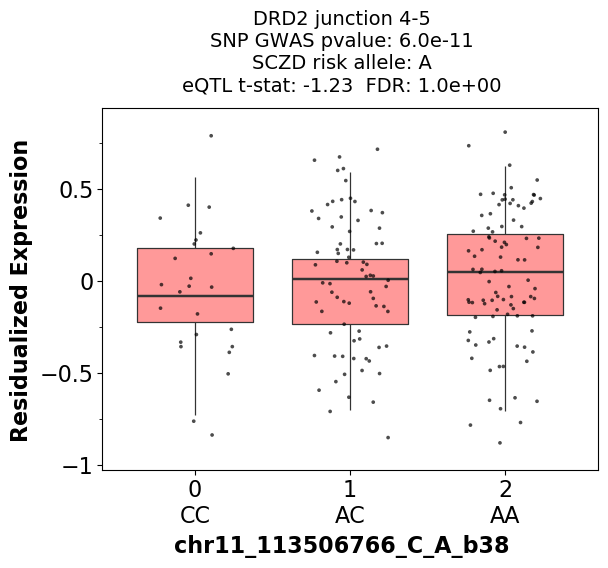

<ggplot: (8771524026941)>


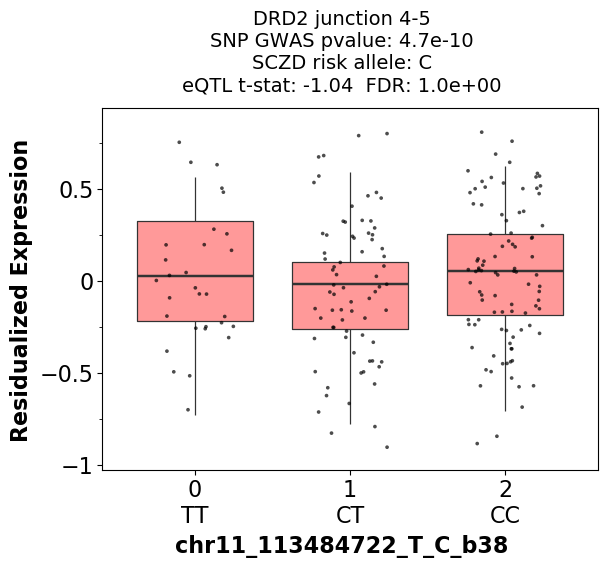

<ggplot: (8771523172642)>


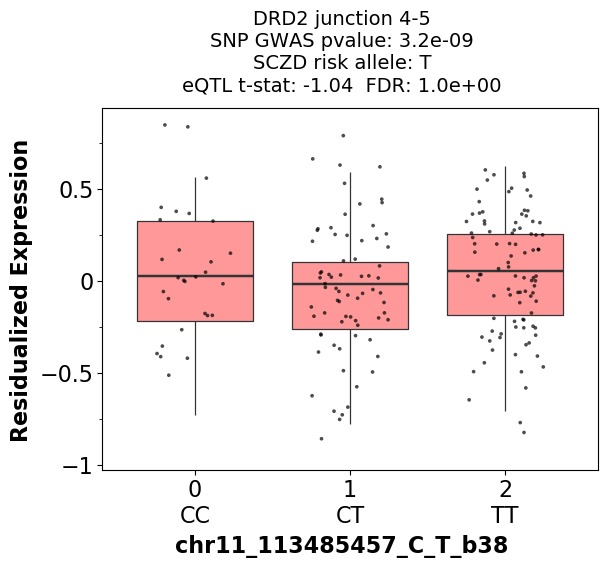

<ggplot: (8771445001352)>


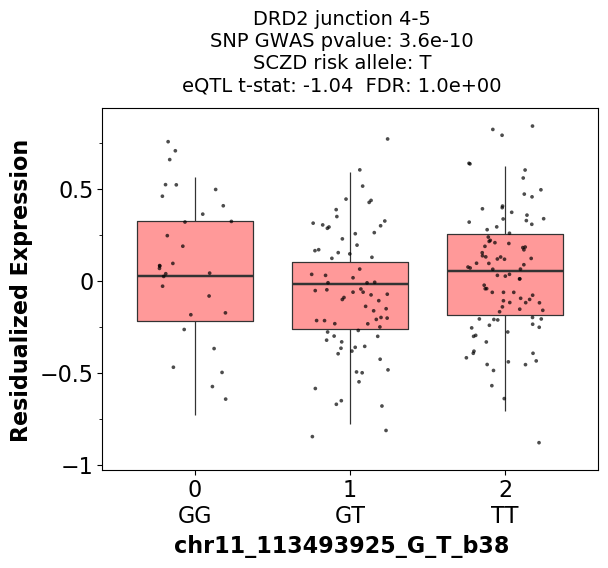

<ggplot: (8771445041649)>


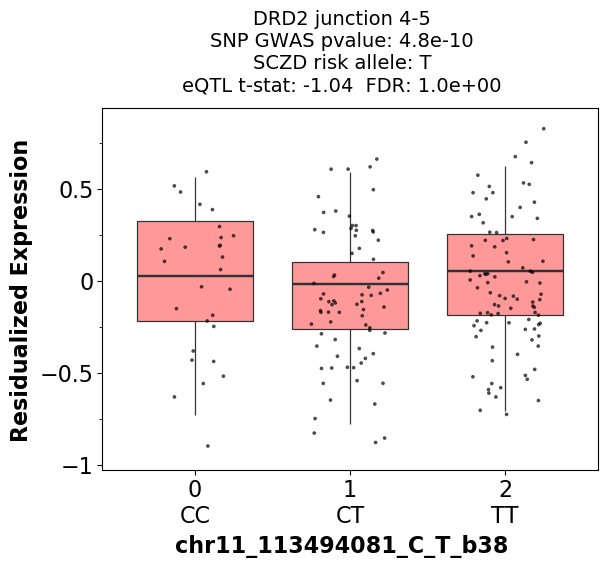

<ggplot: (8771523148325)>


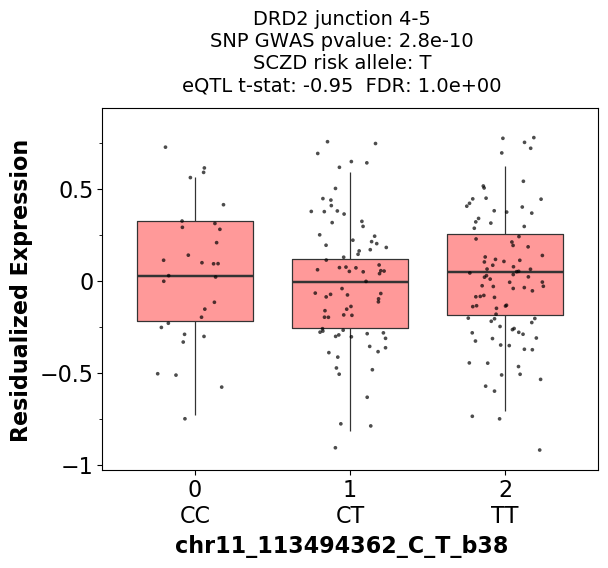

<ggplot: (8771445013866)>


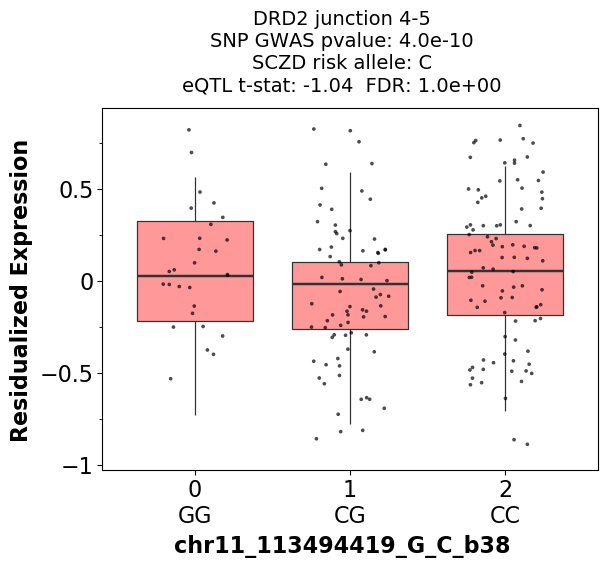

<ggplot: (8771523130435)>


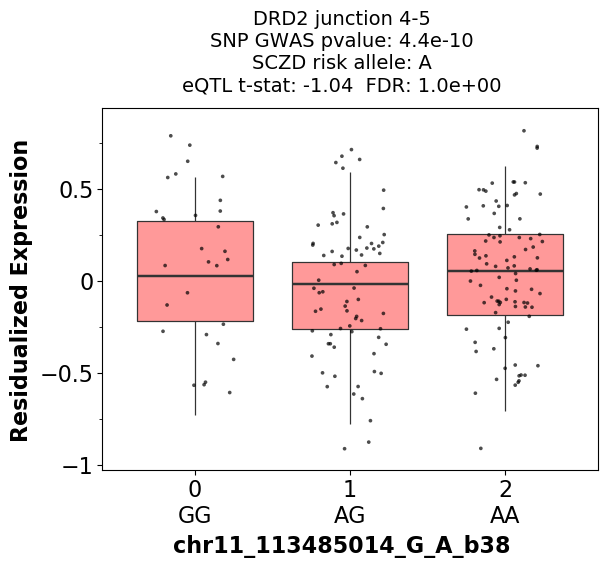

<ggplot: (8771445573626)>


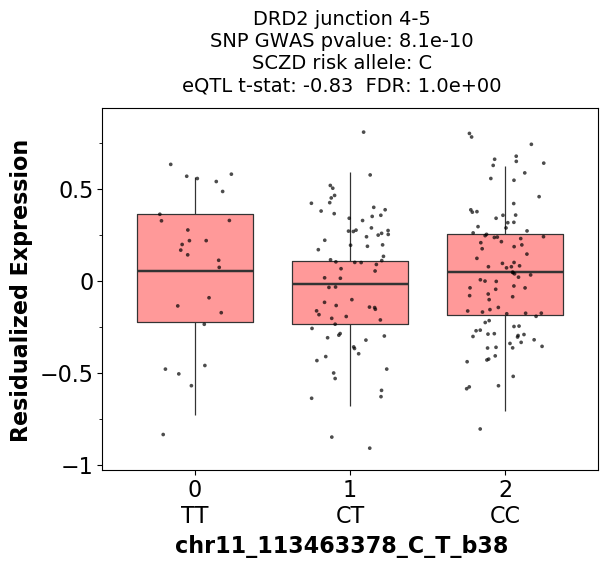

<ggplot: (8771523148448)>


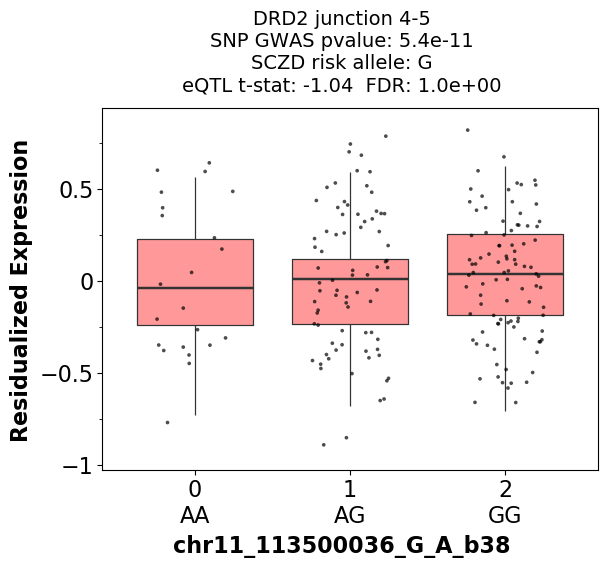

<ggplot: (8771523130682)>


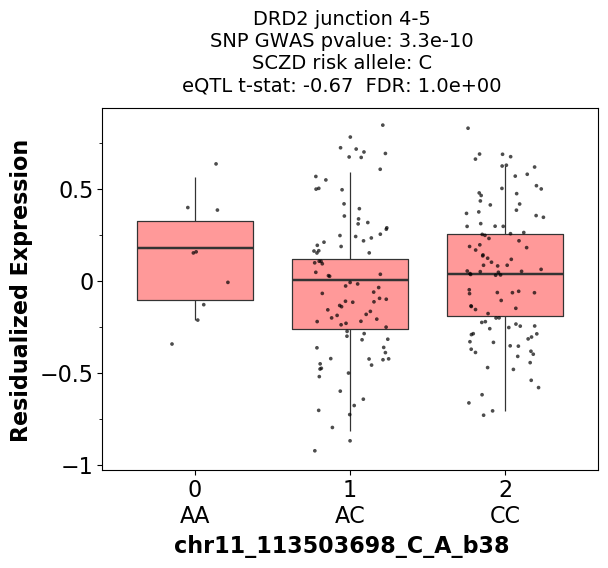

<ggplot: (8771523993941)>


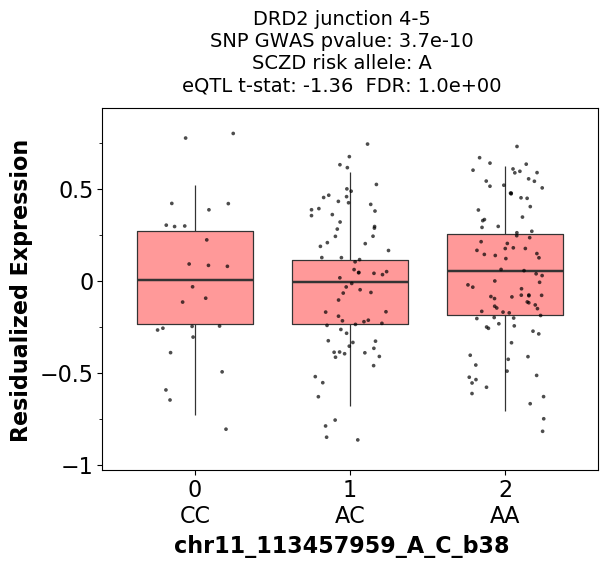

<ggplot: (8771444531833)>


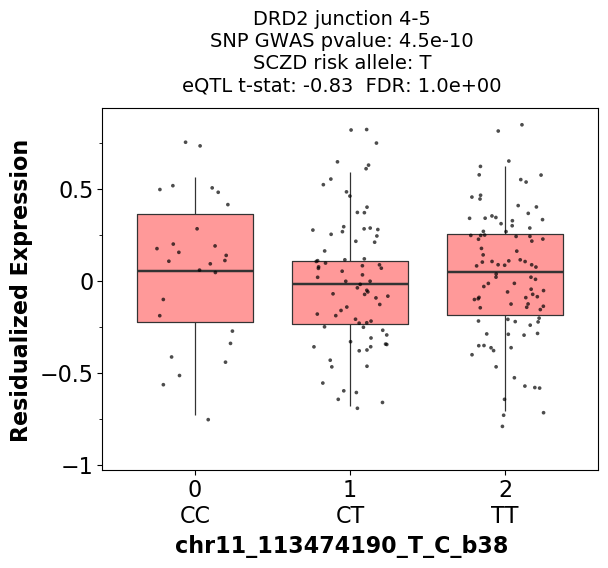

<ggplot: (8771444551259)>


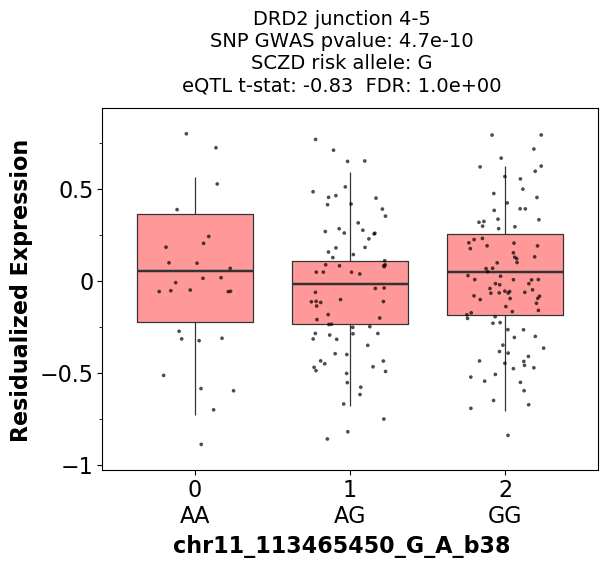

<ggplot: (8771523115096)>


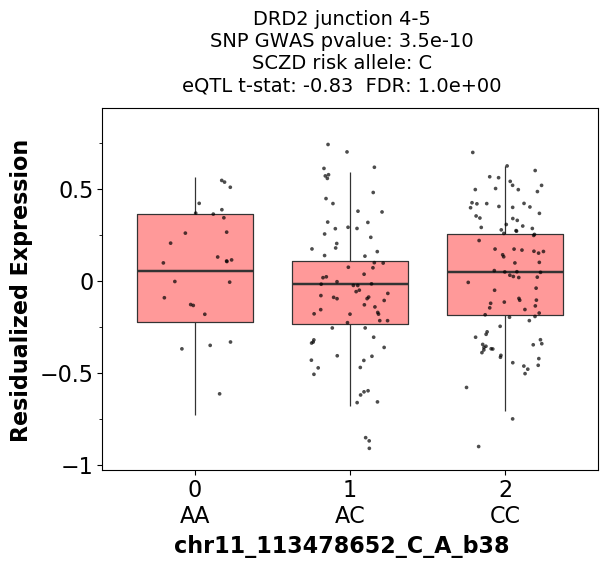

<ggplot: (8771523115213)>


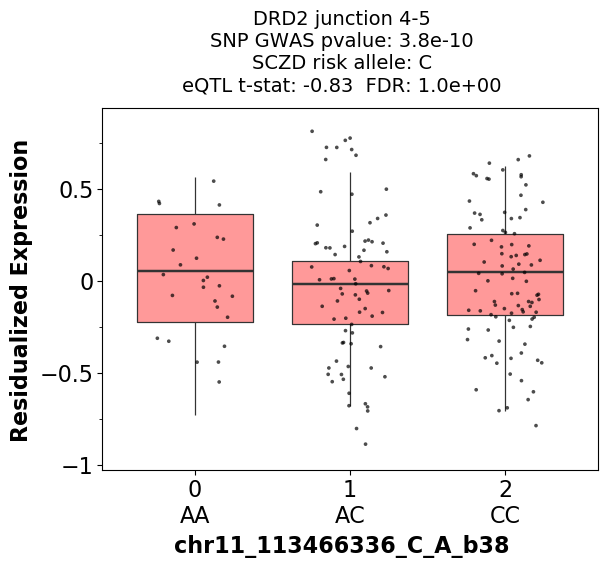

<ggplot: (8771445063554)>


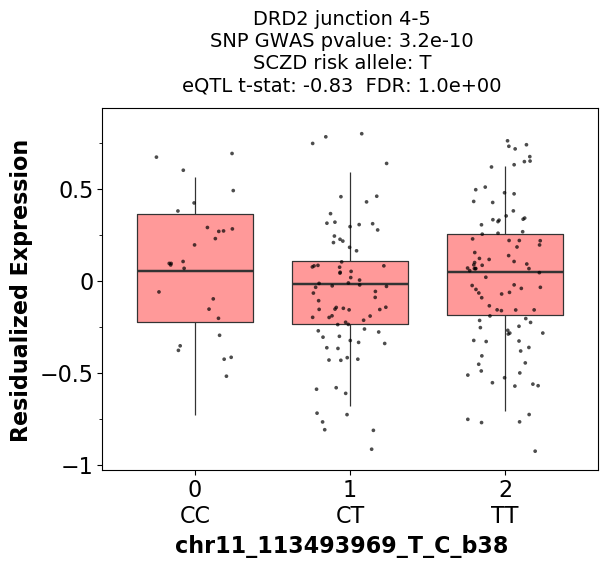

<ggplot: (8771523135666)>


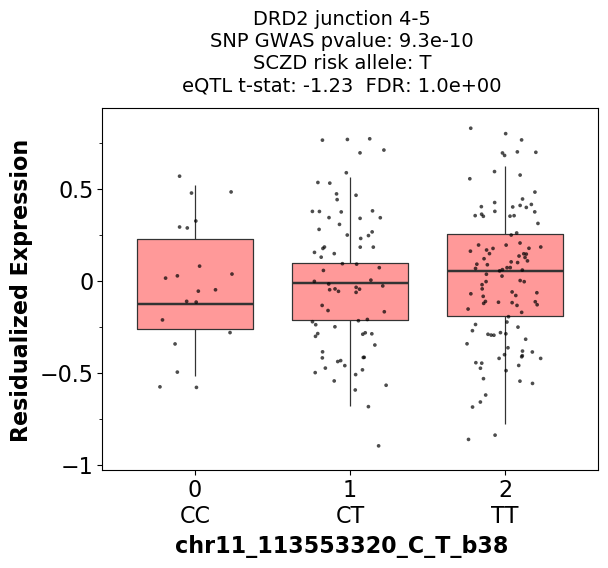

<ggplot: (8771445075725)>


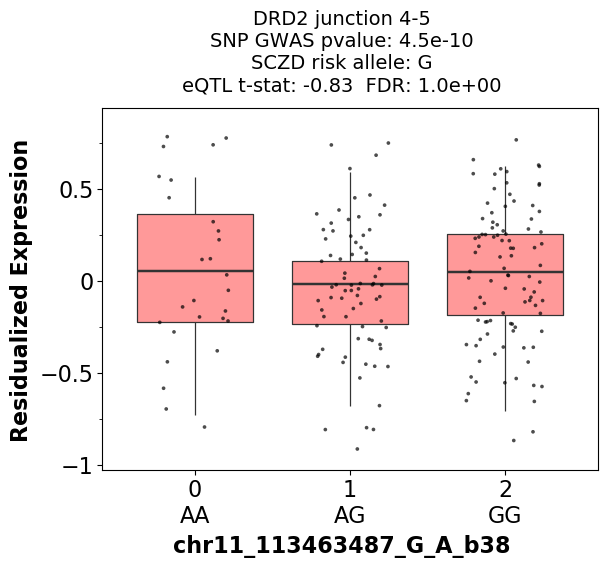

<ggplot: (8771445058913)>


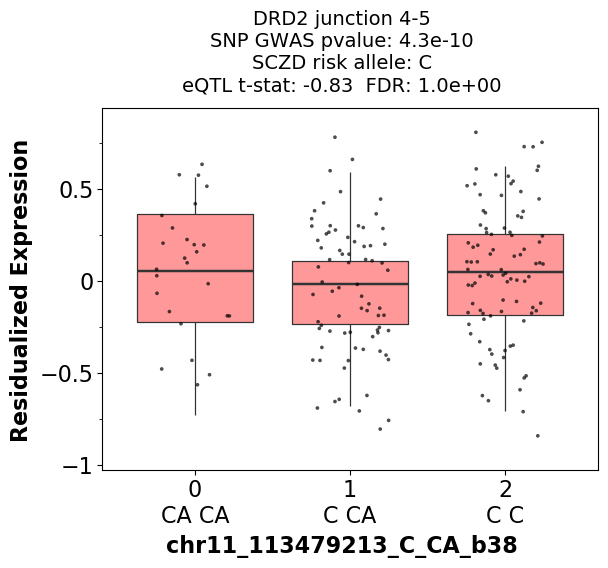

<ggplot: (8771523164603)>


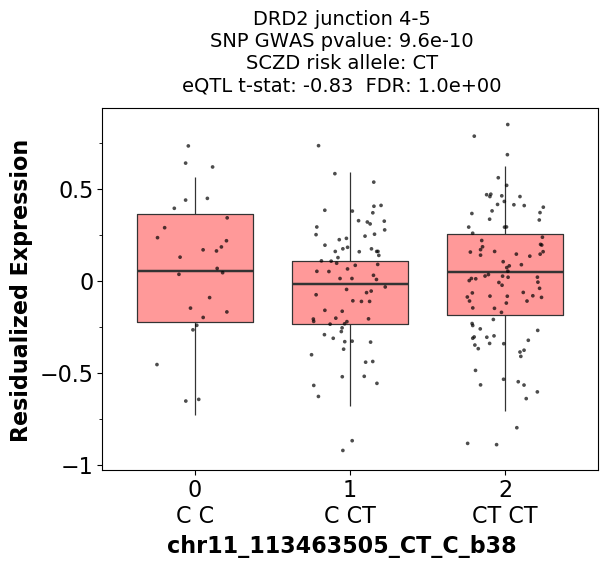

<ggplot: (8771445547593)>


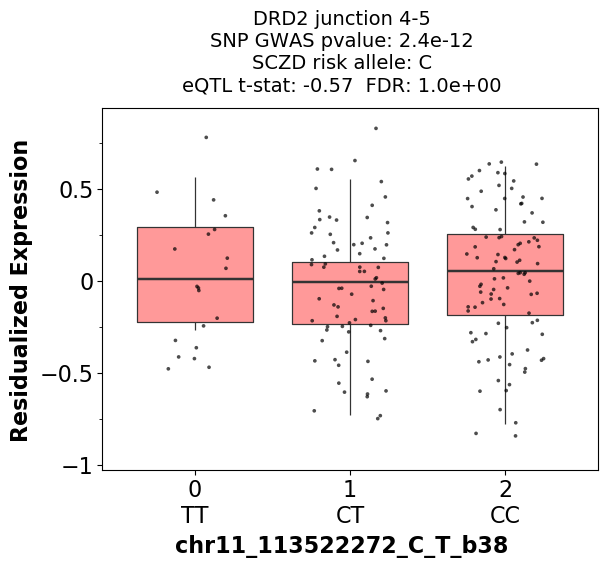

<ggplot: (8771444843683)>


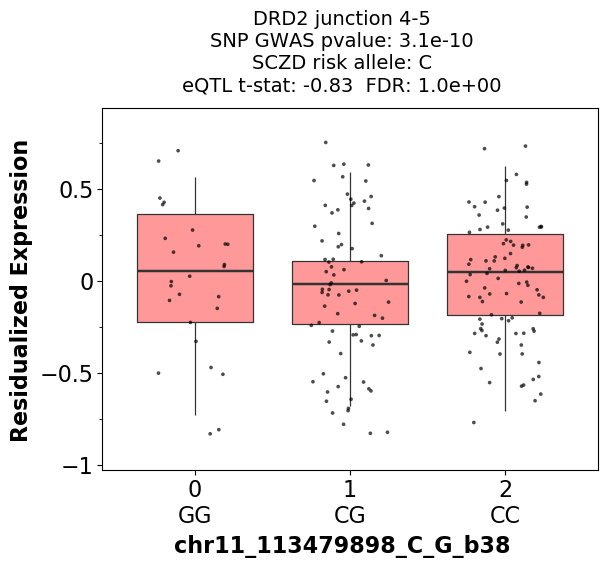

<ggplot: (8771445499697)>


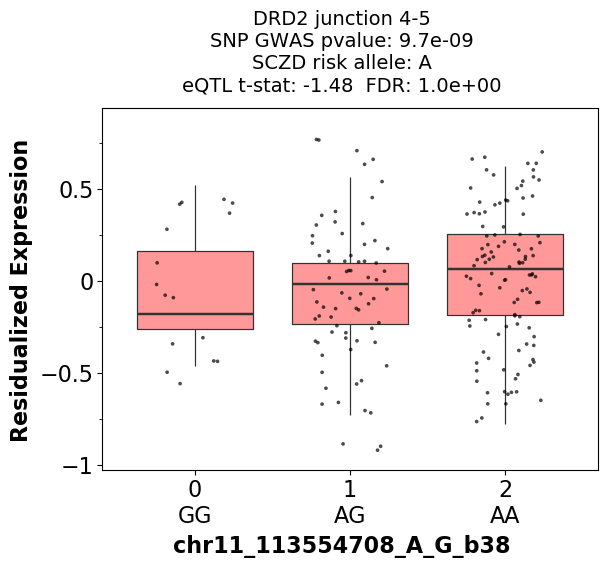

<ggplot: (8771524129028)>
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does not have significant eQTL.
DRD2 junction 3-5 does n

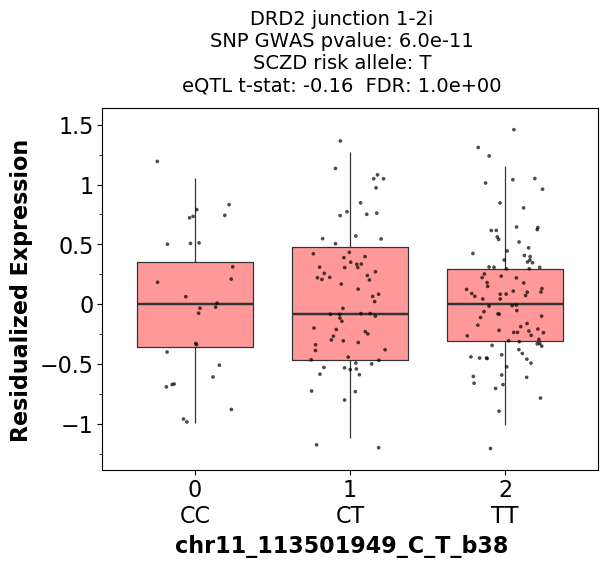

<ggplot: (8771445037294)>


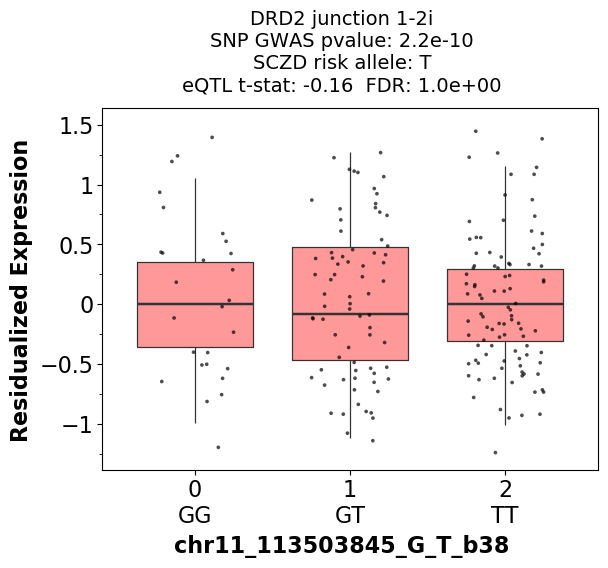

<ggplot: (8771445565245)>


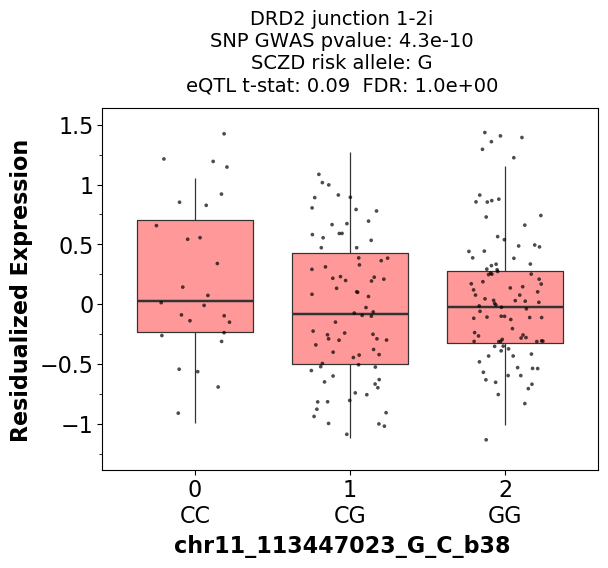

<ggplot: (8771524078243)>


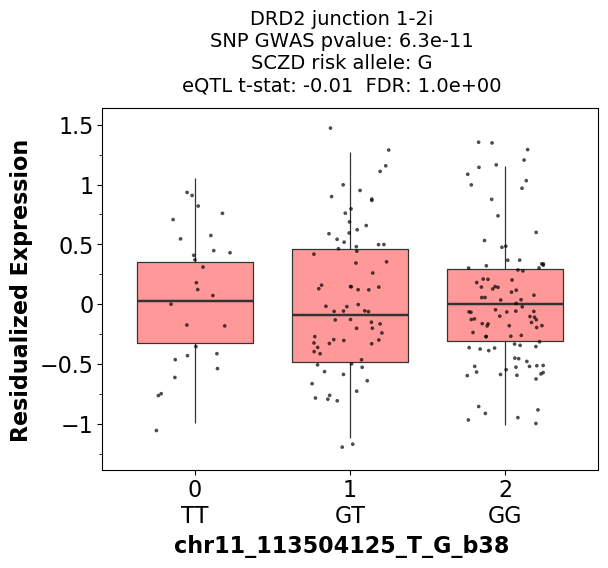

<ggplot: (8771445565431)>


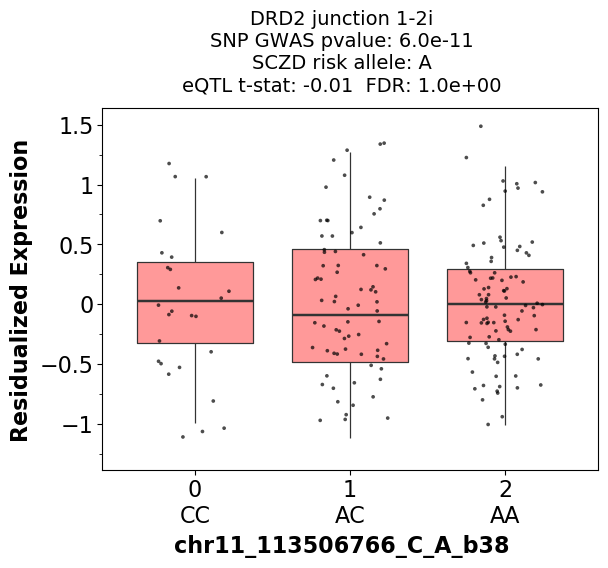

<ggplot: (8771524051827)>


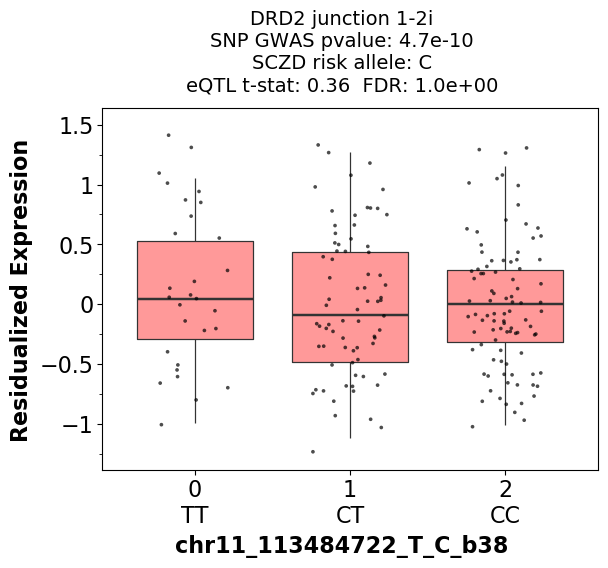

<ggplot: (8771523147361)>


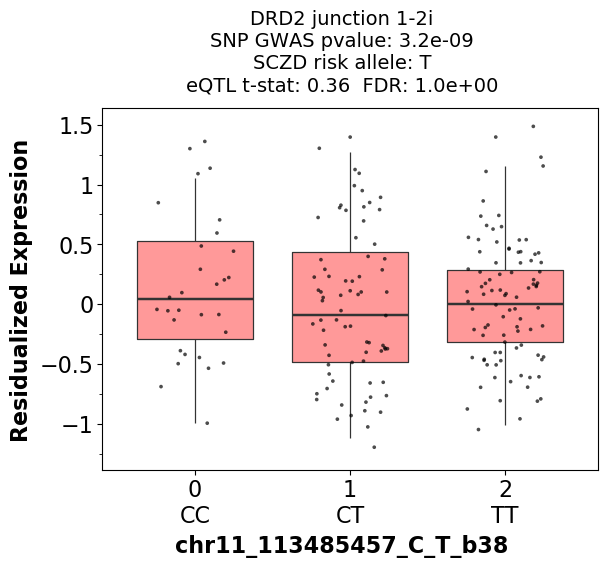

<ggplot: (8771523120890)>


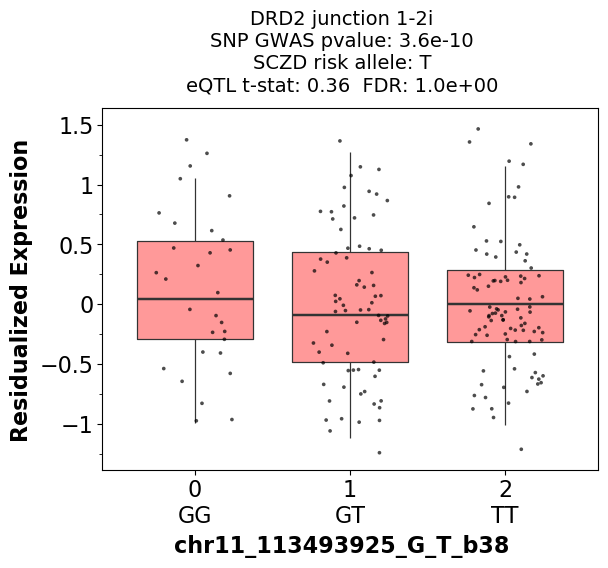

<ggplot: (8771523997832)>


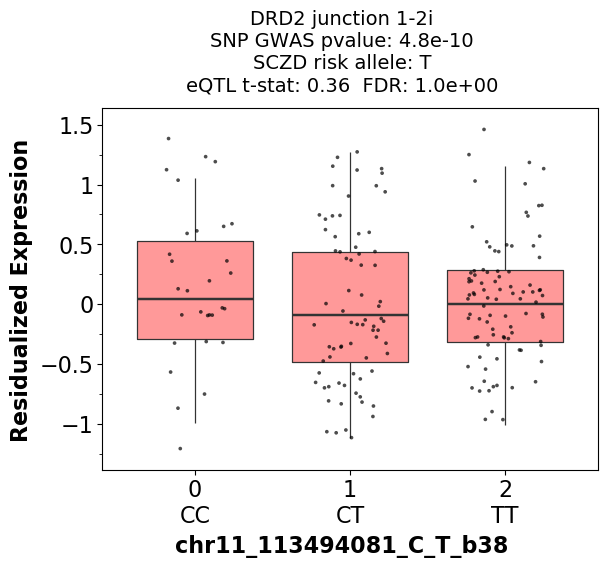

<ggplot: (8771524005771)>


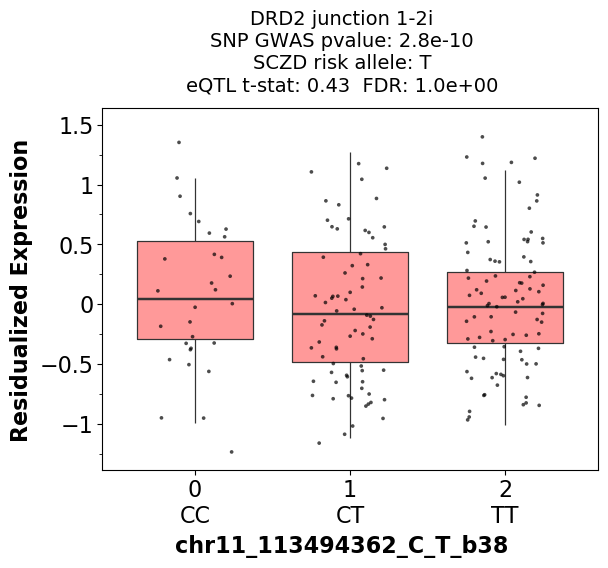

<ggplot: (8771524072729)>


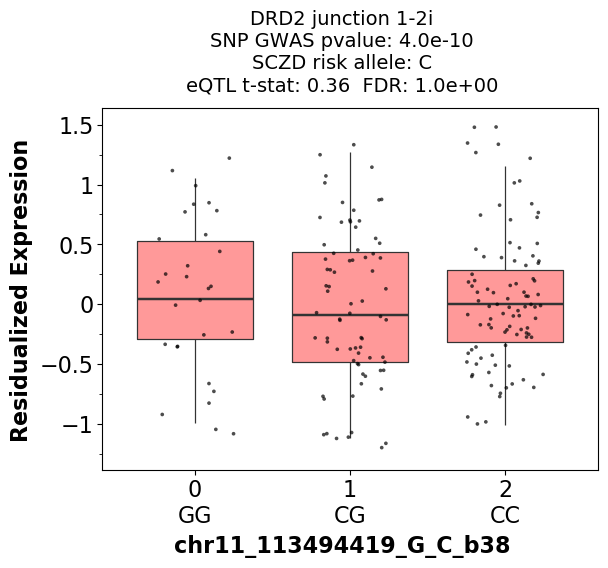

<ggplot: (8771445081095)>


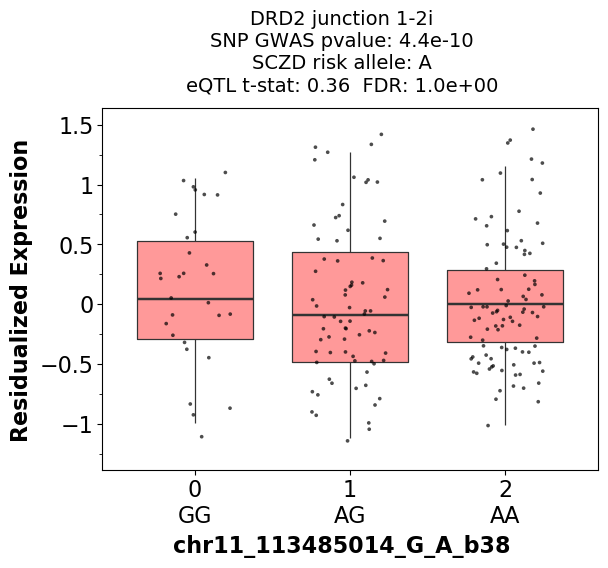

<ggplot: (8771523112114)>


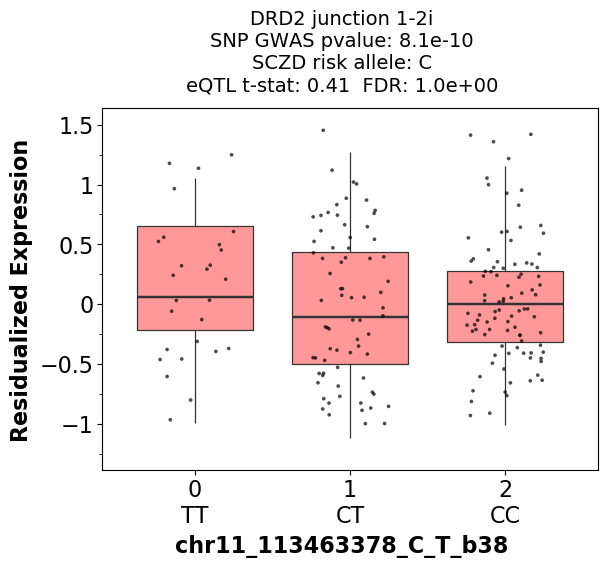

<ggplot: (8771445007237)>


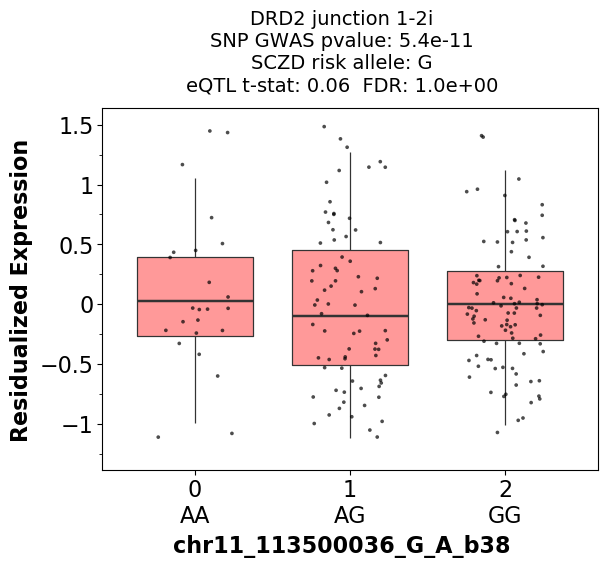

<ggplot: (8771445086422)>


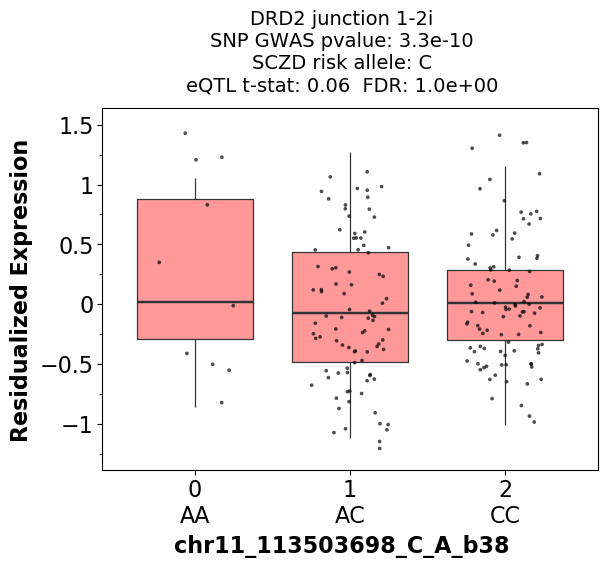

<ggplot: (8771523988920)>


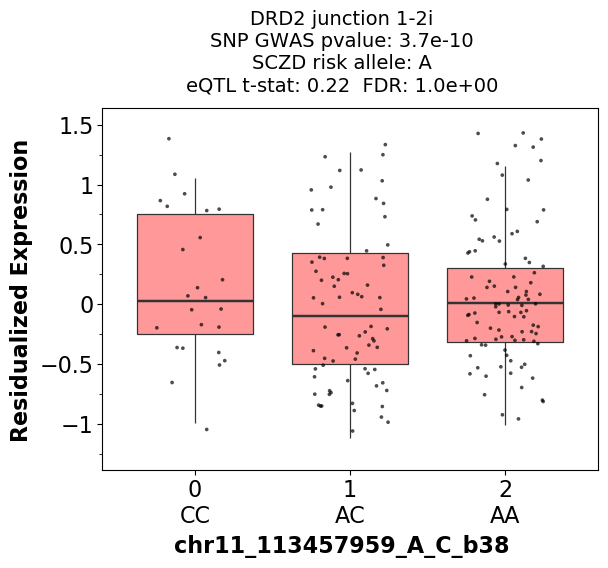

<ggplot: (8771445023573)>


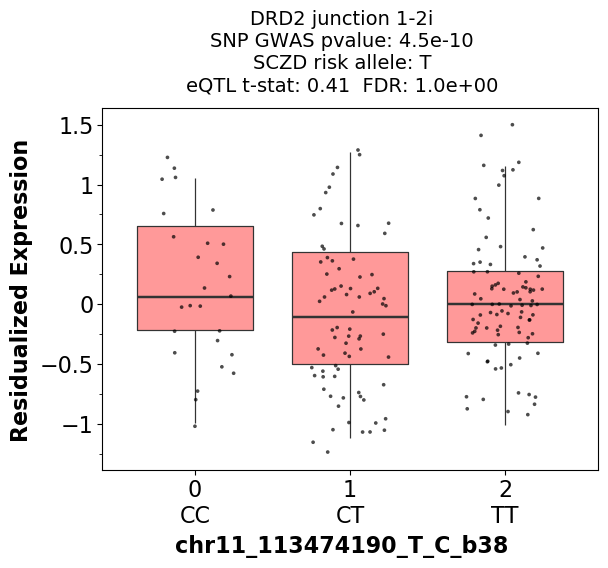

<ggplot: (8771445548216)>


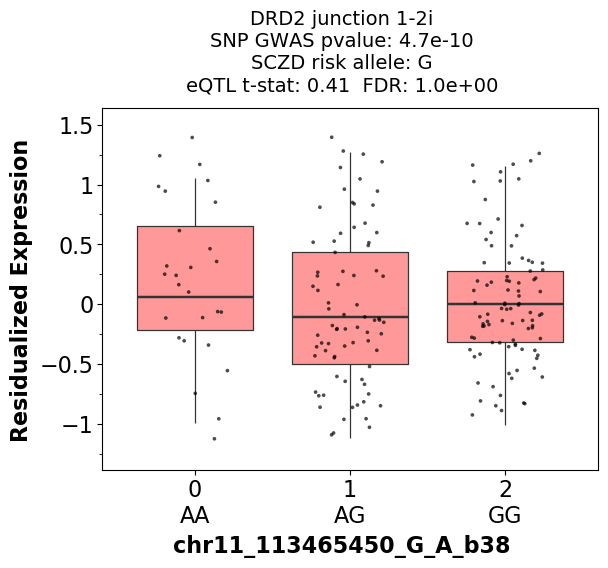

<ggplot: (8771524005756)>


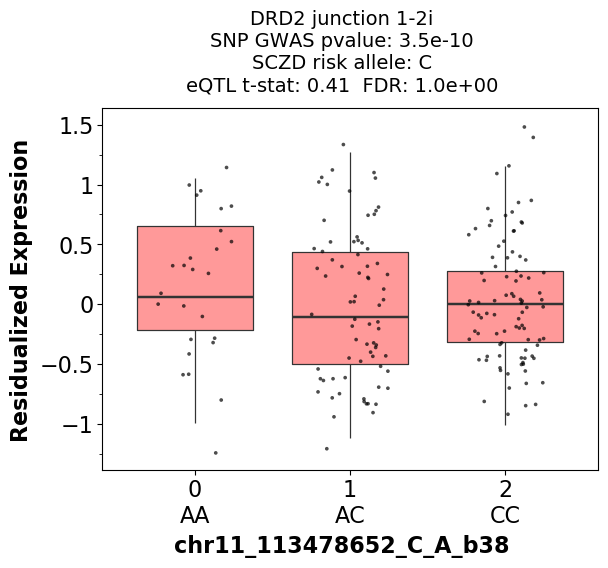

<ggplot: (8771445005397)>


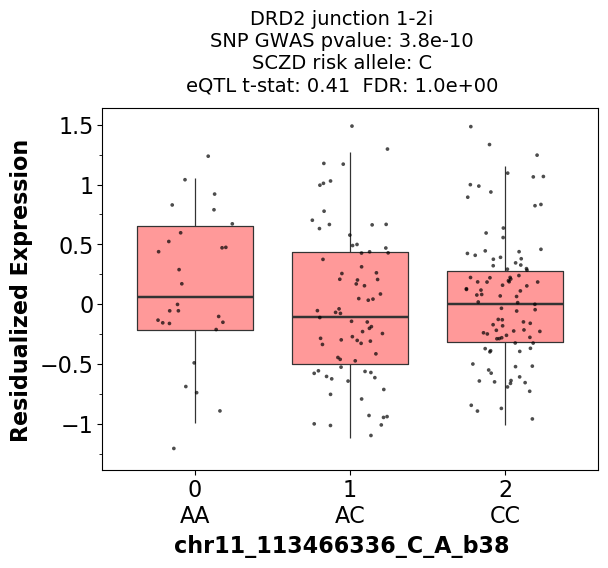

<ggplot: (8771524083002)>


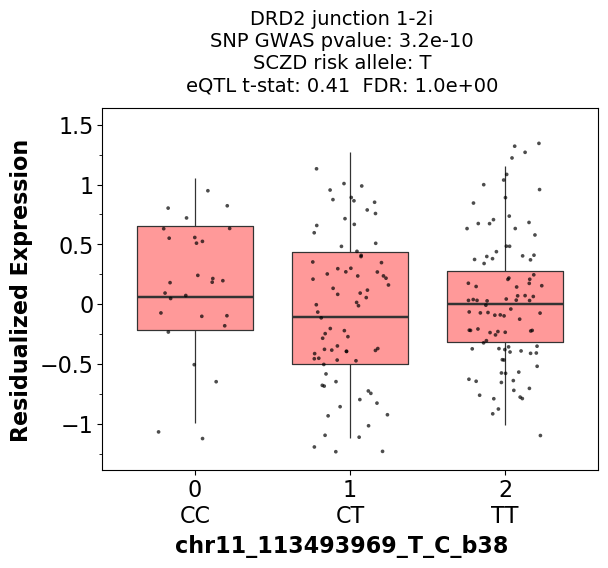

<ggplot: (8771445535377)>


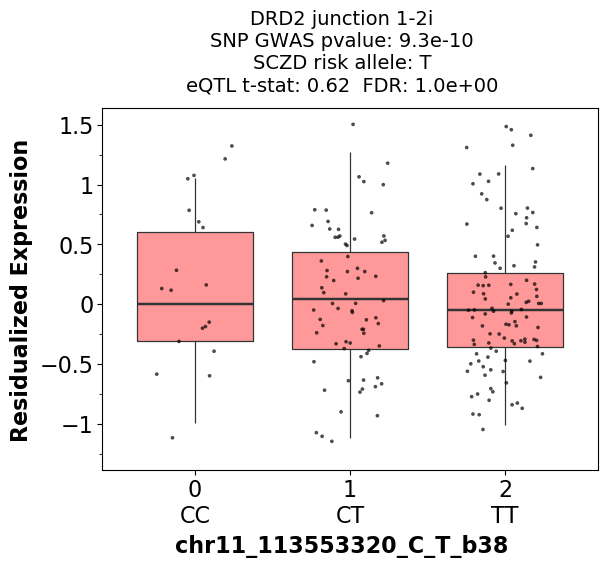

<ggplot: (8771524156941)>


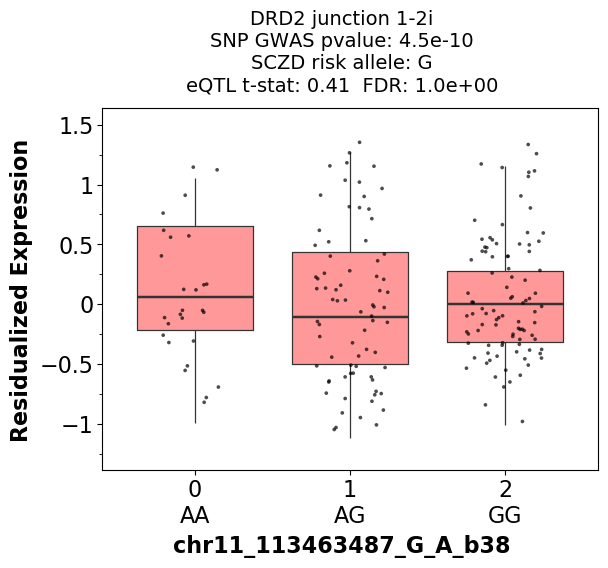

<ggplot: (8771444535589)>


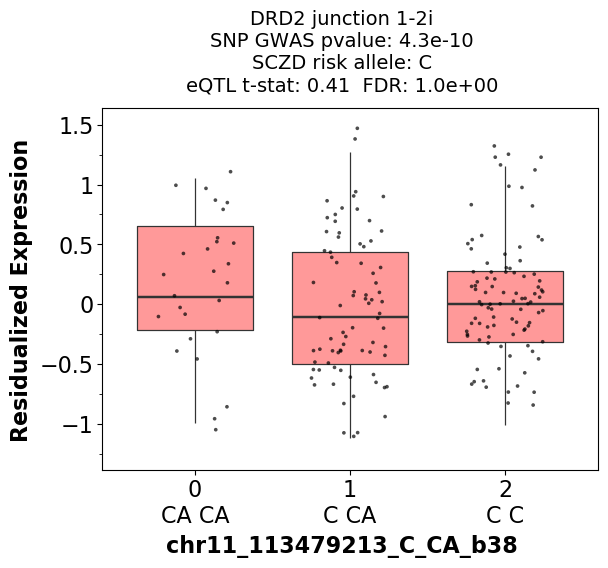

<ggplot: (8771524029528)>


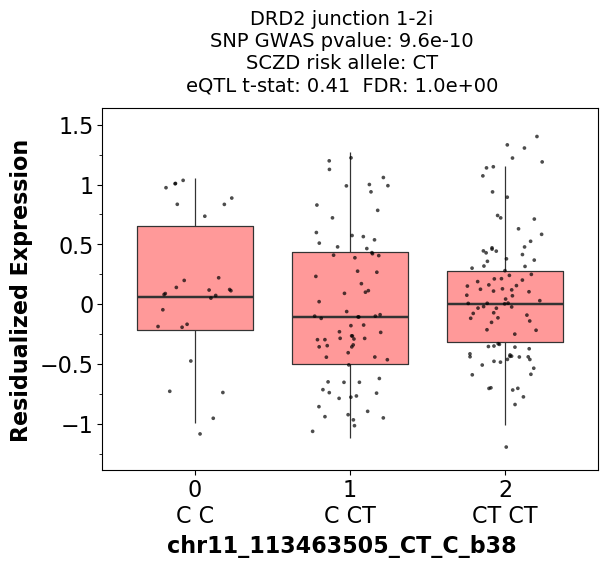

<ggplot: (8771444843527)>


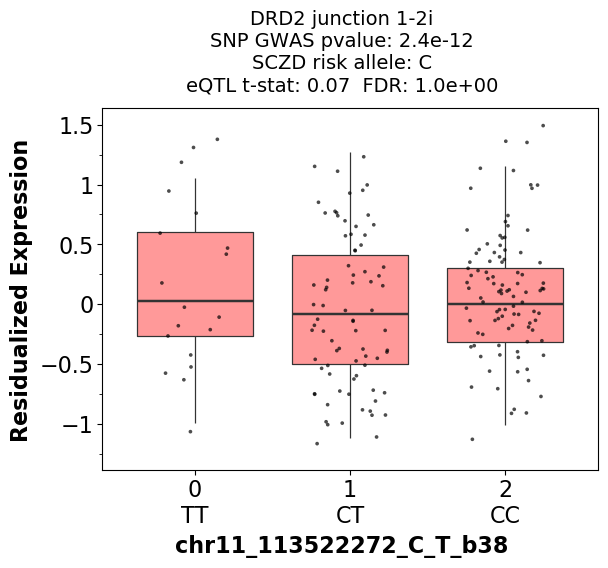

<ggplot: (8771445547632)>


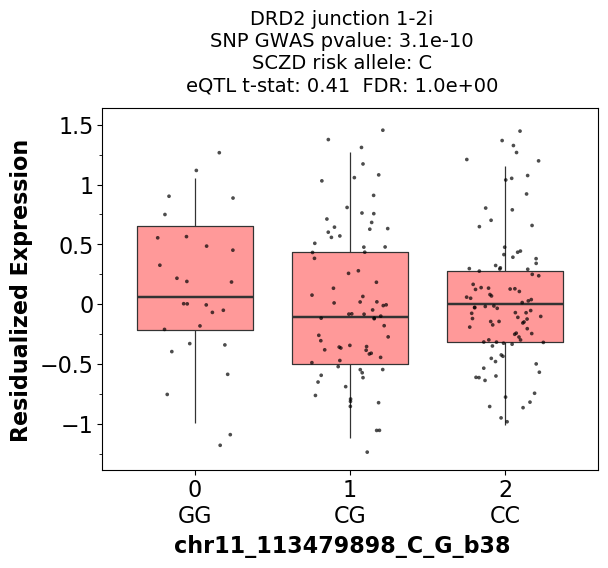

<ggplot: (8771445533266)>


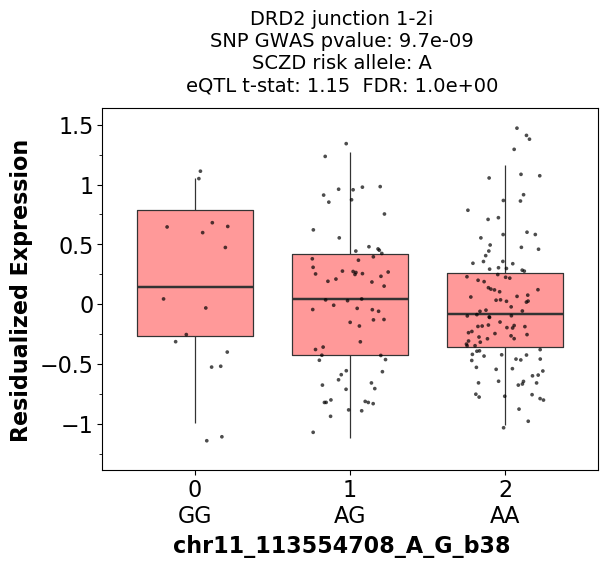

<ggplot: (8771524071437)>


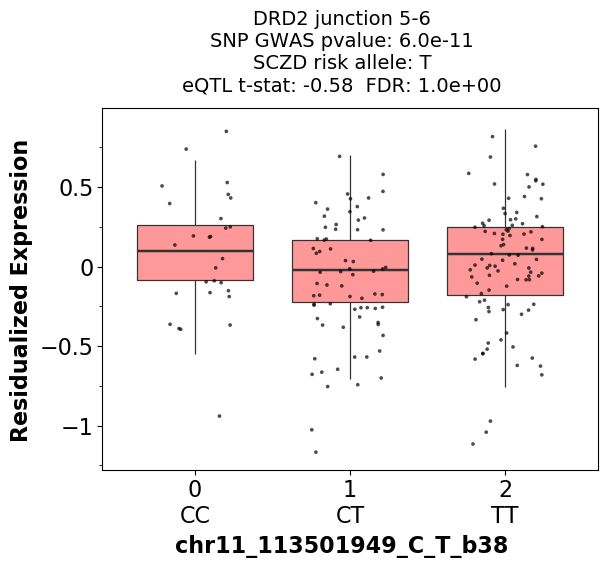

<ggplot: (8771524114577)>


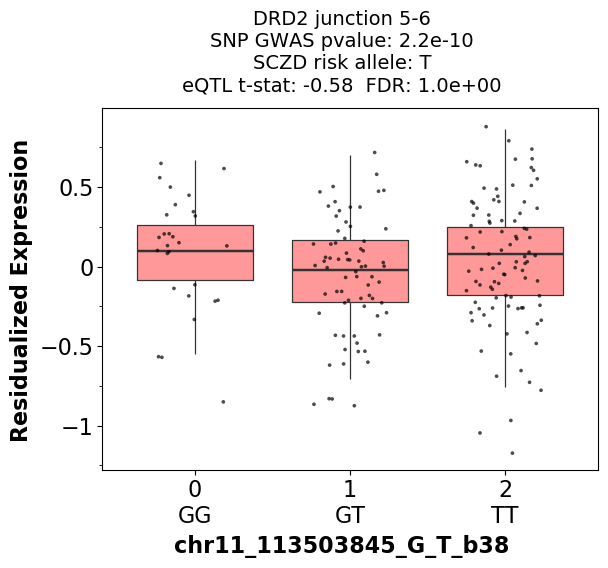

<ggplot: (8771523149418)>


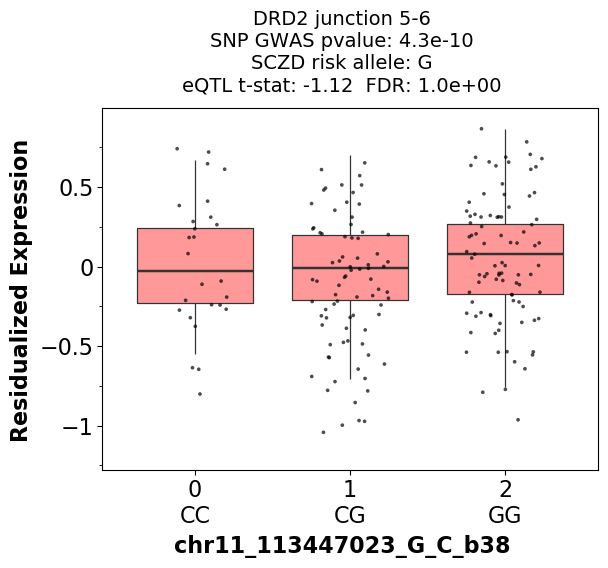

<ggplot: (8771523977229)>


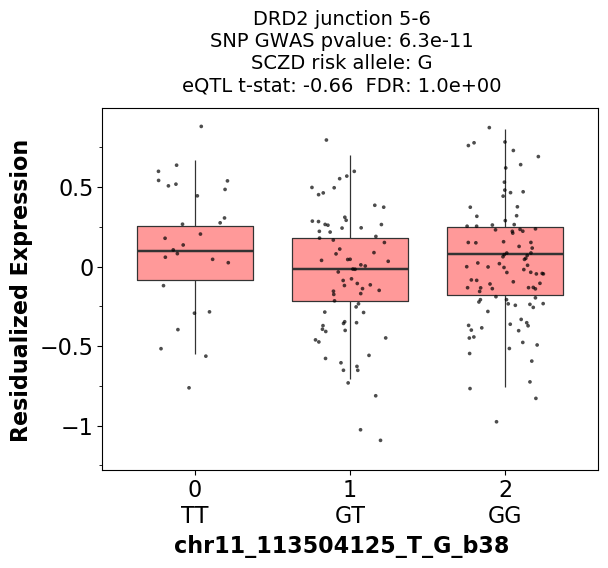

<ggplot: (8771445018188)>


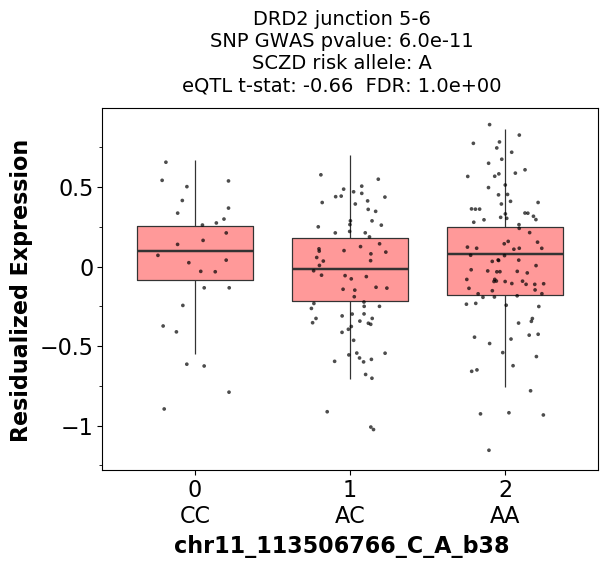

<ggplot: (8771445073749)>


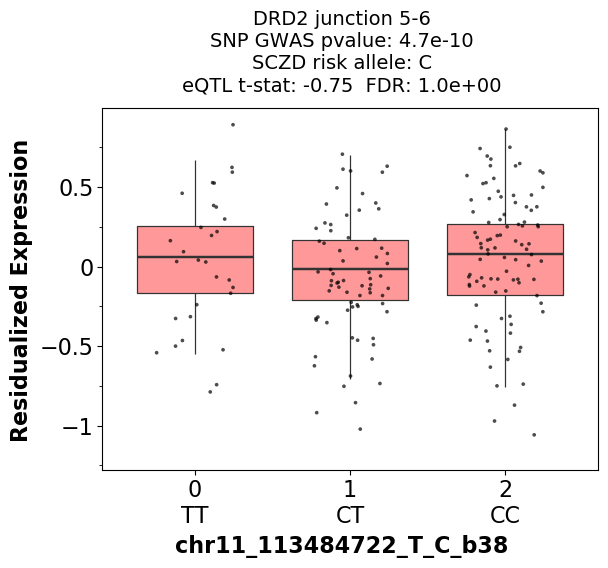

<ggplot: (8771523132127)>


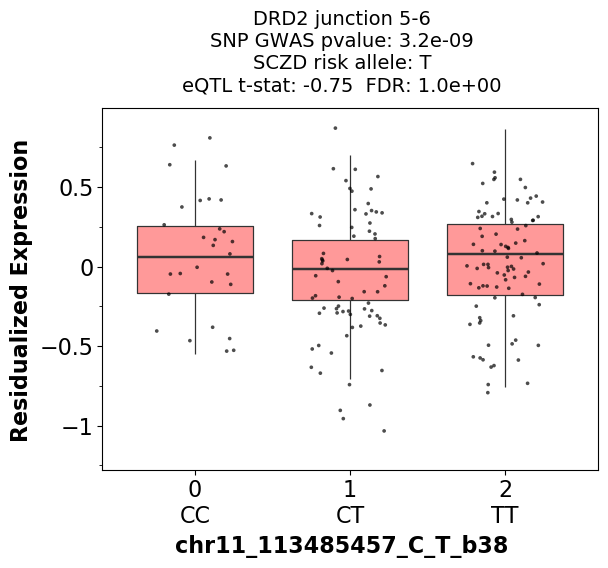

<ggplot: (8771524153727)>


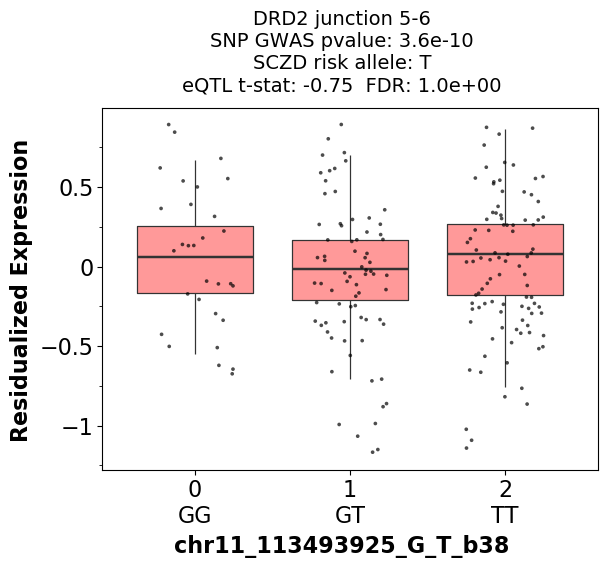

<ggplot: (8771524003681)>


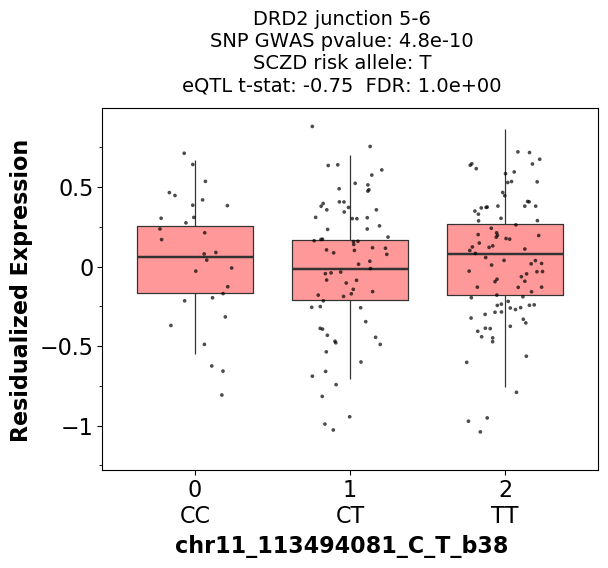

<ggplot: (8771444969280)>


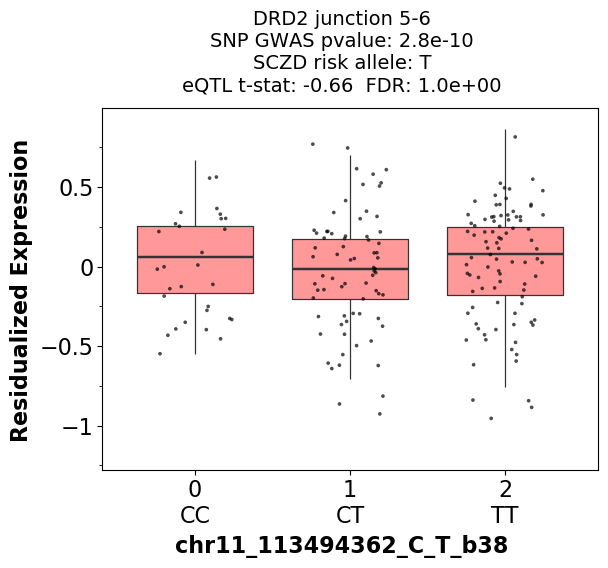

<ggplot: (8771444969265)>


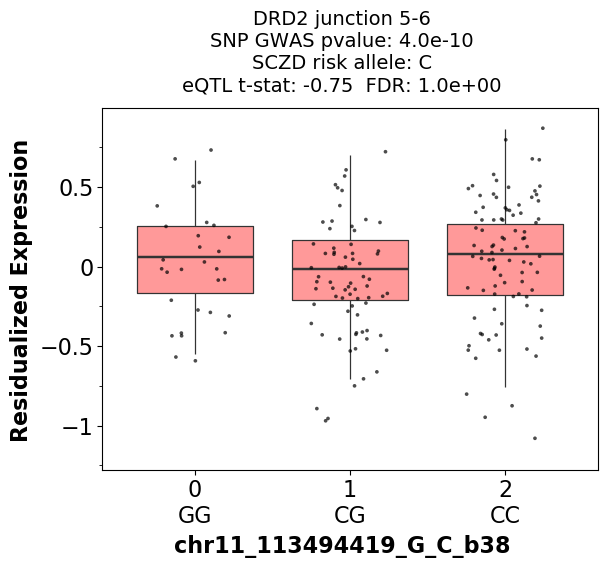

<ggplot: (8771523993962)>


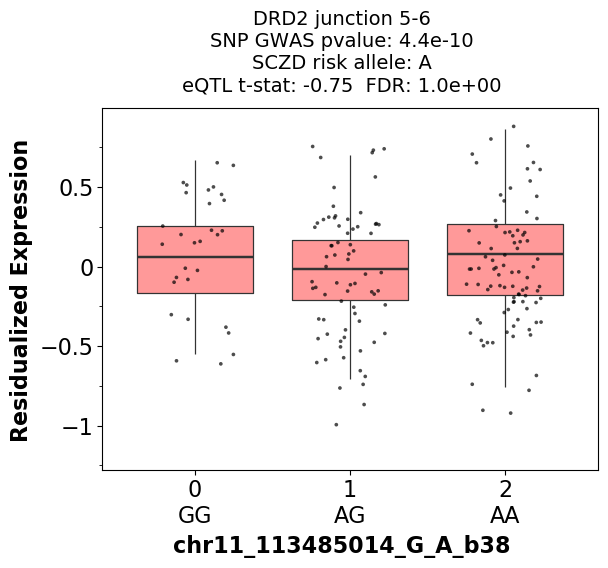

<ggplot: (8771445039165)>


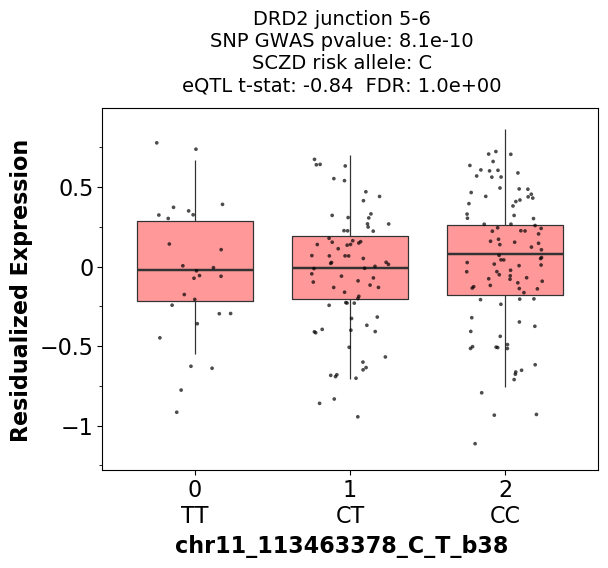

<ggplot: (8771523996197)>


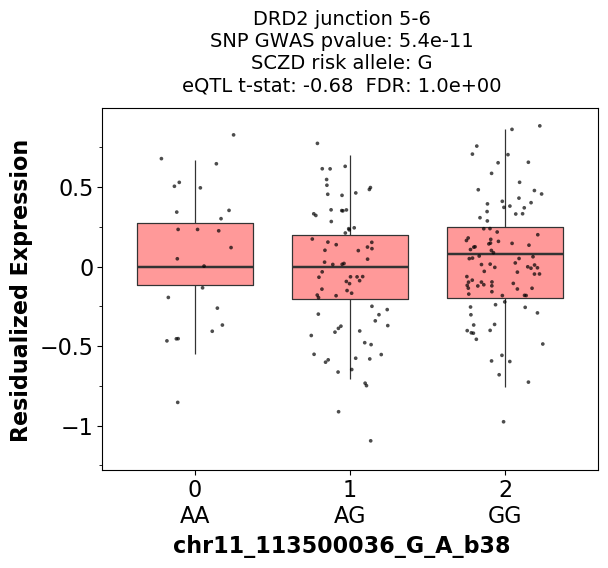

<ggplot: (8771524000702)>


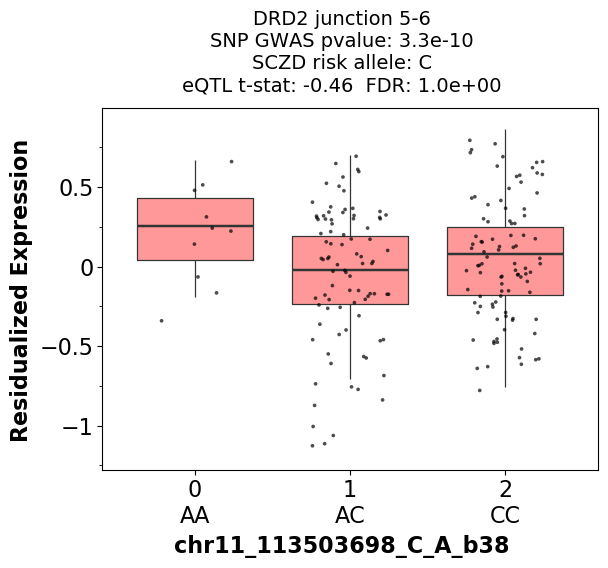

<ggplot: (8771445007210)>


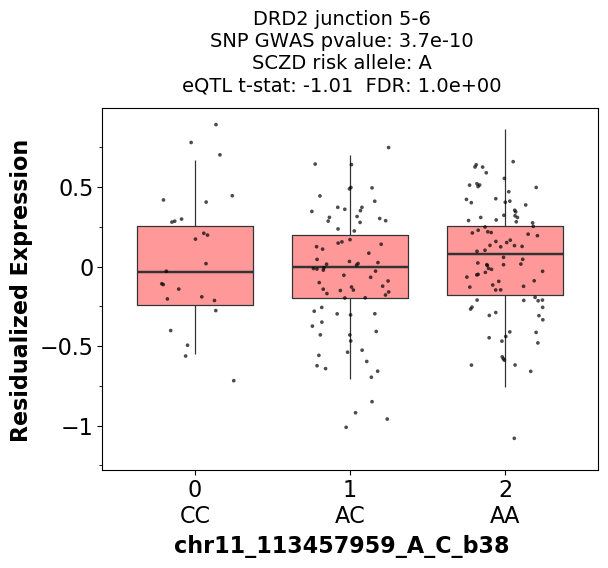

<ggplot: (8771444507850)>


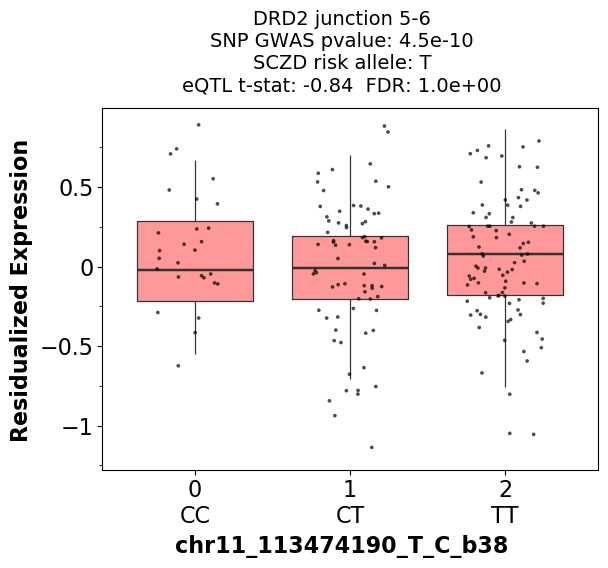

<ggplot: (8771523160209)>


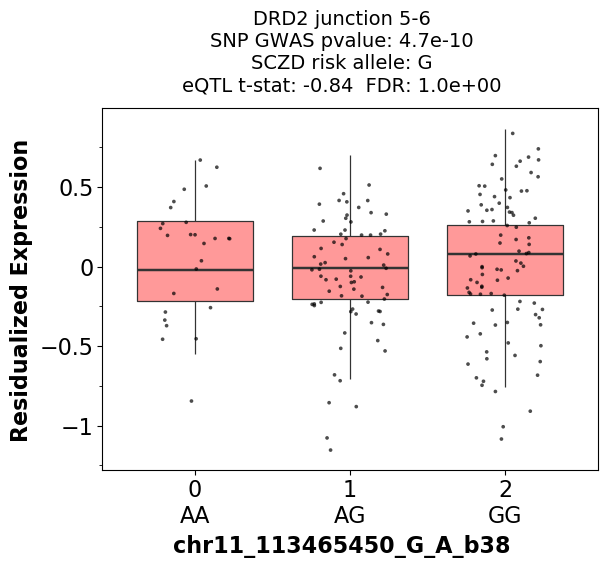

<ggplot: (8771444514199)>


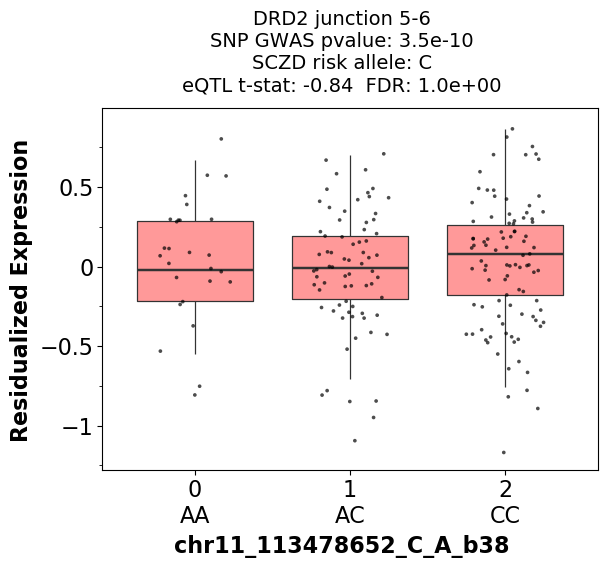

<ggplot: (8771523116153)>


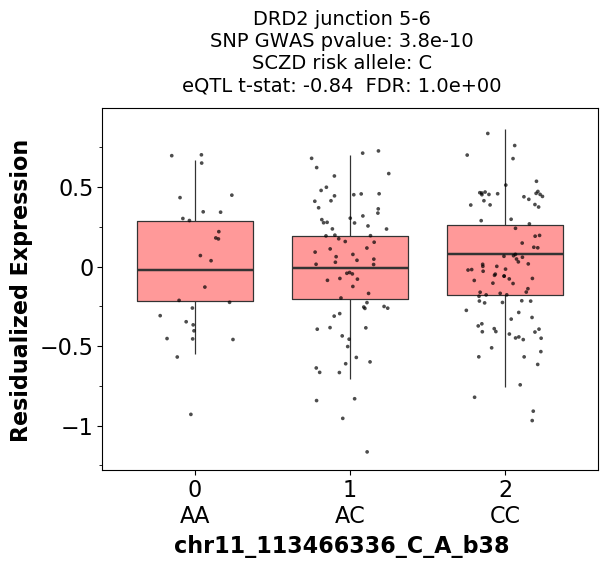

<ggplot: (8771445039138)>


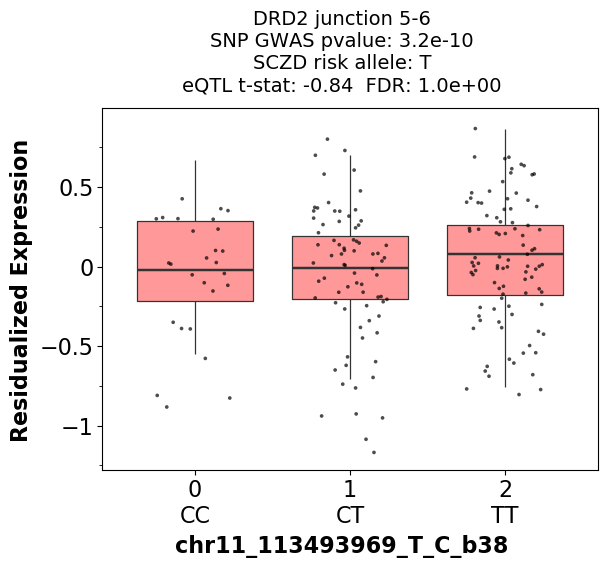

<ggplot: (8771524005714)>


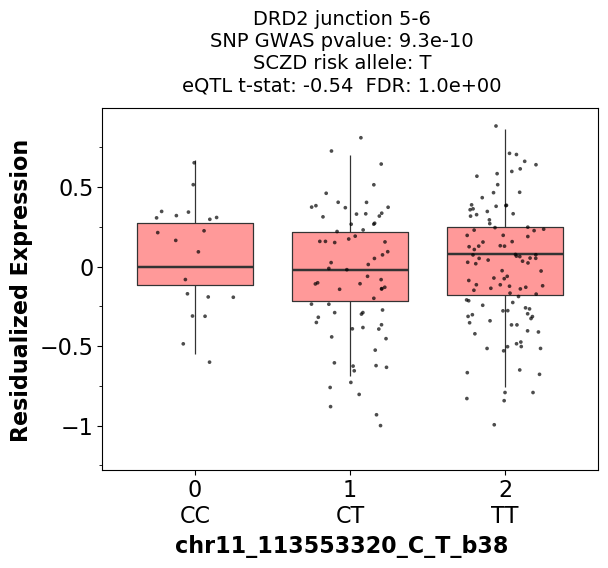

<ggplot: (8771445041580)>


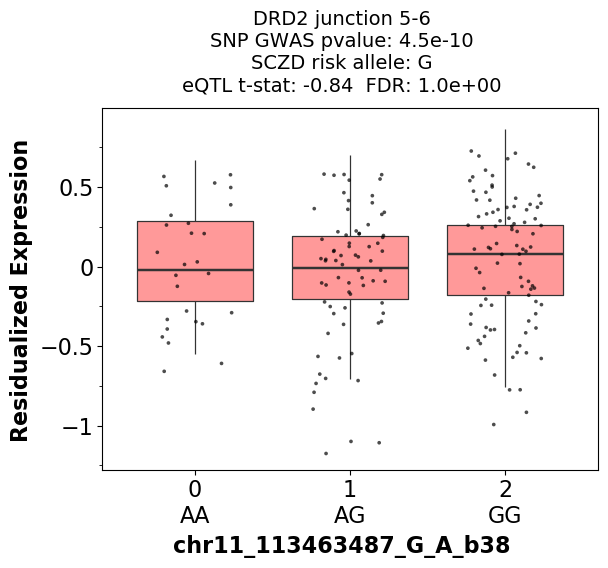

<ggplot: (8771524000395)>


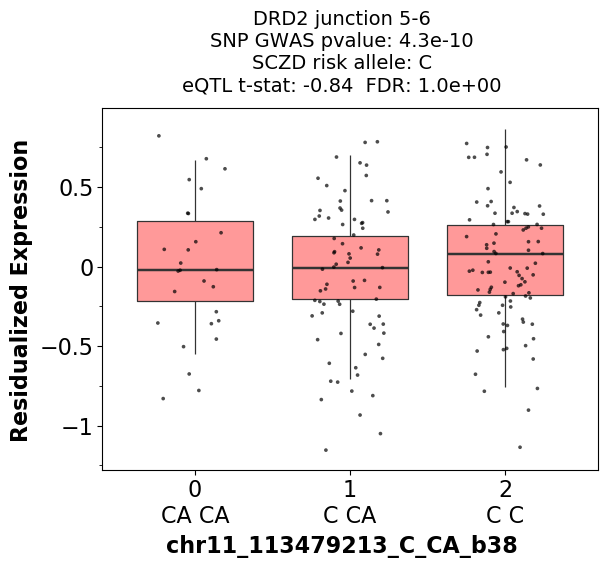

<ggplot: (8771524112195)>


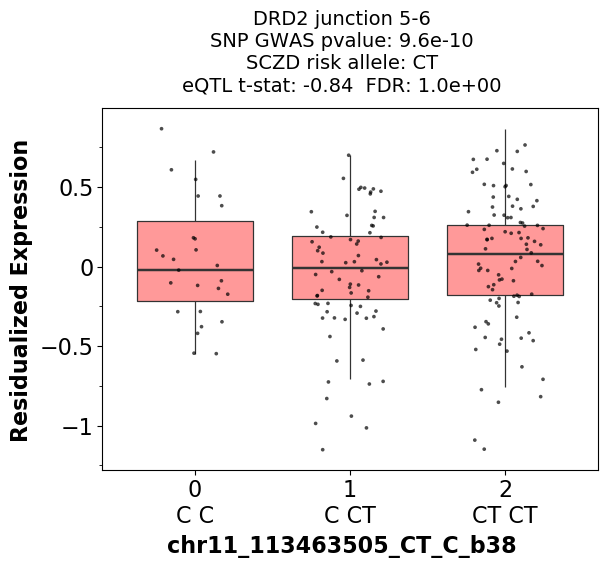

<ggplot: (8771445539142)>


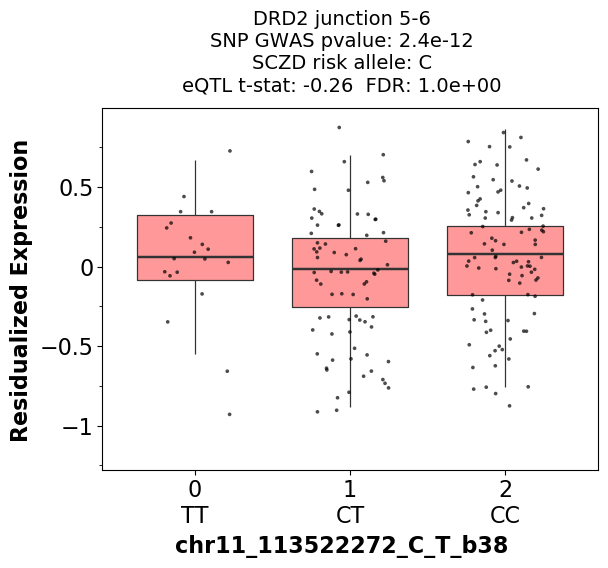

<ggplot: (8771444535667)>


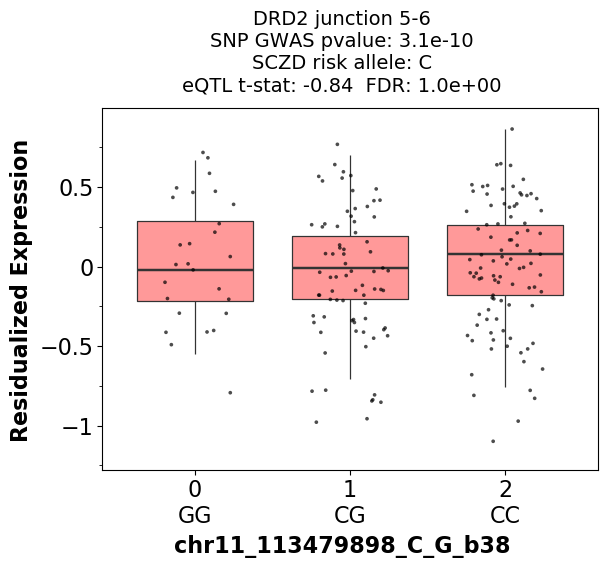

<ggplot: (8771523980490)>


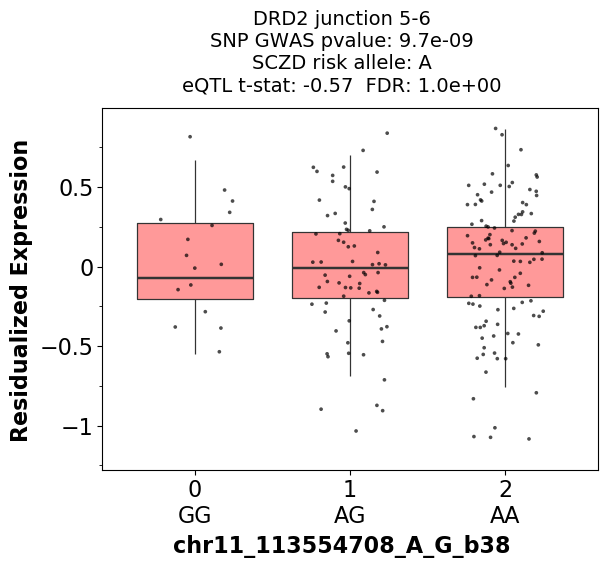

<ggplot: (8771444512127)>


In [26]:
feature = 'junctions'
mkdir_p(feature)
for junction_id in drd2_junctions:
    en = get_drd2_junction_annotation(junction_id).replace(' ','_').replace('-','_')
    anno_id = get_drd2_junction_annotation(junction_id)
    anno = "\n".join([anno_id, junction_id])
    for snp_id in snps.SNP_eqtl_gtex.unique():
        try:
            pp = gwas_annotated_eqtl_plot(snp_id, junction_id, [anno_id])
            print(pp)
            save_plot(pp, '%s/%s_drd2_eqtl_%s' % (feature, en, snp_id))
        except (IndexError, KeyError):
            print("%s does not have significant eQTL." % anno_id)